In [1]:
import os
import matplotlib
!pip install pyts
if (matplotlib.__version__) != '3.4.3' and (matplotlib.__version__) != '3.5.0' :
  ! pip install --upgrade matplotlib
  os.kill(os.getpid(), 9)
  # Restart runtime automatically : https://stackoverflow.com/a/53165687
  # After crashing, re-run the notebook again

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import copy
import warnings
import pyts
from scipy.signal import savgol_filter
from pyts.datasets import load_gunpoint
from pyts.decomposition import SingularSpectrumAnalysis
from scipy import signal
from scipy.fft import fft

warnings.filterwarnings('ignore')
sns.set_theme(style="whitegrid", palette="tab10") #"pastel"
%matplotlib inline

## Key Terms
*   Observations/samples : Number of data points present in a single cycle of charge/discharge in voltage or current or temperature etc..
*   Sampling rate: rate at which observations are logged 
*   Impedance : it is a way of representing resistance offered to change in supply by electronic components
*   CC mode : Constant current mode
*   CV mode : Constant voltage mode
*   Profiles : Variation (of parameter under observation) over time
*   Recovery voltage: Voltage recovered by the cell after discharging


In [3]:
# downloading data
if 'BatteryAgingARC-FY08Q4.zip' not in os.listdir():
  !wget 'https://ti.arc.nasa.gov/m/project/prognostic-repository/BatteryAgingARC-FY08Q4.zip'
  !unzip BatteryAgingARC-FY08Q4.zip

In [4]:
!cat README.txt

Data Description:
A set of four Li-ion batteries (# 5, 6, 7 and 18) were run through 3 different operational profiles (charge, discharge and impedance) at room temperature. Charging was carried out in a constant current (CC) mode at 1.5A until the battery voltage reached 4.2V and then continued in a constant voltage (CV) mode until the charge current dropped to 20mA. Discharge was carried out at a constant current (CC) level of 2A until the battery voltage fell to 2.7V, 2.5V, 2.2V and 2.5V for batteries 5 6 7 and 18 respectively. Impedance measurement was carried out through an electrochemical impedance spectroscopy (EIS) frequency sweep from 0.1Hz to 5kHz. Repeated charge and discharge cycles result in accelerated aging of the batteries while impedance measurements provide insight into the internal battery parameters that change as aging progresses. The experiments were stopped when the batteries reached end-of-life (EOL) criteria, which was a 30% fade in rated capacity (from 2Ahr to 

The dataset available here is in MATLAB's .mat format which contains nested structures. To proceed with using it in python, the following code is used from stackoverflow which utilizes 'loadmat' from scipy. It returns a nested datastructure with dictionaries and lists

In [5]:
# Source : https://stackoverflow.com/a/60364102

from scipy.io import loadmat, matlab
def load_mat(filename):
    """
    This function should be called instead of direct scipy.io.loadmat
    as it cures the problem of not properly recovering python dictionaries
    from mat files. It calls the function check keys to cure all entries
    which are still mat-objects
    """

    def _check_vars(d):
        """
        Checks if entries in dictionary are mat-objects. If yes
        todict is called to change them to nested dictionaries
        """
        for key in d:
            if isinstance(d[key], matlab.mio5_params.mat_struct):
                d[key] = _todict(d[key])
            elif isinstance(d[key], np.ndarray):
                d[key] = _toarray(d[key])
        return d

    def _todict(matobj):
        """
        A recursive function which constructs from matobjects nested dictionaries
        """
        d = {}
        for strg in matobj._fieldnames:
            elem = matobj.__dict__[strg]
            if isinstance(elem, matlab.mio5_params.mat_struct):
                d[strg] = _todict(elem)
            elif isinstance(elem, np.ndarray):
                d[strg] = _toarray(elem)
            else:
                d[strg] = elem
        return d

    def _toarray(ndarray):
        """
        A recursive function which constructs ndarray from cellarrays
        (which are loaded as numpy ndarrays), recursing into the elements
        if they contain matobjects.
        """
        if ndarray.dtype != 'float64':
            elem_list = []
            for sub_elem in ndarray:
                if isinstance(sub_elem, matlab.mio5_params.mat_struct):
                    elem_list.append(_todict(sub_elem))
                elif isinstance(sub_elem, np.ndarray):
                    elem_list.append(_toarray(sub_elem))
                else:
                    elem_list.append(sub_elem)
            return np.array(elem_list)
        else:
            return ndarray

    data = loadmat(filename, struct_as_record=False, squeeze_me=True)
    return _check_vars(data)

In [6]:
# For this analysis, B0005 data is used
B0005 = load_mat('B0005.mat')
B5 = B0005['B0005']['cycle'] # Array of dictionaries containing cycle data and parameters

*   This data is not possible to directly convert into a flat pandas file. this is due to the presence of irregular number of observations in charge and discharge cycles.
*   The following is an analysis on distribution of observations recorded and also cycle type count information




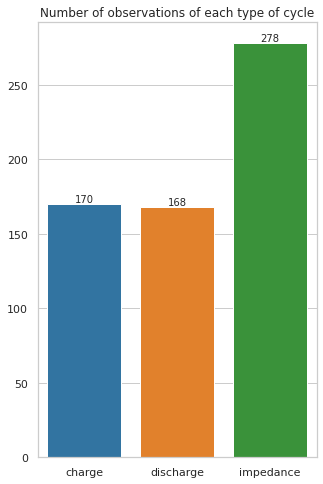

In [7]:
cycle_type_count = {'charge':0, 'discharge':0, 'impedance':0}
for i in B5:
  Ctype = i['type']
  cycle_type_count[Ctype]+=1

plt.figure(figsize=(5,8))
plt.title('Number of observations of each type of cycle')
ax = sns.barplot(x=list(cycle_type_count.keys()), 
            y=list(cycle_type_count.values()),
            label="Total")
ax.bar_label(ax.containers[0])
plt.show()


* It can be observed that the frequency of impedance measurements in the cycle data is significantly higher than charge and discharge measurements. This issue should be tackled in further steps.
* There are 2 charge cycles with out the presence of consecutive discharge cycles. they should be accounted and removed
* Similar count based analysis is extended to each category of observations in the cycle data  below

In [8]:
charge_keys = {'Time':[]}
for i in B5:
  if i['type']=='charge':
    charge_keys['Time'].append(len(i['data']['Time']))

discharge_keys = {'Time':[]}
for i in B5:
  if i['type']=='discharge':
    discharge_keys['Time'].append(len(i['data']['Time']))

imp_keys = {'imp_keys':[]}
for i in B5:
  if i['type']=='impedance':
    imp_keys['imp_keys'].append(len(i['data']['Battery_current']))   

* Plots of number of observations in each cycle category

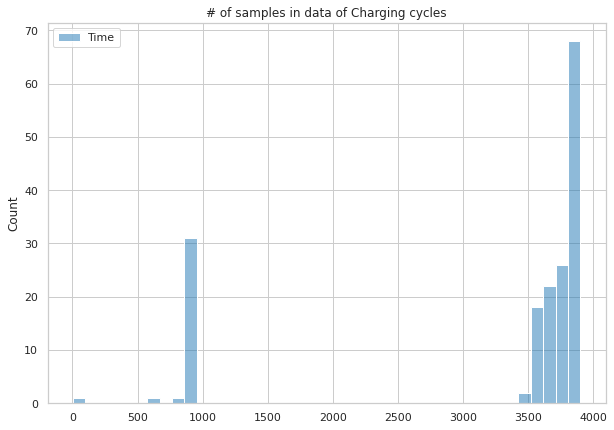

Min in charge :  5
Max in charge :  3900
25th 50th and 75th Percentiles :  [3565.25 3738.5  3834.75] 



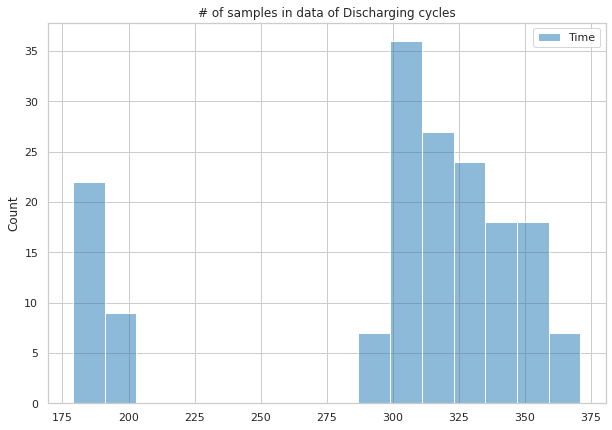

Min in discharge:  179
Max in discharge:  371
25th 50th and 75th Percentiles :  [300.   314.5  335.25] 



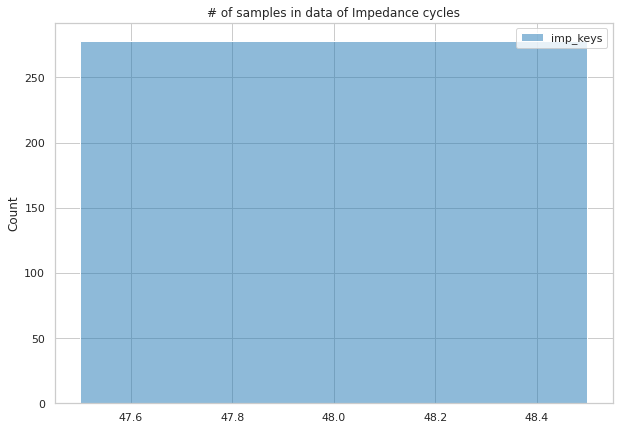

Min in Impedance:  48
max in Impedance:  48
25th 50th and 75th Percentiles :  [48. 48. 48.] 



In [9]:
plt.figure(figsize=(10,7))
sns.histplot(charge_keys)
plt.title('# of samples in data of Charging cycles')
plt.show()
print('Min in charge : ', min(list(charge_keys.values())[0]))
print('Max in charge : ', max(list(charge_keys.values())[0]))
print('25th 50th and 75th Percentiles : ', np.percentile(list(charge_keys.values())[0], [25,50, 75]),'\n')

plt.figure(figsize=(10,7))
sns.histplot(discharge_keys)
plt.title('# of samples in data of Discharging cycles')
plt.show()
print('Min in discharge: ', min(list(discharge_keys.values())[0]))
print('Max in discharge: ', max(list(discharge_keys.values())[0]))
print('25th 50th and 75th Percentiles : ', np.percentile(list(discharge_keys.values())[0], [25,50, 75]),'\n')

plt.figure(figsize=(10,7))
sns.histplot(imp_keys)
plt.title('# of samples in data of Impedance cycles')
plt.show()
print('Min in Impedance: ', min(list(imp_keys.values())[0]))
print('max in Impedance: ', max(list(imp_keys.values())[0]))
print('25th 50th and 75th Percentiles : ', np.percentile(list(imp_keys.values())[0], [25,50, 75]),'\n')

* The number of observations in each cycle are shown above. In charging cycles, the number of observations are as high as 4000 samples for a cycle. Some observations are very close to 5 observations as well,which is possibly an outlier

* In Discharge cycles, Majority number of datapoints are distributed near 300 observations which is a fairly good number of observations for extraction of useful observations. Lowest values lies close to 179 data points which is also sufficient for analysis

* All of the impedance measurements are recorded with 48 datapoints

* In percentile information for discharge cycle, 25th percentile values is 300 rest of the values are less than it which is a sufficient data

<hr>

## Outlier analysis

### Charge cycles

In [10]:
# Analysing charge cycle recorded durations
# Segregating all charge cycles 
Ids = []
for i, _ in  enumerate(B5):
  if B5[i]['type'] == 'charge':
    Ids.append(i)
print('Number of charge cycles = ', len(Ids))

Number of charge cycles =  170


Finding Outliers in charge data

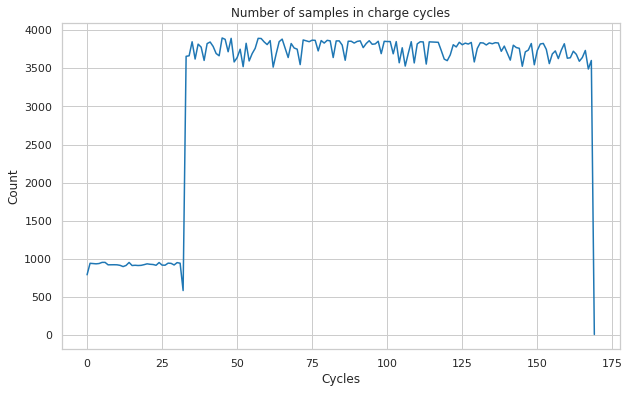

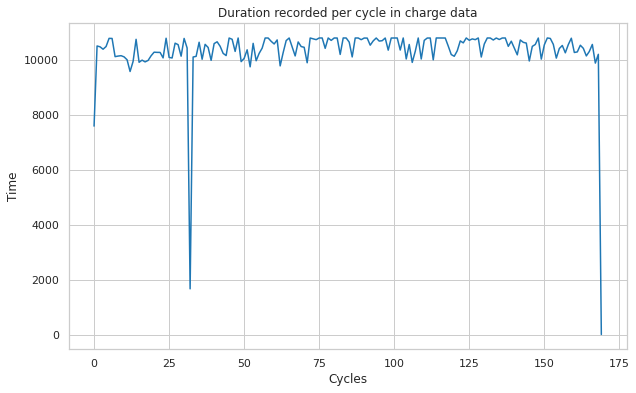

Observations having less count :  35
Observations having count < 600 :  2


In [11]:
# By comparing no of observations per cycle and max values in 'Time', outliers can be identified
time = []
for d in Ids:
  time.append(B5[d]['data']['Time'])
# Lets check lengths and max values
plt.figure(figsize=(10,6))
plt.plot([len(i) for i in time])
plt.title('Number of samples in charge cycles')
plt.xlabel('Cycles')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(10,6))
plt.plot([max(i) for i in time])
plt.title('Duration recorded per cycle in charge data')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.show()

print('Observations having less count : ', len([i for i in time if len(i)< 3500]))
print('Observations having count < 600 : ', len([i for i in time if len(i)< 600]))

* Plot-1: The y-axis in the plot is the length of observations i.e voltage/current. x-axis is cycle. 
* Plot-2: y-axis is Time. For every cycle logged, there is a Time data recorded in seconds which contains time stamps at which a single observation is recorded. The highest value in the Time column is the last time stamp. x-axis is cycle data.
* As uncovered in the above analysis, there are set of observations with low sampling rate than others (less than 1000 observations per cycle)
* There is a strong dip in max values in 2 places which should be removed, they are not properly logged. The observations logged are less than 600 datapoints

In [12]:
print('Ids of observations having count < 600 : ', ([Ids[i] for i,t in enumerate(time) if len(t)< 600]))

Ids of observations having count < 600 :  [84, 615]


In [13]:
# removing the two indices and updating data
B5 = np.delete(B5, [84,615])

### Discharge cycles

In [14]:
# Analysing discharge cycle recorded durations
# Segregating all charge cycles 
Ids = []
for i, _ in  enumerate(B5):
  if B5[i]['type'] == 'discharge':
    Ids.append(i)
print('Number of discharge cycles = ', len(Ids))

Number of discharge cycles =  168


Finding outliers in discharge data

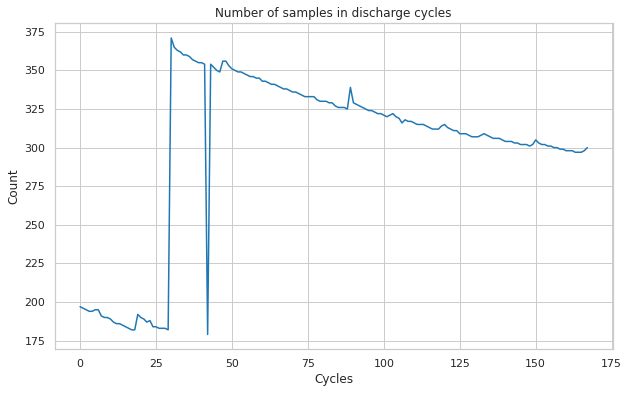

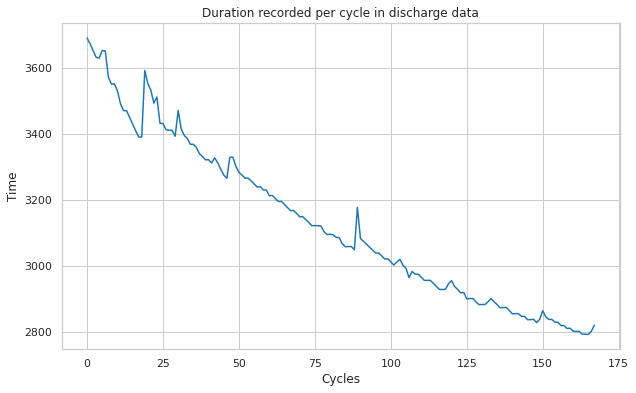

Observations having less count :  31


In [15]:
time = []
for d in Ids:
  time.append(B5[d]['data']['Time'])
# Lets check lengths and max values
plt.figure(figsize=(10,6))
plt.plot([len(i) for i in time])
plt.title('Number of samples in discharge cycles')
plt.xlabel('Cycles')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(10,6))
plt.plot([max(i) for i in time])
plt.title('Duration recorded per cycle in discharge data')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.show()

print('Observations having less count : ', len([i for i in time if len(i)< 275]))

* Plot-1: The y-axis in the plot is the length of observations i.e voltage/current. x-axis is cycle. 
* Plot-2: y-axis is Time. For every cycle logged, there is a Time data recorded in seconds which contains time stamps at which a single observation is recorded. The highest value in the Time column is the last time stamp. x-axis is cycle data.
* In number of samples plot, there is a drop in observations between 25 and 50 cycles. 
however, the diff in the observations from maximum values is relatively lower than the case in charge cycles. 
* Even though there is a drop in number of observations, the max values for the corresponding observations are not abnormal. so by interpolation, the observations can be upsampled (or downsamples if needed)

<hr>

## Individual Cycle analysis

### Charge cycles

* Observing profiles of each signal in charge data via plots

In [16]:
# Segregating charge data
charge_data = [point for point in B5 if point['type']=='charge']
# Get keys of data
cprofiles = list(charge_data[0]['data'].keys())
# Removing time data as it no info about cell is present
cprofiles.remove('Time') 
print('Parameters in charge data: ', cprofiles)

Parameters in charge data:  ['Voltage_measured', 'Current_measured', 'Temperature_measured', 'Current_charge', 'Voltage_charge']


In [17]:
def get_cycle_plots(data,profiles,id0=None,idn=None,overlap=False):
  '''
  Description: Plots characteristics of observation for given cycles
  Arguments:
    data - charge/discharge 
    profiles - List of characteristic observations in a cycle
    id0 - initial index for comparision
    idn - Final index for comparision
    overlap - Plot on same axis or different axes
  Returns : 
    - Nothing
  '''

  xax = len(profiles)
  fig,ax = plt.subplots(xax,2, figsize=(16,30))
  if idn < 0 or idn==None:
    'Incase if ids are not mentioned'
    idn = len(data)+idn
  if idn > len(data):
    print('Using last index in data')
    idn = len(data)

  if overlap==False:
    # 2 different plots for 2 indices
    for i,_ in enumerate(profiles):
      plt.subplot(xax, 2, (2*(i+1)-1))
      sns.lineplot(x=data[id0]['data']['Time']/60, 
                   y=data[id0]['data'][profiles[i]], 
                   label='cycle:'+str(id0),
                   color='g')
      plt.title('Cycle : '+str(id0)+' - '+profiles[i])

      plt.subplot(xax, 2, 2*(i+1))
      sns.lineplot(x=data[idn]['data']['Time']/60, 
                   y=data[idn]['data'][profiles[i]],
                   label='cycle:'+str(idn),
                   color='r')
      plt.title('Cycle : '+str(idn)+' - '+profiles[i])
    plt.show()
    return
    
  else:
    # 2 plots on same indices
    for i,_ in enumerate(profiles):
      plt.subplot(xax, 1, i+1)
      sns.lineplot(x=data[id0]['data']['Time']/60, 
                   y=data[id0]['data'][profiles[i]], 
                   label='cycle:'+str(id0),
                   color='g')
      sns.lineplot(x=data[idn]['data']['Time']/60, 
                   y=data[idn]['data'][profiles[i]],
                   label='cycle:'+str(idn),
                   color='r')
      plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])
    
    plt.show()
    return

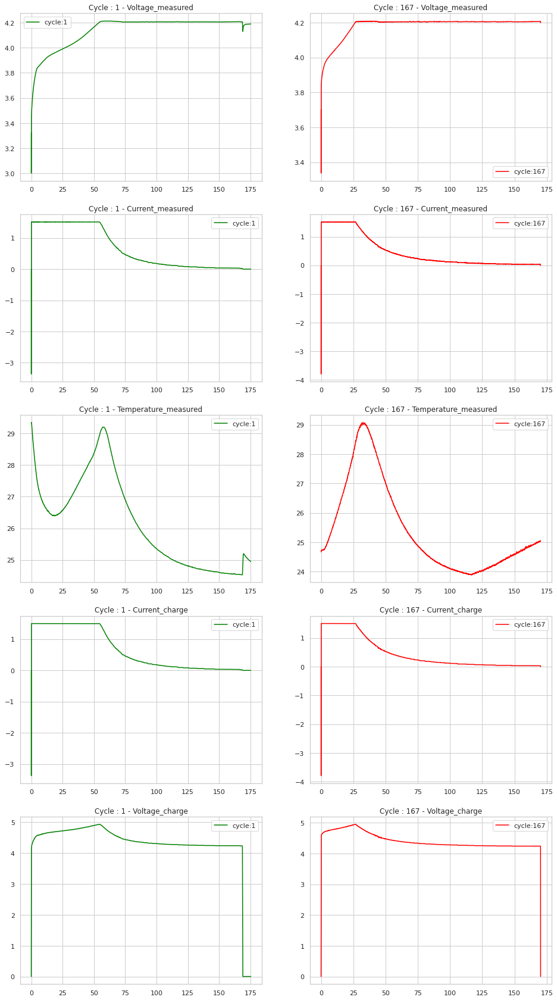

In [18]:
get_cycle_plots(data=charge_data,id0=1,idn=-1,profiles=cprofiles,overlap=False)

* From the plots above, it can be observed that the cell in 167th cycle is staying in Constant current mode for shorter duration and staying in constant current mode for longer duration than the cell at cycle 1
* There is a trend of temperature increase as long as the battery stays in CC mode and then slowly decreasing as the mode shifts to CV mode. 
* However, the temperature variation is present due to the addition of initial temperature in the system. this makes the assumption in the above point slightly weak
* This initial temperature can be incorporated into the feature set along with max temp difference and also temperature decay rate
* There are also some irregularities in the data (eg: voltage at the end of cycle 1), which should be smoothned 
* 3D plots can be used to visualise a bit better on how parameters are varying over time

* 3D plots

In [19]:
# https://stackoverflow.com/a/23968448
def plot_3d(data, param):
  '''
  This function creates 3D plot of charge/discharge data 
  given which profile
  Arguments: 
    data: charge/discharge data
    param: One of the parameters of data
  returns: 
    - Nothing
  '''

  def apply_padding(arr, size):
      # Pad: https://stackoverflow.com/a/3438818
      arr += [0] * (size - len(arr))
      # using np.nan is more meaningful but cmap
      # in matplotlib is not functioning properly,
      #  so replaced np.nan with 0 at [np.nan] in the beginning 
      return arr

  obsrvs = []
  for i in data:    
    obsrvs.append(i['data'][param].tolist())
  # Applying padding as all observations are not of the same size
  max_size = max([len(i) for i in obsrvs])
  for i,_ in enumerate(obsrvs):
    obsrvs[i] = apply_padding(obsrvs[i], max_size)
  obsrvs = np.array(obsrvs)
  # Data prep
  x = np.arange(0,obsrvs.shape[1])
  y = np.arange(0,obsrvs.shape[0])
  X,Y = np.meshgrid(x,y)
  Z = obsrvs
  # Plots
  fig = plt.figure(figsize=(16,8))
  ax = fig.add_subplot(111, projection='3d')
  surf = ax.plot_surface(X,Y,Z,cmap = 'viridis',lw=0.3)
  ax.set_title(param);
  ax.set_xlabel("Index(time)")
  ax.set_ylabel("Cycles")
  ax.set_zlabel("Magnitude")
  # ax.view_init(20,-90)  # Change view_init angles to view different sides
  ax.view_init(elev=elev, azim=azim) # Angles
  fig.colorbar(surf, shrink=0.5, aspect=10)
  plt.show()


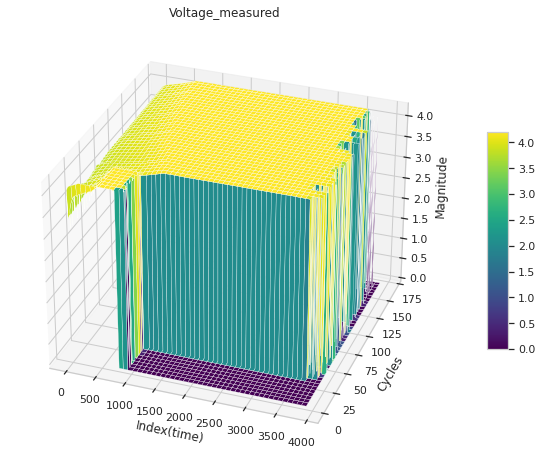

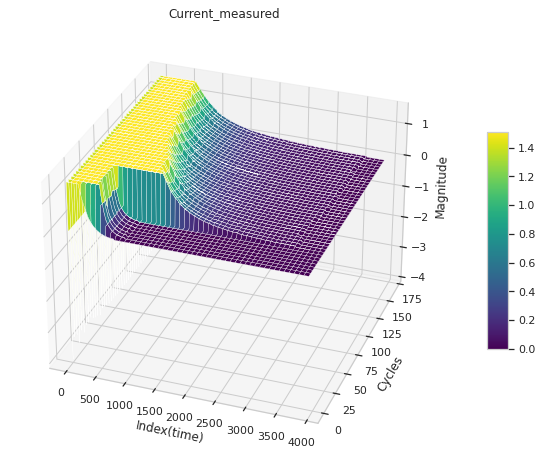

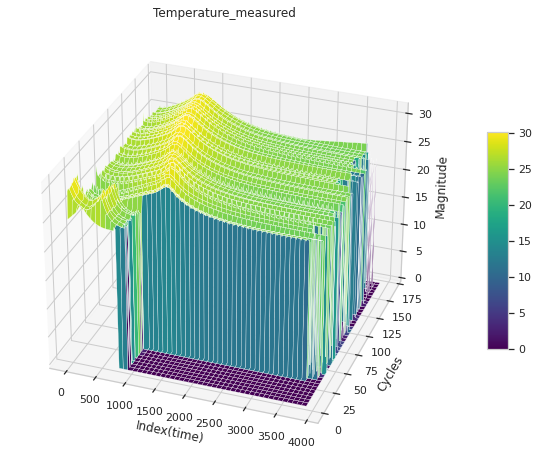

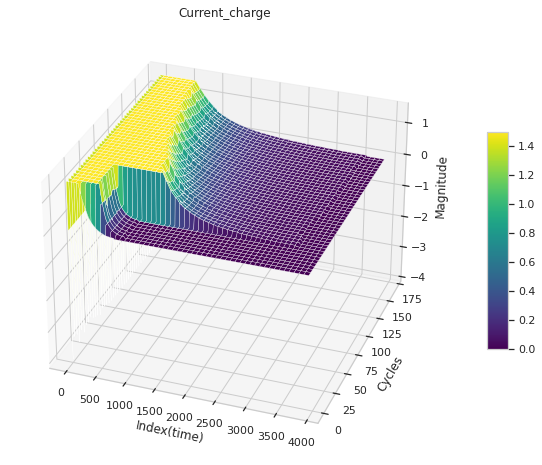

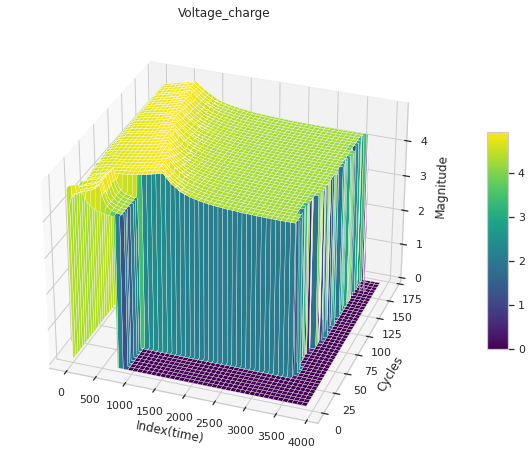

In [20]:
# Modify to control plot's view
elev, azim =30, -70
for param in cprofiles:
  plot_3d(charge_data, param)

* From the above plot, it can be clearely observed that there is a shortage in initial cycle observations when compared to rest of observations. 
* In previous plots, there were some datapoints which are less in length than other observation lengths, the same missing data is shown here clearly 

#### Resolving inconsistent sampling rate 

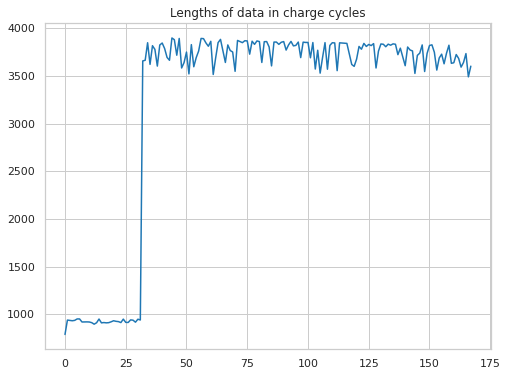

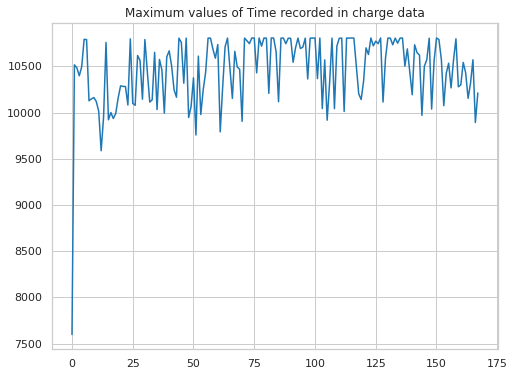

Observations having less count :  33


In [21]:
# lets look at time data for these observations
# This is similar to the analysis previously done,
time = []
for d in charge_data:
  time.append(d['data']['Time'])
# Lets check lengths and max values
plt.figure(figsize=(8,6))
plt.plot([len(i) for i in time])
plt.title('Lengths of data in charge cycles')
plt.show()

plt.figure(figsize=(8,6))
plt.plot([max(i) for i in time])
plt.title('Maximum values of Time recorded in charge data')
plt.show()

print('Observations having less count : ', len([i for i in time if len(i)< 3500]))

* Those 33 observations are sampled at lower rate than other observations, as a result, their lengths are lower than rest of the set which resulted in 3D plots with quicker change
*  This data should be upsampled with proper interpolation inorder to match overall observations

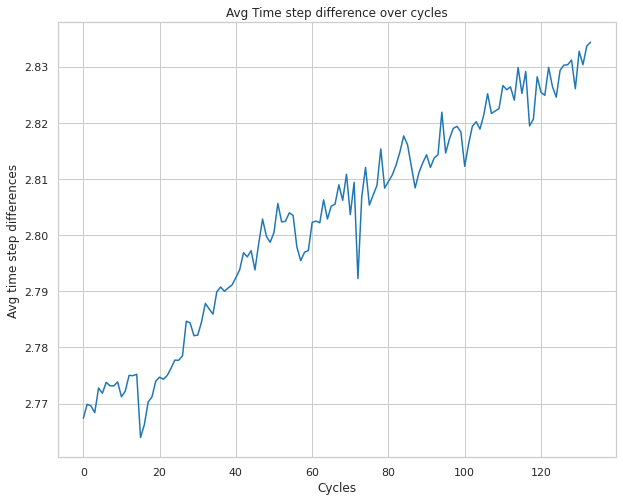

Average time step =  2.8


In [22]:
# Observe difference between each time step for every cycle
# using pandas .diff function and find average 
# step for observations > 33
time_steps = []
for i,t in enumerate(time):
  if i > 33:
    time_df = pd.Series(t)
    time_steps.append(time_df.diff(periods = 1).mean()) # mean of differences in timesteps for each observations 
plt.figure(figsize=(10,8))
plt.plot(time_steps)
plt.title('Avg Time step difference over cycles')
plt.xlabel('Cycles')
plt.ylabel('Avg time step differences')
plt.show()
print('Average time step = ', np.round(np.median(time_steps),1))  # median is considered as 
                                                                  # To avoid problems with high values

* The above plot is average difference in time step that each consecutive data points/observation in a cycle. y-axis is average time diff , x-axis is cycle data.
* In average, for every cycle data, there is a 2.8 second delay in recording consecutive observations, in otherwords, the observations are on average recorded for every 2.8 seconds. 
* Initial 33 observations have higher time gap which resulted in less no of observations per cycle. Below is an attempt to interpolate observations if the timegap between two consecutive observations is greater than 'step' argument

#### Interpolation

In [23]:
# interpolate_at_step
def step_interpolate(data, step=2.8):
  '''
  This function interpolates values based on step values in time
  Arguments: 
    data: charge/discharge data
    step: step size between consecutive time steps
  returns: 
    - interpolated data 
  '''

  arr = copy.deepcopy(data)
  print('Length before interpolation:', len(arr['Time']))
  i,j = 0,1
  while i<j and j < len(arr['Time']):
    try:
      diff = arr['Time'][j] - arr['Time'][i]
      if diff < step:
        i+=1
        j+=1
        continue
    except:
      import pdb
      pdb.set_trace()
    
    c = int(np.round(diff/step)) # c proportional to diff
    for idx in range(1,c+1): # NaN addition count
      for k in list(arr.keys()):  # For every col, add nan except if there is a capacity col
        if k != 'Capacity':
          arr[k] = np.insert(arr[k],idx+i, np.nan)
    i+=(c+1)
    j+=(c+1)
    # Break condition for while loop
    if j >= len(arr['Time']):
      break
  print('Length after interpolation: ',len(arr['Time']))
  for i in list(arr.keys()):
    if i != 'Capacity':
      arr[i] = pd.Series(arr[i]).interpolate(method='polynomial', order=2).values
    # arr[i] = pd.Series(arr[i]).interpolate(method='linear').values
  return arr


* Interpolation method: It primarily iterates through 'Time' data of each cycle. one by one, difference is calculated between current and previous time stamp, if difference is more than 'step' argument, then interpolation is done, else skipped to consecutive time step.
* Step argument is choosen based on length of data obtained after interpolation. This length is approximately compared to rest of the data length to estimate proper step value.

In [24]:
# Interpolation for Charge data
charge_interpolated = copy.deepcopy(charge_data)
for i,d in enumerate(charge_data):
  if len(d['data']['Time']) < 3500:
    print('\nModifying at id:', i)
    # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.interpolate.html
    charge_interpolated[i]['data'] = step_interpolate(d['data'], step=3.5) 
    # After working with different step sizes, 3.5 step sizes resulted in 
    # similar array sizes to other observations 



Modifying at id: 0
Length before interpolation: 789
Length after interpolation:  2863

Modifying at id: 1
Length before interpolation: 940
Length after interpolation:  3854

Modifying at id: 2
Length before interpolation: 937
Length after interpolation:  3829

Modifying at id: 3
Length before interpolation: 933
Length after interpolation:  3802

Modifying at id: 4
Length before interpolation: 937
Length after interpolation:  3831

Modifying at id: 5
Length before interpolation: 952
Length after interpolation:  3934

Modifying at id: 6
Length before interpolation: 952
Length after interpolation:  3940

Modifying at id: 7
Length before interpolation: 920
Length after interpolation:  3721

Modifying at id: 8
Length before interpolation: 921
Length after interpolation:  3723

Modifying at id: 9
Length before interpolation: 921
Length after interpolation:  3729

Modifying at id: 10
Length before interpolation: 920
Length after interpolation:  3708

Modifying at id: 11
Length before interpo

* 3D plots after interpolation

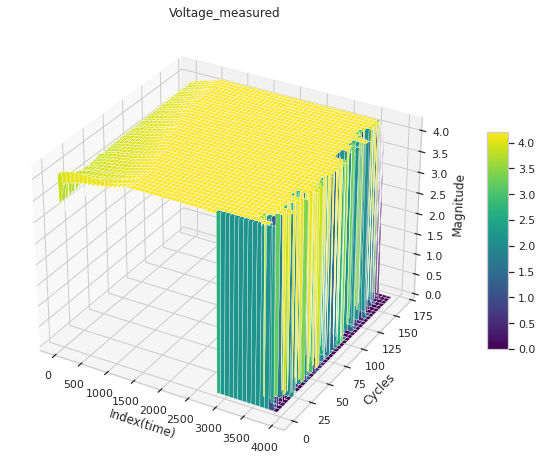

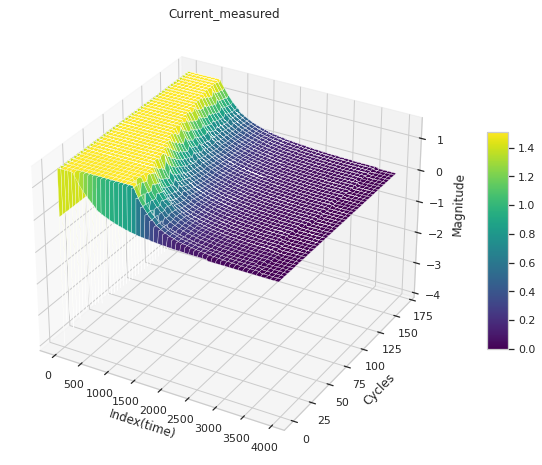

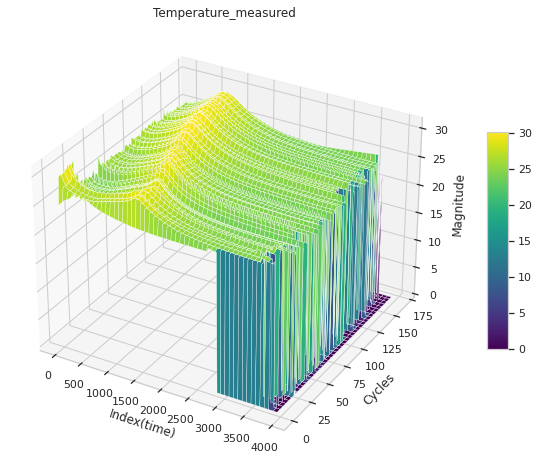

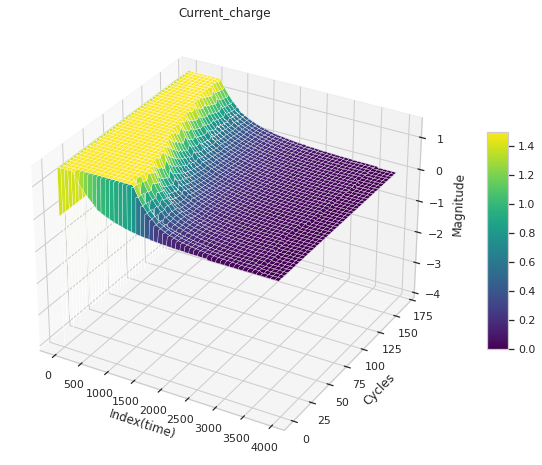

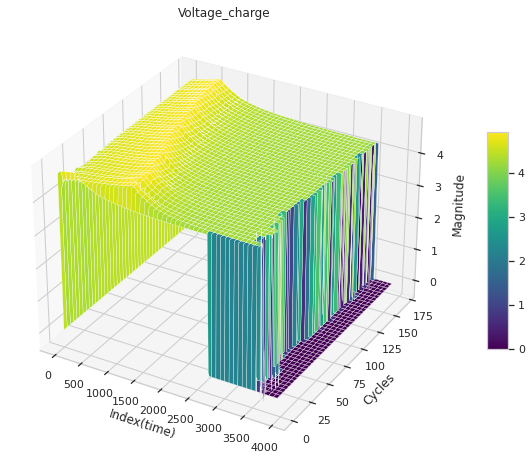

In [25]:
elev, azim =30, -60
for param in cprofiles:
  plot_3d(charge_interpolated, param)

* After adjusting observation sizes with interpolation, it can be observed that There are definitely trends associated as the number of cycles increases.
* Prominent observation is current measured, CC mode duration in fresh cell is higher than aged cell. similar trend is present in voltage measured
* in temperature measured, the rise in temperature as battery exits CC mode is higher in aged cell than fresh cell. cell reaches peak temperature faster in aged cell than fresh cell
* Similar conclusions can be drawn from Voltage and current charge observations
* The trends that are observed here can be further verfied when features are extracted and analysed with cell capacityfor charging cyles

### Discharge Cycles

* Observing profiles of each signal in discharge data via plots

In [26]:
# Segregating charge data
discharge_data = [point for point in B5 if point['type']=='discharge']
# Get keys of data
dprofiles = list(discharge_data[0]['data'].keys())
dprofiles.remove('Time') # Removing time data as it no info about cell is present
print('Parameters in discharge data: ',dprofiles)

Parameters in discharge data:  ['Voltage_measured', 'Current_measured', 'Temperature_measured', 'Current_load', 'Voltage_load', 'Capacity']


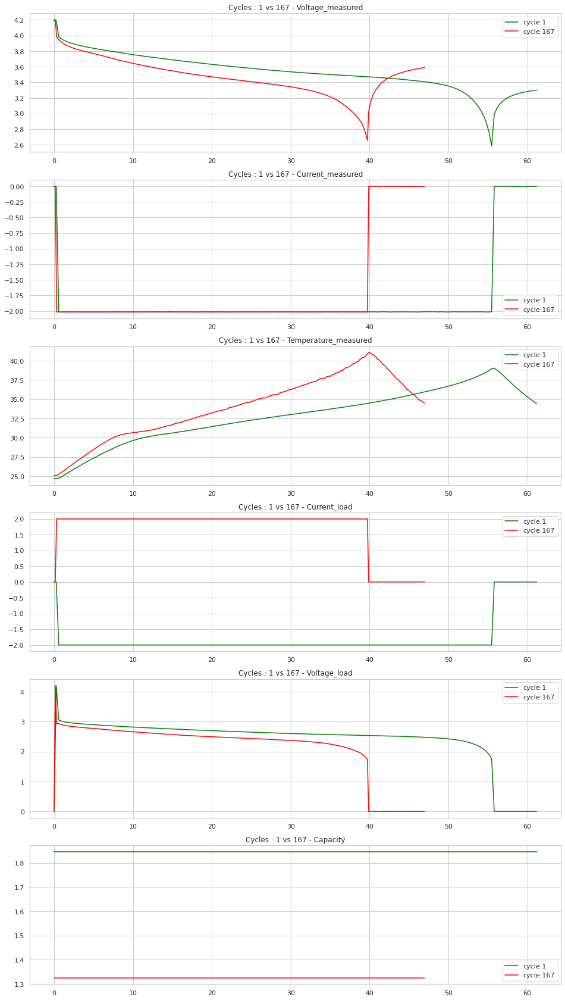

--------------------------------------------------


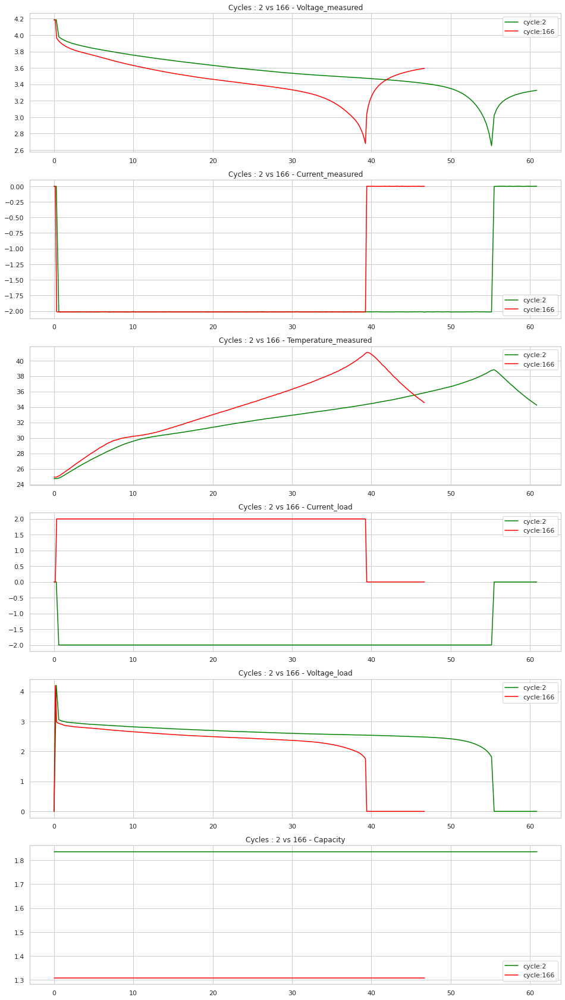

In [27]:
# Cycle 1 vs -1
get_cycle_plots(data=discharge_data,id0=1,idn=-1,profiles=dprofiles,overlap=True)
# Cycle 2 vs -2
print('-'*50)
get_cycle_plots(data=discharge_data,id0=2,idn=-2,profiles=dprofiles,overlap=True)

* From the above figures, it is evident that a fresh cell can deliver more power than an aged cell. in voltage profiles, aged cell voltage falls rapidly than a fresh cell
* It can also be observed that the peak temperature while discharging is significantly higher than a fresh cell. this was the case in multiple cycles, which could indicate age of cell properly
* Current plots are constant as the discharge is done at 1.5A constantly. After load is removed, with remaining charge, voltage is recovered slightly which resulted in the increase of voltage after load current diminished
* The recovered voltage seems to be slightly higher in aged cell than fresh cell
* 3D plots can be plotted to understand how parameters are varying with cycles. If there is a problem  if number of observations, above defined interpolation can be done

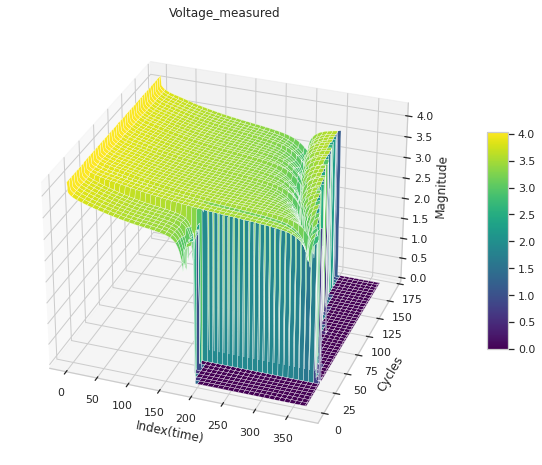

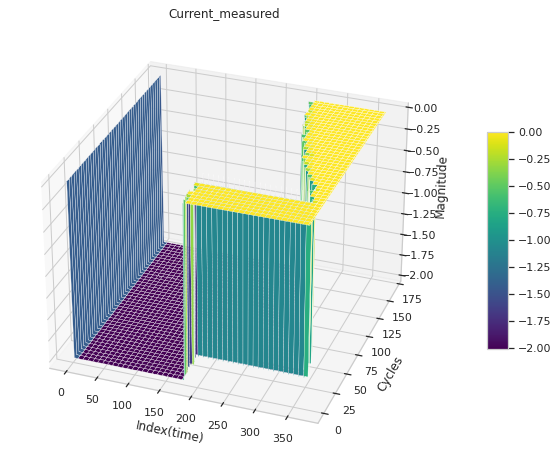

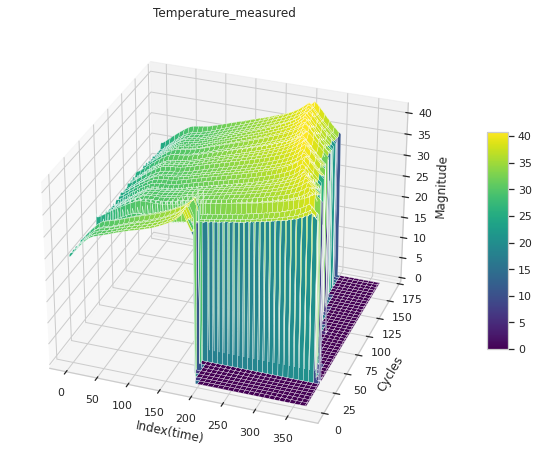

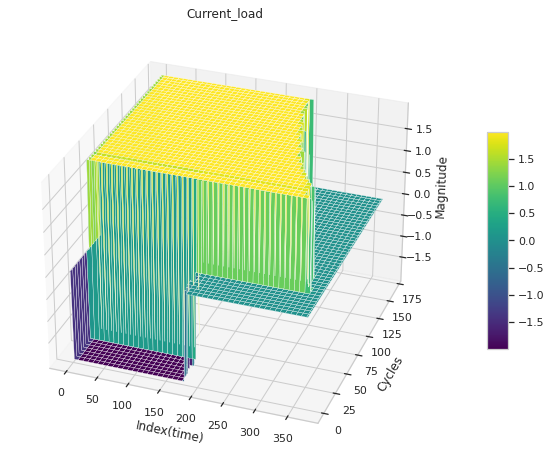

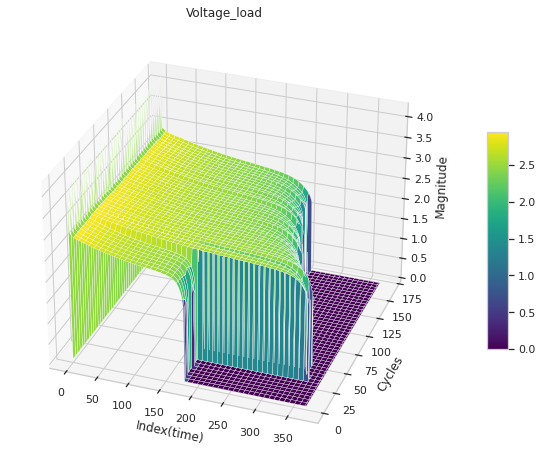

In [28]:
# dprofiles contains capacity as well, which does not need 3D plot
elev, azim =30, -70
for param in dprofiles[:-1]:
  plot_3d(discharge_data, param)

* Similar to Charging cycle data, the sampling rate of observations is different in discharge cycles as well. Interpolation is done to obtain plots properly

#### Resolving inconsistent sampling rate 

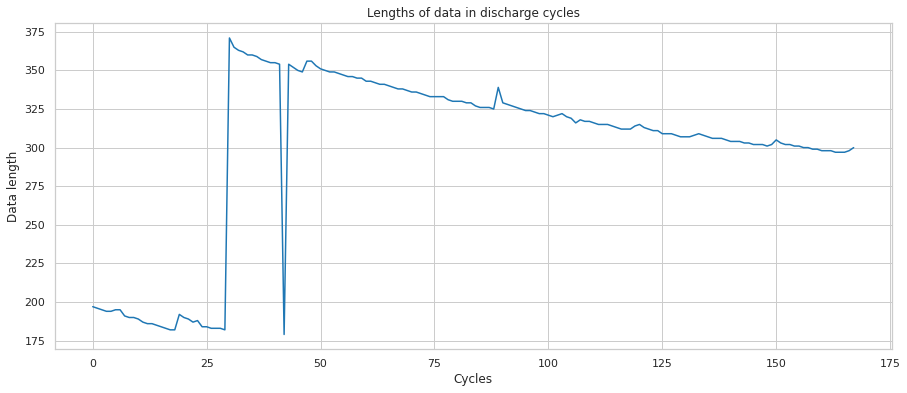

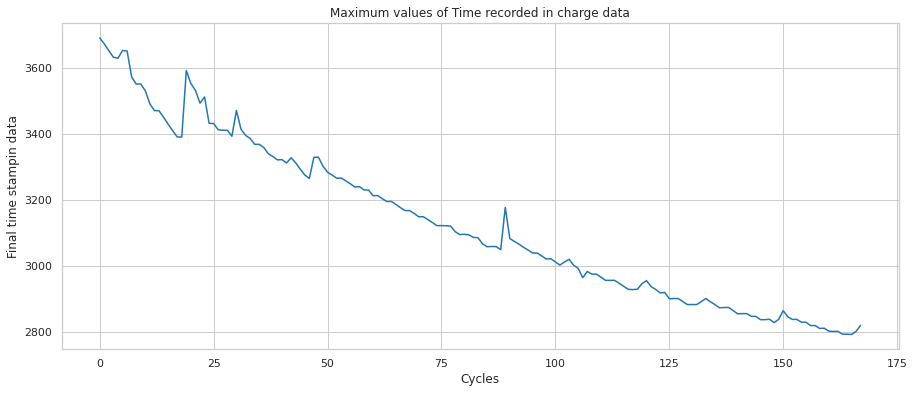

Observations having less count :  31


In [29]:
# lets look at time data for these observations
time = []
for d in discharge_data:
  time.append(d['data']['Time'])
# Lets check lengths and max values
plt.figure(figsize=(15,6))
plt.plot([len(i) for i in time])
plt.title('Lengths of data in discharge cycles')
plt.ylabel('Data length')
plt.xlabel('Cycles')
plt.show()

plt.figure(figsize=(15,6))
plt.plot([max(i) for i in time])
plt.title('Maximum values of Time recorded in charge data')
plt.ylabel('Final time stampin data')
plt.xlabel('Cycles')
plt.show()

print('Observations having less count : ', len([i for i in time if len(i)< 250]))

* Max values of time data is decreasing indicating faster discharge rate as cycles increase. This can be used as a feature itself. however there are some spikes which should be addressed 
* Initial values of lengths of time data have less number of observations similar to charging case

In [30]:
 # Observe difference between each time step for every cycle
# using pandas .diff function and find average 
# step for observations > 31
time_steps = []
for i,t in enumerate(time):
  if i > 31:
    time_df = pd.Series(t)
    time_steps.append(time_df.diff(periods = 1).mean()) # mean of differences in timesteps for each observations 
print('Average time step = ', np.round(np.median(time_steps),1))  # median is considered as 
                                                      # there is a sudden variation at single point at the end

Average time step =  9.4


#### Interpolation

In [31]:
discharge_interpolated = copy.deepcopy(discharge_data)
for i,d in enumerate(discharge_data):
  if len(d['data']['Time']) < 280:
    print('\nModifying at id:', i)
    discharge_interpolated[i]['data'] = step_interpolate(d['data'], step=14) 
    # After working with different step sizes, 14 step size resulted in 
    # similar array sizes to other observations 


Modifying at id: 0
Length before interpolation: 197
Length after interpolation:  393

Modifying at id: 1
Length before interpolation: 196
Length after interpolation:  391

Modifying at id: 2
Length before interpolation: 195
Length after interpolation:  389

Modifying at id: 3
Length before interpolation: 194
Length after interpolation:  387

Modifying at id: 4
Length before interpolation: 194
Length after interpolation:  387

Modifying at id: 5
Length before interpolation: 195
Length after interpolation:  389

Modifying at id: 6
Length before interpolation: 195
Length after interpolation:  389

Modifying at id: 7
Length before interpolation: 191
Length after interpolation:  381

Modifying at id: 8
Length before interpolation: 190
Length after interpolation:  379

Modifying at id: 9
Length before interpolation: 190
Length after interpolation:  379

Modifying at id: 10
Length before interpolation: 189
Length after interpolation:  377

Modifying at id: 11
Length before interpolation: 187

* 3D plot after interpolation

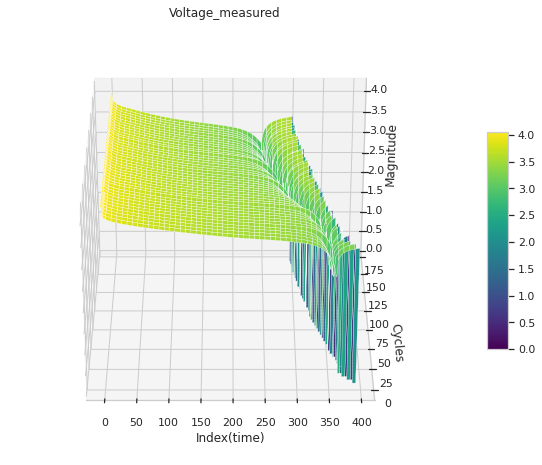

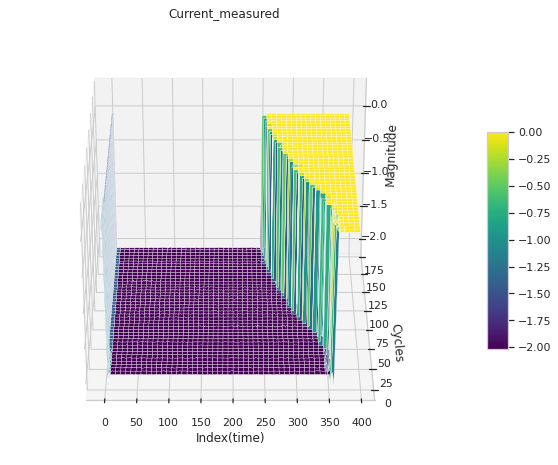

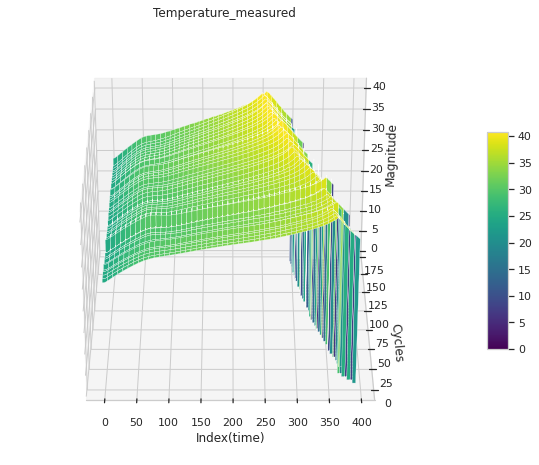

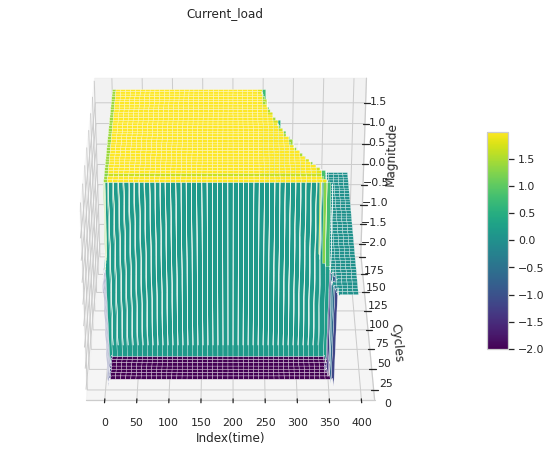

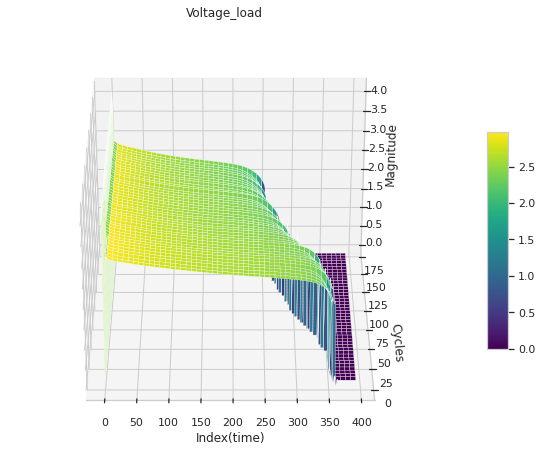

In [32]:
elev, azim = 30, -90 
for param in dprofiles[:-1]:
  plot_3d(discharge_interpolated, param)

* After interpolating values, similar to charge 3D plots, here are also there are noticable trends as number of cycles increases
* the prominant feature is Voltage, which is varying significantly as number of cycles increases. 
* Temperature is also increasing as cell ages in discharges, which is also correlated to  voltage variations.

### Impedance

* Impedance data is in complex domain. impedance have imaginary form R+jX where R represents resistance and X represents reactance of the measured circuit
* Real parts and imaginary parts are seperately plotted between cycles for the sake of observation.
* Rectified impedance, as described in ReadMe.txt, is calibrated and smoothed battery impedance. hence it is used directly instead of battery impedance


In [33]:
# Segregating charge data
imp_data = [point for point in B5 if point['type']=='impedance']
# Get keys of data
iprofiles = list(imp_data[0]['data'].keys())
print('Parameters in Impedance data:', iprofiles)

Parameters in Impedance data: ['Sense_current', 'Battery_current', 'Current_ratio', 'Battery_impedance', 'Rectified_Impedance', 'Re', 'Rct']


In [34]:
# Last two are not complex variables, hence excluding for this analysis
iprofiles = iprofiles[:-2]

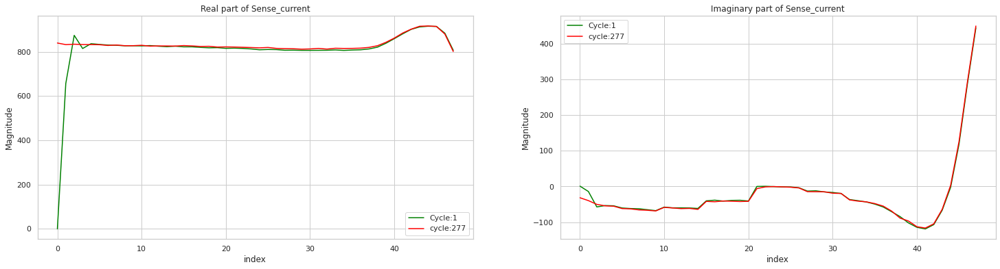

In [35]:
data = imp_data
overlap = True
xax = len(iprofiles)

id0 = 1
idn = -1
if idn < 0:
  idn = len(data)+idn
param = iprofiles[0]
real0 = data[id0]['data'][param].real
realn = data[idn]['data'][param].real
plt.subplots(1,2, figsize=(25,6))
plt.subplot(1, 2, 1)
sns.lineplot(data=real0, 
              label='Cycle:'+str(id0),
              color='g')
sns.lineplot(data=realn,
              label='cycle:'+str(idn),
              color='r')
plt.title('Real part of '+ iprofiles[0])
plt.xlabel('index')
plt.ylabel('Magnitude')

img0 = data[id0]['data'][param].imag
imgn = data[idn]['data'][param].imag
plt.subplot(1, 2, 2)
sns.lineplot(data=img0, 
              label='Cycle:'+str(id0),
              color='g')
sns.lineplot(data=imgn,
              label='cycle:'+str(idn),
              color='r')
plt.title('Imaginary part of '+iprofiles[0])
plt.xlabel('index')
plt.ylabel('Magnitude')


plt.show()

* The variation  between 1st and 277th cycle for Real and imaginary parts are very low, which makes it harder identify differences between cycles

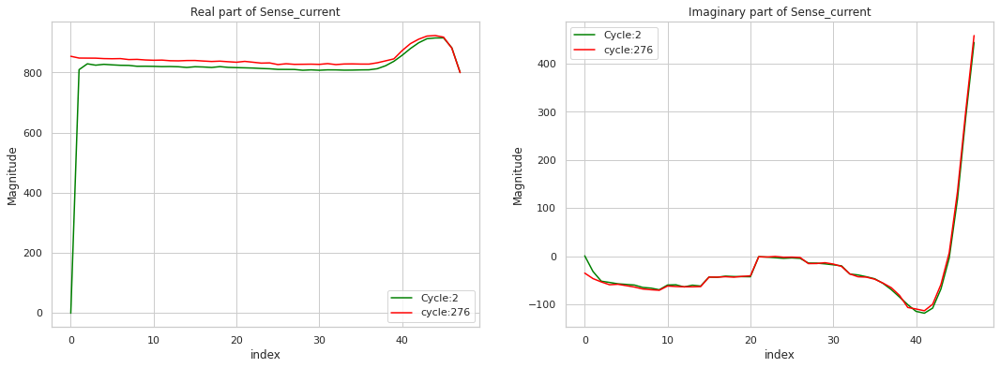

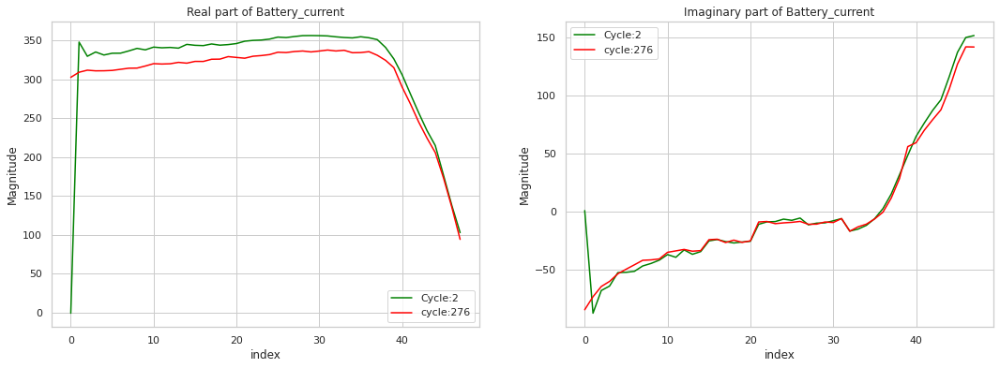

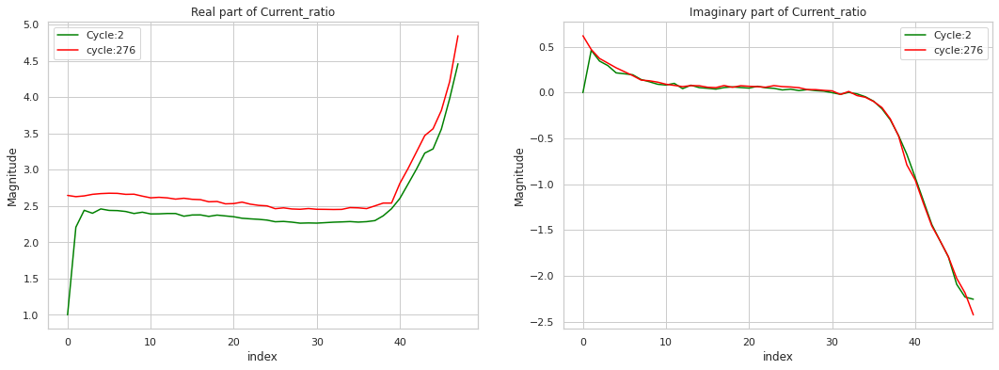

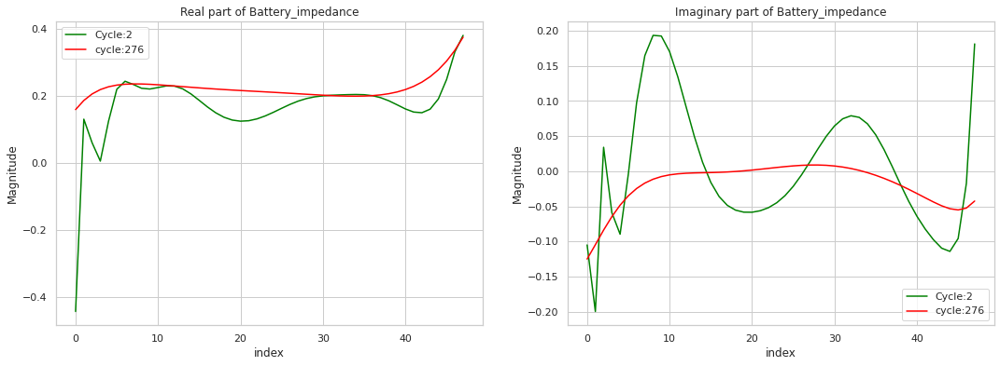

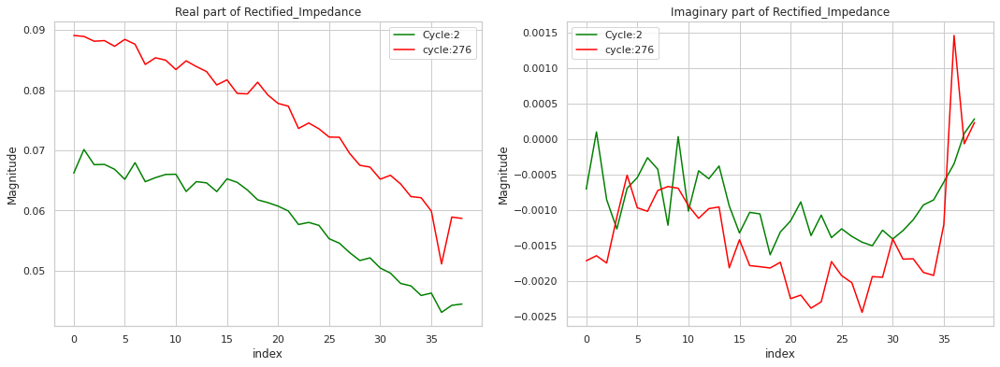

In [36]:
# Plots for cycles 2 and -2
id0 = 2
idn = -2
if idn < 0:
  idn = len(data)+idn

xax = len(iprofiles)
for param in iprofiles:
  real0 = data[id0]['data'][param].real
  realn = data[idn]['data'][param].real
  plt.subplots(1,2, figsize=(18,6))
  plt.subplot(1, 2, 1)
  sns.lineplot(data=real0, 
                label='Cycle:'+str(id0),
                color='g')
  sns.lineplot(data=realn,
                label='cycle:'+str(idn),
                color='r')
  plt.title('Real part of '+param)
  plt.xlabel('index')
  plt.ylabel('Magnitude')


  img0 = data[id0]['data'][param].imag
  imgn = data[idn]['data'][param].imag
  plt.subplot(1, 2, 2)
  sns.lineplot(data=img0, 
                label='Cycle:'+str(id0),
                color='g')
  sns.lineplot(data=imgn,
                label='cycle:'+str(idn),
                color='r')
  plt.title('Imaginary part of '+param)
  plt.xlabel('index')
  plt.ylabel('Magnitude')

  plt.show()
  print('='*60)

* Here. there is a slight difference in real parts of sense current when compared between 2nd and 276th cycle. however, this difference could be due to noise in measurement as well
* Major difference is in impedance(Rectified) mesurements. For initial cycles, the real part of impedance seems to lower and as the cell reaches its EOL, the impedance seems to increase. This trend could be useful in capturing relationship with cell capacity
* The Impedance values for initial observations are very different from the rest of the observations, although, rectified impedance (Both real and imag parts) is consistent for those observations
* Current observations are showing slight tendency to change over cycles but imaginary part is almost same
* A 3D plot of variation of real and imaginary portions can be utilised to understand if there is any variations in impedances in various cycles

In [37]:
# https://stackoverflow.com/a/23968448
def plot_3d_impd(data, param):
  '''
  This function creates 3D plot of real and imaginary parts in impedance data 
  given which profile
  Arguments: 
    data: impedance data
    param: One of the parameters of impedance data
  returns: Nothing
  '''
  real, imag = [], []
  for i in data:
    real.append(i['data'][param].real)
    imag.append(i['data'][param].imag)
  real = np.array(real)
  imag = np.array(imag)

  x = np.arange(0,real.shape[1])
  y = np.arange(0,real.shape[0])
  X,Y = np.meshgrid(x,y)
  # Plot Real parts
  Z = real
  fig,_ = plt.subplots(1,2,figsize=(20,8))
  ax = fig.add_subplot(121, projection='3d')
  surf = ax.plot_surface(X, Y, Z, rstride=2, cstride=100,cmap = 'viridis', lw=.2)
  ax.set_title(param+' Real part');
  ax.set_xlabel("Index")
  ax.set_ylabel("Cycles")
  ax.set_zlabel("Magnitude")
  ax.view_init(10,-40)  # Change view_init angles to view different sides
  fig.colorbar(surf, shrink=0.5, aspect=10)
  # Plot imag parts
  Z = imag
  ax = fig.add_subplot(122, projection='3d')
  surf = ax.plot_surface(X, Y, Z, rstride=2, cstride=100,cmap = 'viridis', lw=.2)
  ax.set_title(param+' Imaginary part');
  ax.set_xlabel("Index")
  ax.set_ylabel("Cycles")
  ax.set_zlabel("Magnitude")
  ax.view_init(10,-40)  # Change view_init angles to view different sides
  fig.colorbar(surf, shrink=0.5, aspect=10)
  plt.show()

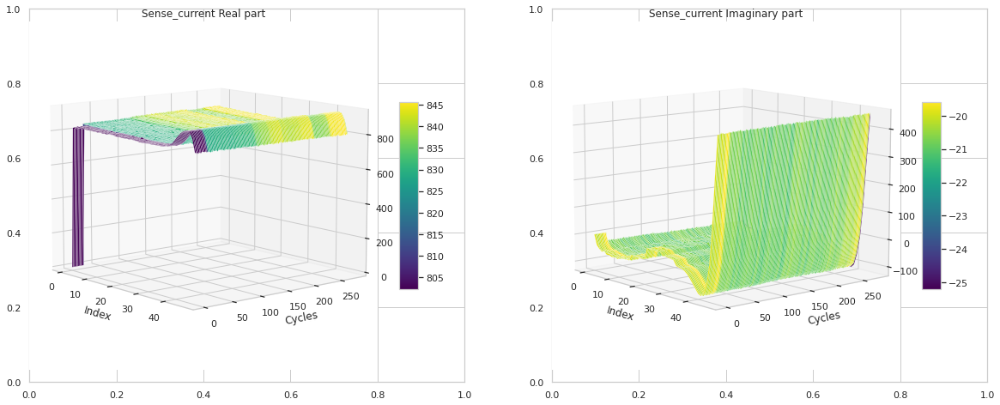

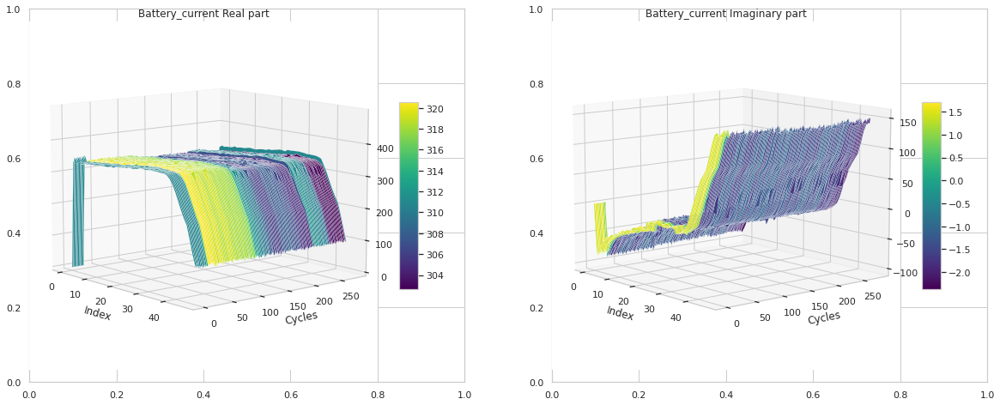

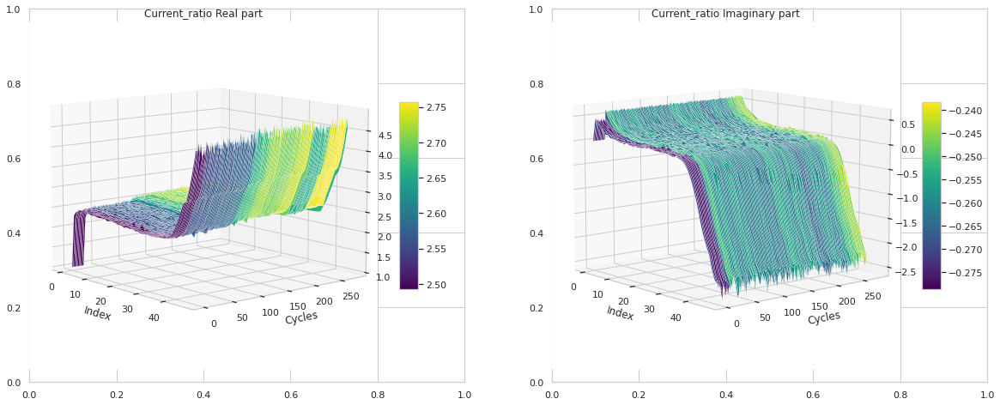

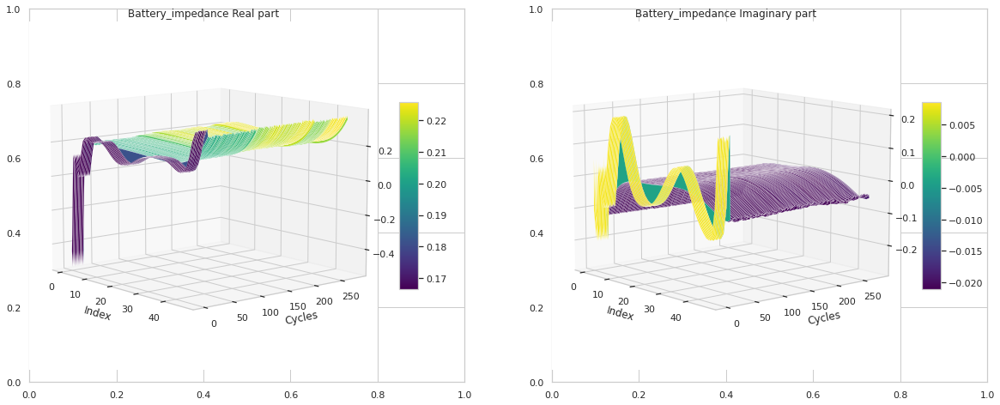

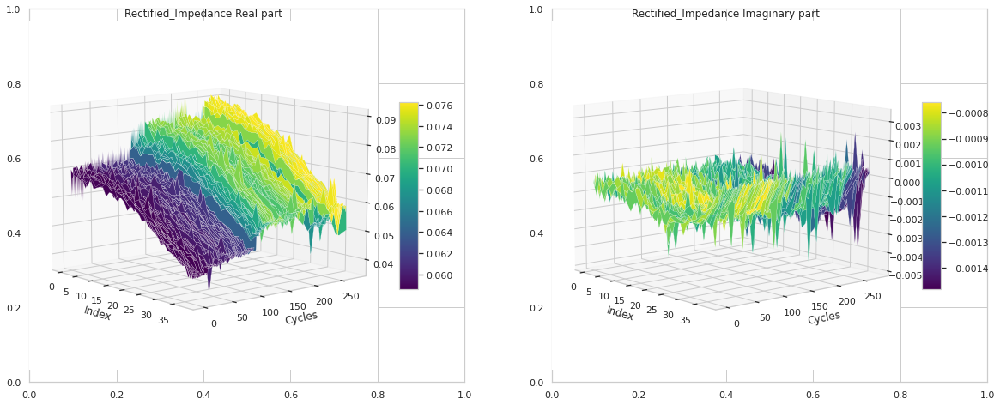

In [38]:
for param in iprofiles:
  plot_3d_impd(imp_data, param)

* The above plots are for all complex parameters of impedance. 
* In sense_current, real part is showing slight tendency to increase as cycles increase. it is not consistent but there is a shift in increased real value. in imaginary part, there is no such pattern present
* Similar to sense_current, real part of battery current is also decreasing as the cycle increases. there is no consistent pattern in imaginary part 
* Current ratio is the ratio of sense current to battery current. in current_ratio, in both real and imaginary parts, there is a tendency to change values as cycles increases. Real part is showing more signifcant change than imaginary part
* As pointed above, rectified impedance is used directly instead of battery impedance. in battery impedance, there are same, consistent values present in first 21 cycles, which are possibly an error in measurement
* In rectified impedance, the real portion is also showing a significant increase in magnitude as cycles increases, however, it needs smoothening as there are almost random sharp ridges and groves.
* In imaginary part of rectified impedance, there is also a decrease in value as the cycles increase. however it is even more noisy at the end of cycles, making is difficult to utilise in feature extraction

<hr>

# Charge-Discharge cycle sequence analysis

* There are 3 types of observations in data, Charge cycle, Discharge cycle and Impedance logs. 
* These three types of cycles are not consistent in the data, some are irregularly present and some are not present in certain duration. 
* Below is an analysis on how various sequences are present and how they can be resolved to a common sequence

In [39]:
# For example
types = [i['type'] for i in B5]
print('Observe the sequences below')
print('Initial 10 cycles : ',types[0:10], )
print('100 to 110 cycles : ',types[100:110])

Observe the sequences below
Initial 10 cycles :  ['charge', 'discharge', 'charge', 'discharge', 'charge', 'discharge', 'charge', 'discharge', 'charge', 'discharge']
100 to 110 cycles :  ['discharge', 'impedance', 'charge', 'impedance', 'discharge', 'impedance', 'charge', 'impedance', 'discharge', 'impedance']


* The Impedance observations are not present in the first 10 observations where as impedance is recorded after every charge as well as discharge cycle

In [40]:
# Two sequences are present in the data
# Obtaining how different type of sequences are present in data
seq_count_2 = 0 # For sequence : Charge - Discharger
seq_count_4 = 0 # For sequence : Charge - Impedance - Discharge - Impedance
for i,_ in enumerate(types):
  if i > 1:
    if types[i-1] == 'charge' and types[i] == 'discharge':
      seq_count_2+=1
  if i > 3:
    if types[i] == 'impedance' and types[i-1] == 'discharge' and types[i-2] == 'impedance' and types[i-3] == 'charge':
      seq_count_4+=1
print('Sequences with charge-discharge:', seq_count_2)
print('Sequences with charge-impedance-discharge-impedance: ', seq_count_4)
print('Length of data : ', len(types))

Sequences with charge-discharge: 30
Sequences with charge-impedance-discharge-impedance:  129
Length of data :  614


* There are 30 sequences with no data about impedance in those observations 
* In remaining 129 sequences, there are impedance observations after charge and discharge cycles. 
* Including Impedance data along with charge and discharge across cycles is difficult as Impedance data is very irregularly logged 
* Here, we can see that 30 * 2 + 129 * 4 equals 576 which is not equal to the length of 'types' list which is 616
* This indicates that there are some observations where the sequences are not in the order of C-I-D-I

In [41]:
# Sequences of charge and discharge excluding impedance
# Finding if there are any indices where there is a sequence mismatch
c_d = [t for t in types if t == 'charge' or t == 'discharge']
print('Length of Charge and Discharge list : ', len(c_d))
seq_count = 0
for i,_ in enumerate(c_d):
  if i > 1:
    if c_d[i-1] == 'charge' and c_d[i] == 'discharge':
      seq_count+=1
    elif (c_d[i-1] != 'discharge' or c_d[i] != 'charge') and (c_d[i-1] != 'charge' or c_d[i] != 'discharge'):
      # Consecutive sequences should be charge and discharge. 
      # if not, id is printed
      print('Anomaly at idx : ', i)

print('Final Sequence count : ',seq_count)

Length of Charge and Discharge list :  336
Anomaly at idx :  23
Anomaly at idx :  179
Final Sequence count :  166


* There are 2 idxs where there are problems in sequences of charge and discharge

In [42]:
print('At id 23 : ', c_d[22], c_d[23], c_d[24])
print('At id 179 : ', c_d[178], c_d[179], c_d[180])

At id 23 :  charge charge discharge
At id 179 :  discharge discharge charge


* As the above output, there are additional charge and discharge info without consecutive counterpart cycles. 
* For Charge, first instance of charge can be dropped and for discharge cycle, second instance of discharge can be dropped

In [43]:
# Applying these changes to original dataset with index tracking
# Obtain ids of charge and discharge

Ids = []
for i, d in  enumerate(B5):
  if B5[i]['type'] == 'charge' or B5[i]['type'] == 'discharge':
    Ids.append(i)
print('Length of indices = ', len(Ids))

# Removing unpaired charge and discharge cycles

del_ids = []
for i in range(len(Ids)):
  if i > 0:
    if B5[Ids[i-1]]['type'] == B5[Ids[i]]['type']:
      if B5[Ids[i-1]]['type'] == 'charge':
        del_ids.append(i)
      if B5[Ids[i-1]]['type'] == 'discharge':
        del_ids.append(i-1) 

for i in del_ids:
  del Ids[i]

print('Length after dropping unpaired cycles', len(Ids))

B5_cd = B5[Ids] # cd -> Charge discharge


Length of indices =  336
Length after dropping unpaired cycles 334


* After this process, a data point of charge and consecutive discharge is considered as a single data point.
* Contents of discharge contains capacity but contents of charge does not contain capacity which will make it difficult to analyse the charge data with dependent variable 
* So data restructure is needed for better analysis. The capacity of battery in discharge data can be added to corresponding charge data or charge - discharge pairs should be combined to form a single data point
* The former is choosen to retain the structure of original data 

In [44]:
# Adding capacity to charge cycles 
for i,d in enumerate(B5_cd):
  if i > 0 and d['type'] == 'discharge':
    B5_cd[i-1]['data']['Capacity'] = B5_cd[i]['data']['Capacity']

# Feature Analysis



## Charging Cycle

In [45]:
# Segregating charge data
charge_data = [point for point in B5_cd if point['type']=='charge']
# del charge_data[32] # Removing 32nd due to log error
# del charge_data[168] # Removing 169th due to log error
# Get keys of data
cprofiles = list(charge_data[0]['data'].keys())
cprofiles.remove('Time')
cprofiles.remove('Capacity')
print(cprofiles)

['Voltage_measured', 'Current_measured', 'Temperature_measured', 'Current_charge', 'Voltage_charge']


### Features observed
* Duration in Constant current mode
* Duration in Constant Voltage mode
* Decay of current 
* Decay of temperature
* Peak temperature over mean
* Average difference of Current curve with previous timestamp curve

#### CC mode duration

* Duration of cycle which stayed in constant current mode while charging
* Since Charging was carried out in a constant current (CC) mode at 1.5A, time column for indices corresponding to 1.5A are obtained and converted to minutes

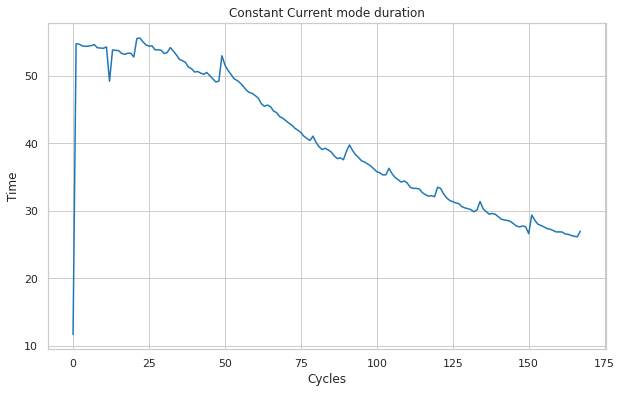

In [46]:
def get_CCmode_dur(data):
  '''
  This function takes in data and returns 
  CC mode duration  data 
  '''
  CC_dur = []
  for idx in data:
    curr = idx['data']['Current_measured'] >= 1.5 # curr -> 1s and 0s
    CC_dur.append(idx['data']['Time'][sum(curr)]/60) # sum(curr) gives id at which curr is < 1.5A 
    # return
  return CC_dur

ccd = get_CCmode_dur(charge_interpolated)
plt.figure(figsize=(10,6))
plt.title('Constant Current mode duration')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.plot(ccd)
for i in range(1,len(ccd)):
  if ccd[i] < 20:
    print(i, ccd[i])

* This is a plot of time and cycles. The time is the duration of cycle in which charge is done in constant current duration
* There is a steady decrease in CC mode duration as observed previously
* The duration of CC mode can be a used as a feature to the model

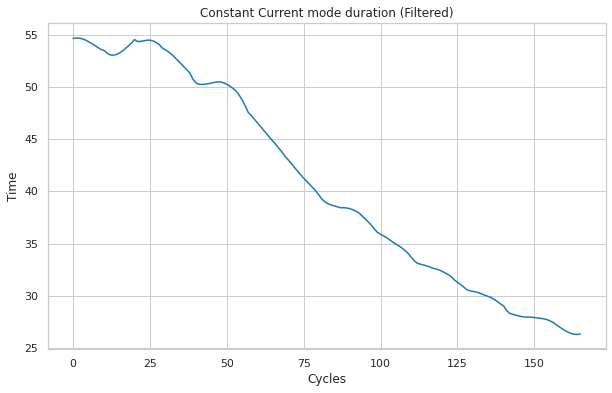

In [47]:
# Filter and reduce perturbations
# Savgol_Filter is used to filter out noise
# https://blog.finxter.com/smoothing-your-data-with-the-savitzky-golay-filter-and-python/
ccd_flt = savgol_filter(ccd[1:-1], 19, 3)
plt.figure(figsize=(10,6))
plt.title('Constant Current mode duration (Filtered)')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.plot((ccd_flt))
plt.show()

* The above plot is a smoothed version of previous plot using savitsky-golay filter
* Perturbations decreased without effecting original behaviour of curve for a 
window size of 15-19
* This reduction in CC mode duration clearly in correlation with capacity reduction over cycles

#### CV mode duration

* Duration of cycle which stayed in constant voltage mode while charging
* Since Charging was carried out in a constant voltage (CV) mode at from 4.2V, time column for indices corresponding to 4.2v are obtained and converted to minutes

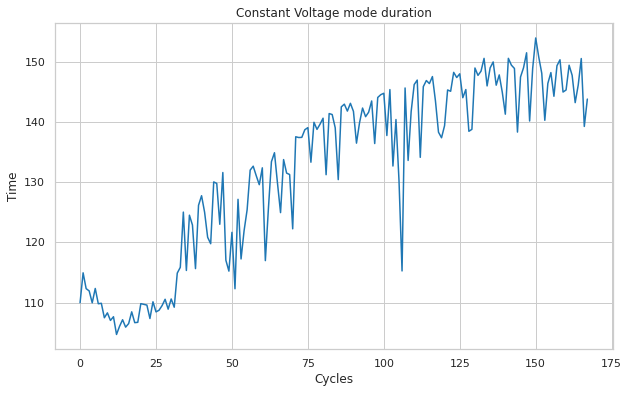

In [48]:
def get_CVmode_dur(data):
  '''
  This function takes in data and returns 
  CV mode duration  data 
  '''
  CV_dur = []
  for idx in data:
    volt = idx['data']['Voltage_measured'] < 4.2
    CV_dur.append((max(idx['data']['Time']) - idx['data']['Time'][sum(volt)])/60)
    # return
  return CV_dur

cvd = get_CVmode_dur(charge_interpolated)
plt.figure(figsize=(10,6))
plt.title('Constant Voltage mode duration')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.plot((cvd))
plt.show()
for i in range(1,len(cvd)):
  if cvd[i] < 40:
    print(i, cvd[i])

* This is a plot of time and cycles. The time is the duration of cycle in which charge is done in constant voltage mode
*  There are a lot of irregularity in the data for CV mode duration
*  This cannot used as a feature as for same duration of CV mode, there are possibly multiple values for same time duration

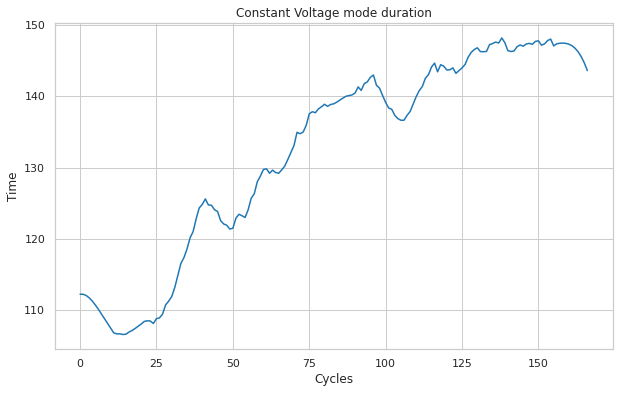

In [49]:
from scipy.signal import savgol_filter
cvd_flt = savgol_filter(cvd[:-1], 21, 3)
plt.figure(figsize=(10,6))
plt.title('Constant Voltage mode duration')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.plot((cvd_flt))
plt.show()

*   Even with the SG-filter, the curve is non monotonic and not suitable for using as a feature, as for a single duration, there are more than 2 cycles with same duration, which makes it hard to use as a feature 

#### Decay of current


* In charging mode, once mode shifts to CV mode, current steadily decays and eventually enters trickle mode
* During this process, the current decay can be observed if it has any relation with capacity by fitting a polynomial curve and studying coefficients

In [50]:
# Extracting parameters of decay of current by fitting a polynomial curve

from scipy.optimize import curve_fit, lsq_linear

# https://numpy.org/doc/stable/reference/generated/numpy.polyfit.html
def polynomial(x, deg, p):
  '''
  Returns : a * X**deg + b * X**(deg-1) + .....
  '''
  return sum([x**i * p[len(p)-i-1] for i in range(len(p))])


def get_Cur_decay_params(data):
  '''
  This function obtains polynomial coefficients for current decay
  '''

  decay_params = []
  for i,d in enumerate(data):
    curr = d['data']['Current_measured'][d['data']['Current_measured'] <= 1.5] # <1.5amps
    curr = curr[curr>=0.02] # Since charging is stopped at 20mA
    X = list(range(len(curr)))
    Y = curr
    params = np.polyfit(X, Y, deg=4) # Out of all, 4th degree polynomials are well fitted
    decay_params.append(params)

  return np.array(decay_params)

decay_params = get_Cur_decay_params(charge_interpolated)
print('First 3 decay rates : ')
decay_params[:5] 

First 3 decay rates : 


array([[ 1.71842318e-13, -1.10317217e-09,  2.67315620e-06,
        -3.03236913e-03,  1.48083274e+00],
       [ 2.57521237e-13, -1.55941552e-09,  3.47047596e-06,
        -3.49142020e-03,  1.47966364e+00],
       [ 2.79992769e-13, -1.64936695e-09,  3.58164422e-06,
        -3.53242706e-03,  1.47561171e+00],
       [ 2.79164993e-13, -1.64372951e-09,  3.56763679e-06,
        -3.51792965e-03,  1.47002936e+00],
       [ 2.87268743e-13, -1.67249887e-09,  3.60433710e-06,
        -3.54666819e-03,  1.48324465e+00]])

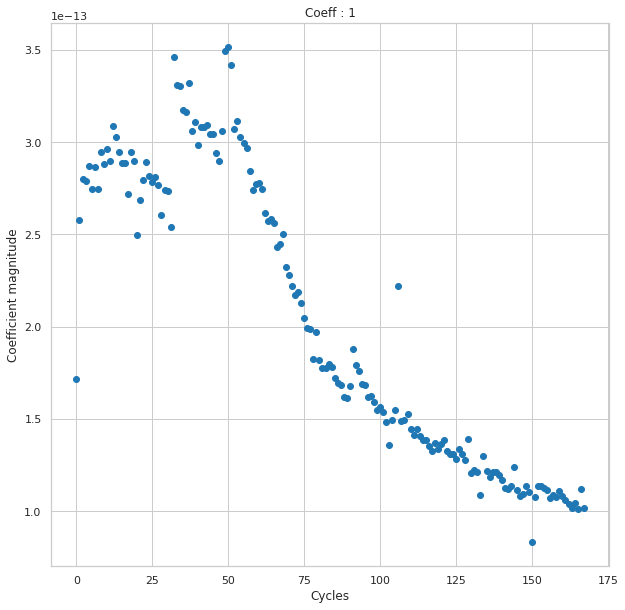

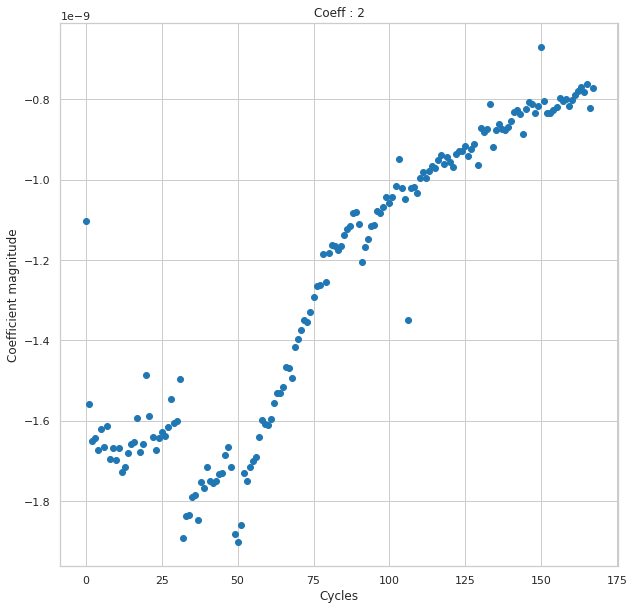

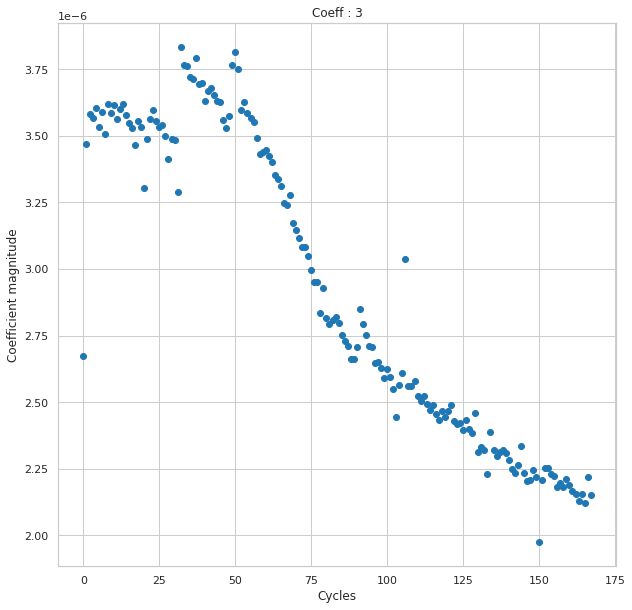

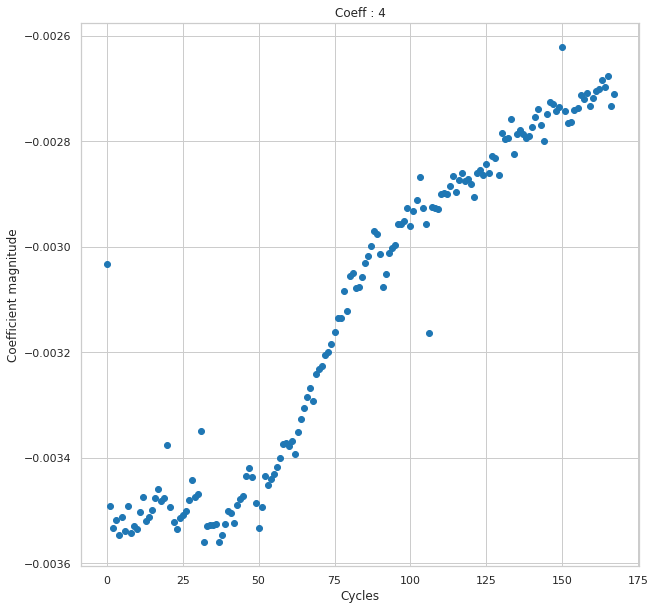

In [51]:
for coeff in range(4):
  
  plt.figure(figsize=(10,10))
  plt.scatter(np.arange(len(decay_params)),decay_params[:,coeff])
  plt.title('Coeff : '+ str(coeff+1))
  plt.xlabel('Cycles')
  plt.ylabel('Coefficient magnitude')
  plt.show()

* The above plot is coefficients of curve fitted to the decaying current which can be interpreted as a curve. The curve can be modelled by fitting a curve whose coefficients represent the curve. The order of curve is obtained by manually plotting and choose best order in which curve is not fitting overly to the cycle data 
*   These are the variation of coefficients of fitted curves on charge cycle over increasing order of cycles.
*   These coefficients capture decay rate duration shifts that happens when as the cell/battery looses capacity.
*   The lower coeffient in the above plots represents coefficient of lower power. there are clearly observable trends in all coefficients.
*   The initial parts of the coefficients are scattered significantly. this could be due to the interpolation of initial coefficients.
*   Applying SG filter over the curve and then extracting coefficients could reduce the effects.
*   Another method is instead of interpolating to increase length, original samples can be downsampled proportional to their original lengths to reduce the irregularity effect on coefficients

#### Decay of temperature

* In charging mode, once mode shifts to CV mode, in this period, temperature along with current also starts to decrease.
* Similar to above analysis of current decay, polynomial curve  is fitted and and coefficients are studied
* From analysis above, in charge cycles, in temperature, for observations in the beginning, there is a high initial temperature present, which are greater than peak temp reached at the end of CC mode.
* Hence considering all observations after 500 observations to avoid considering initial temperature

In [52]:
t = (charge_data[50]['data']['Temperature_measured'][500:])

In [53]:
def get_temp_decay_params(data):
  '''
  This function obtains polynomial coefficients for current decay
  '''

  decay_params = []
  for i,d in enumerate(data):
    temps = d['data']['Temperature_measured'][500:]
    temps = temps[np.argmax(temps):]
    X = list(range(len(temps)))
    Y = temps
    params = np.polyfit(X, Y, deg=3) # Out of all, 3th degree polynomials are well fitted
    decay_params.append(params)

  return np.array(decay_params)

decay_params_temp = get_temp_decay_params(charge_interpolated)
print('First 3 decay rates : ')
decay_params_temp[:5] 

First 3 decay rates : 


array([[-2.61230401e-10,  1.85991332e-06, -3.91126963e-03,
         2.67742322e+01],
       [-5.92740671e-10,  3.61201662e-06, -7.13452728e-03,
         2.92668760e+01],
       [-5.58434813e-10,  3.52378957e-06, -7.11904659e-03,
         2.94265929e+01],
       [-5.63908858e-10,  3.52208501e-06, -7.08371792e-03,
         2.93012207e+01],
       [-5.76384037e-10,  3.58987801e-06, -7.19880312e-03,
         2.92850228e+01]])

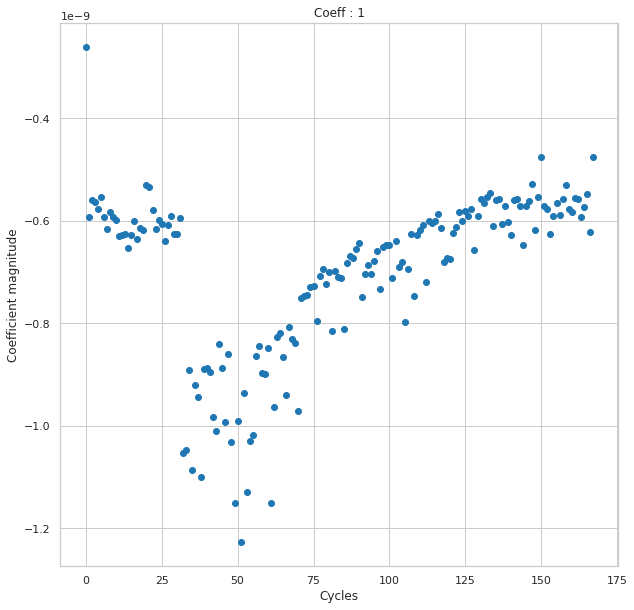

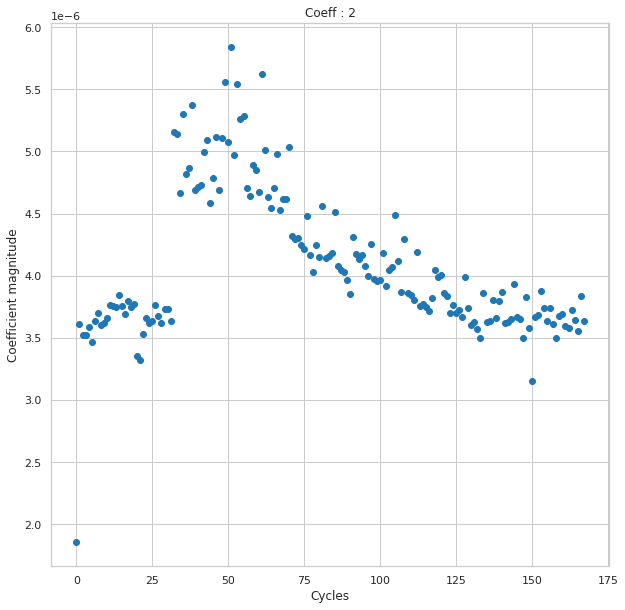

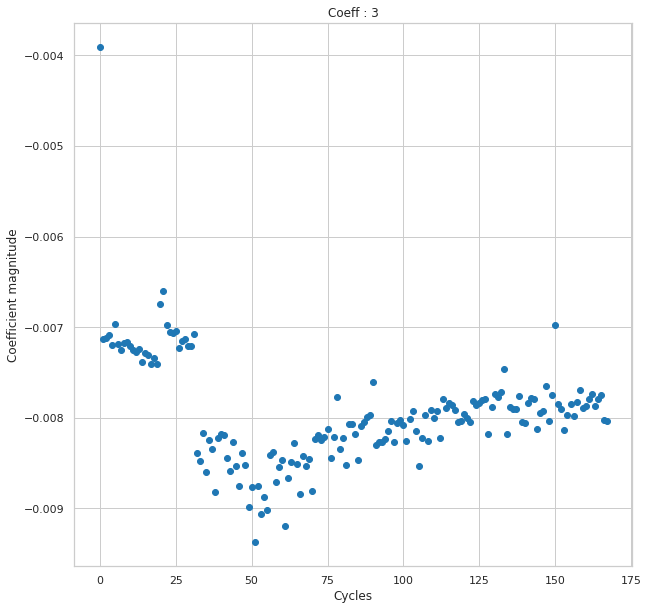

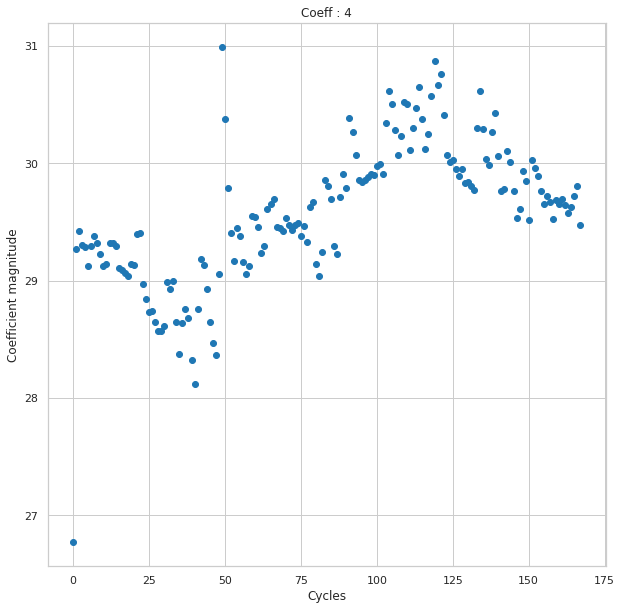

In [54]:
for coeff in range(decay_params_temp.shape[1]):
  
  plt.figure(figsize=(10,10))
  plt.scatter(np.arange(len(decay_params_temp)),decay_params_temp[:,coeff])
  plt.title('Coeff : '+ str(coeff+1))
  plt.xlabel('Cycles')
  plt.ylabel('Coefficient magnitude')
  plt.show()

*   Coefficients of temperature are plotted here above with 4 degree polynomial
*   For initial coefficients, there are some trends present are too distributed when compared to CC mode coefficients. 
*   The final coefficient is not clearly proportional to anything and also abruptly changed as well. 
*   This property cannot be used as a feature due to the above issues

#### Peak temperature over mean

* Differnence between mean temperature and peak temperature is calculated

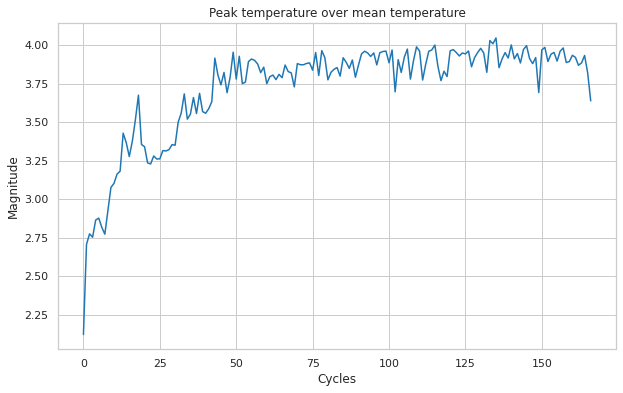

In [55]:
peak_temp_mean = [max(d['data']['Temperature_measured']) - np.mean(d['data']['Temperature_measured']) for d in charge_data]
plt.figure(figsize=(10,6))
plt.plot(peak_temp_mean)
plt.title('Peak temperature over mean temperature')
plt.xlabel('Cycles')
plt.ylabel('Magnitude')
plt.show()


*   This plot is a difference of max temperature and mean temperature in charge cycles.
*   The idea to use mean is because there are some temperature readings with higher initial temperature at the beginning of the charge cycles. taking mean of the entire temperature considers this as well. 
*   The difference is increasing with a significant trend to it, but it is irregular in nature as well. 
*   This curve can be processed through SG-filter to obtain smoothed values which can be used a feature.

#### Average difference of Current curve with previous timestamp curve

* difference between two consecutive current curves are calculated and averaged

In [56]:
def past_vs_pres_curr(data):
  '''
  This function obtains differences in current curves
  '''
  adjusted = []
  perc = np.arange(1,100,0.2)
  for i,d in enumerate(data):
    if i == 0:
      adjusted.append(np.percentile(d['data']['Current_measured'], perc))
      continue
    diff = np.abs(np.percentile(d['data']['Current_measured'], perc) - adjusted[-1])
    adjusted.append(diff)
  adjusted[0] = adjusted[1] + np.random.rand(len(perc))
  return np.array(adjusted)

temp = past_vs_pres_curr(charge_interpolated)


In [57]:
for i,_ in enumerate(charge_interpolated):
  charge_interpolated[i]['data']['Current_difference'] = np.mean(temp[i])

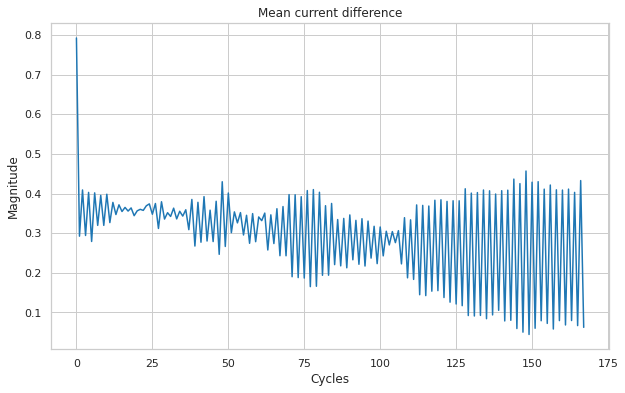

In [58]:
curr_mean = [d['data']['Current_difference'] for d in charge_interpolated]
plt.figure(figsize=(10,6))
plt.plot(curr_mean)
plt.title('Mean current difference')
plt.xlabel('Cycles')
plt.ylabel('Magnitude')
plt.show()

* The mean differences between consecutive current cycles are inconsistent , the change variation is decreasing over time slowly if repetitions are ignored
* The values are oscillating extremely and increasing as the cycle increases, so this cannot be considered in features

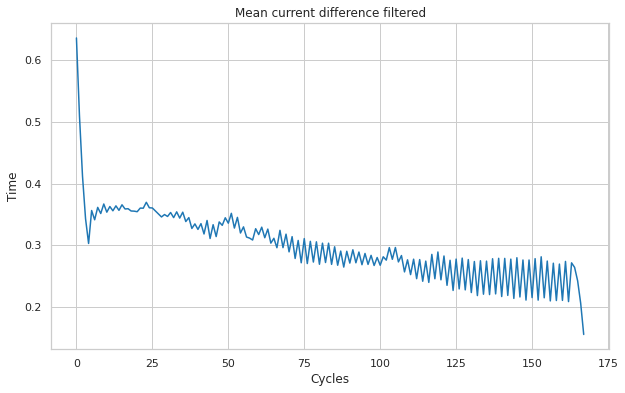

In [59]:
plt.figure(figsize=(10,6))
plt.plot(savgol_filter(np.mean(temp, axis = 1), 9, 2))
plt.title('Mean current difference filtered')
plt.xlabel('Cycles')
plt.ylabel('Time')
plt.show()

* The above curve, even after using filter, it is fluctuating rapidly. increasing window size is causing the values to change significantly and the curve loosing the structure
* This cannot be used as a feature for modeling 

## Discharging Cycle

In [60]:
# Segregating charge data
discharge_data = [point for point in B5 if point['type']=='discharge']
# Get keys of data
dprofiles = list(discharge_data[0]['data'].keys())
dprofiles.remove('Time')
print('Parameters in Discharge data: ', dprofiles)

Parameters in Discharge data:  ['Voltage_measured', 'Current_measured', 'Temperature_measured', 'Current_load', 'Voltage_load', 'Capacity']


### Features observed
* CC mode duration
* Recovery voltage magnitude and decay rate of voltage
* growth parameters of temperature in CC mode
* slopes of temperature reduction after CC mode

#### CC mode duration

* Duration of cycle which stayed in constant current mode while discharging

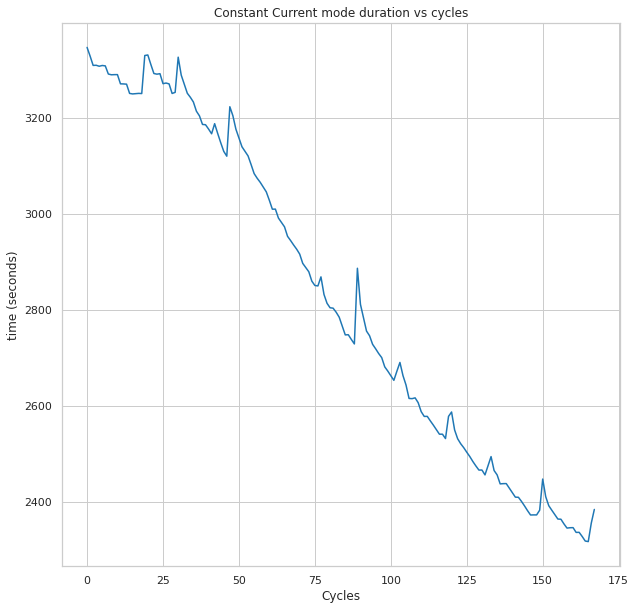

In [61]:
## Can be obtained from current logs

dis_cc_len = []
for i,d in enumerate(discharge_data):
  curr = abs(discharge_data[i]['data']['Current_measured'])
  duration = d['data']['Time'][curr>1.9]
  dis_cc_len.append(max(duration))

plt.figure(figsize=(10,10))
plt.plot(dis_cc_len)
plt.title('Constant Current mode duration vs cycles')
plt.xlabel('Cycles')
plt.ylabel('time (seconds)')
plt.show()

* The above plot is Change of CC mode duration in dicharge mode over multiple cycles
* There is a clear decreasing trend of CC mode duration, but there are some sudden increase of values which are cannot be considered as noise.
* SG-filter can be applied to smoothen and reduce spikes in observed measurents

####  Recovery voltage magnitude

* Recovery voltage is voltage the cell regains after it is discharged
* Below is how much the battery recovered voltage as cycles increases

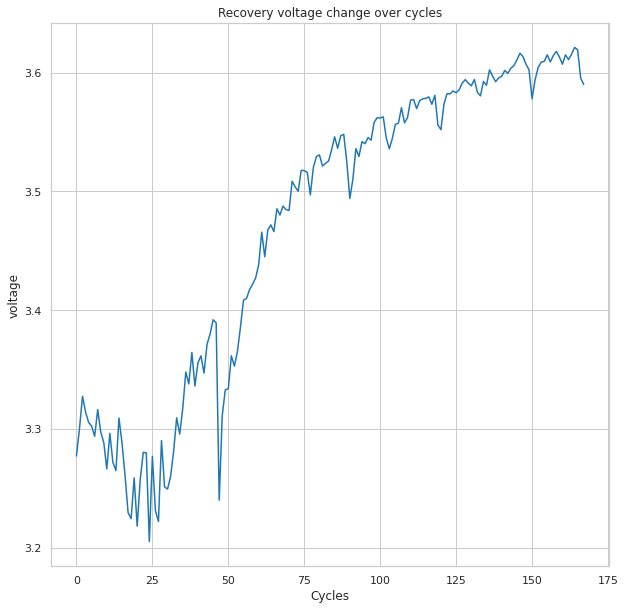

In [62]:
# Decay rate of voltage
dis_RVM = []
for i,d in enumerate(discharge_data):
  v = d['data']['Voltage_measured'][np.argmin(d['data']['Voltage_measured']) : ]
  dis_RVM.append(max(v))
plt.figure(figsize=(10,10))
plt.plot(dis_RVM)
plt.title('Recovery voltage change over cycles')
plt.xlabel('Cycles')
plt.ylabel('voltage')
plt.show()


*   The recovery voltage after discharge discontinuation is plotted for all cycles. 
* The recovery voltage seems to increase over time clearly with some irregularity in the initial measurements.
* Over time, charge capacity is decreasing but recovery voltage is increasing showing an inverse relation

#### Decay rate of voltage

* In discharge cycle, the voltage decreases over time. A polynomial curve is fitted and coefficients are observed below

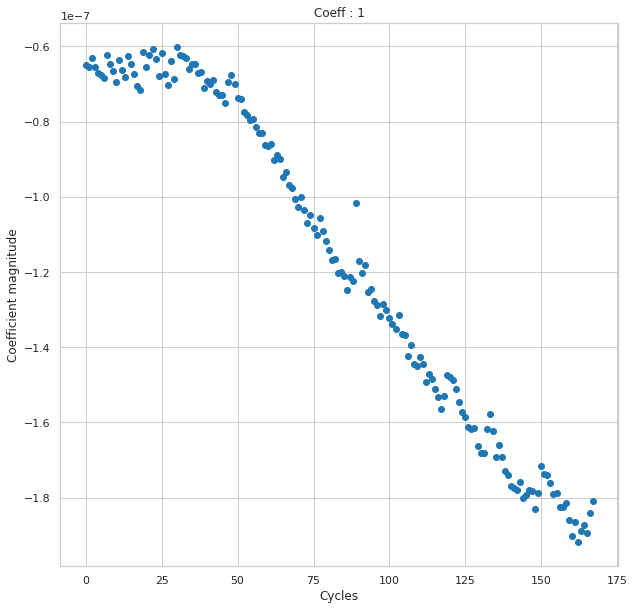

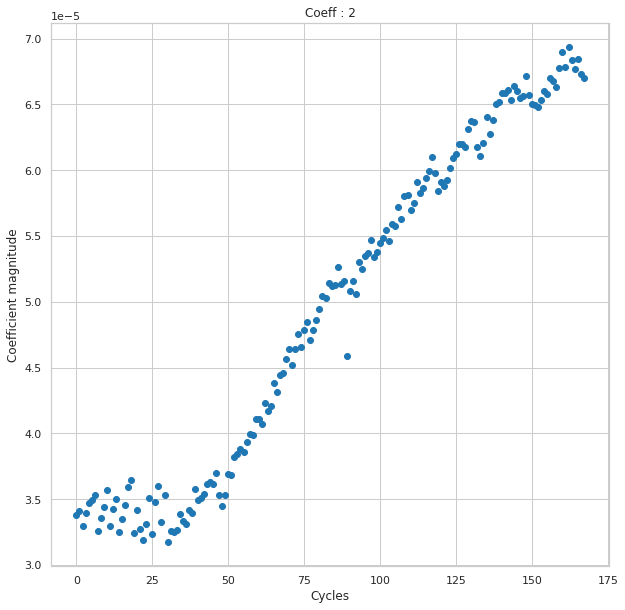

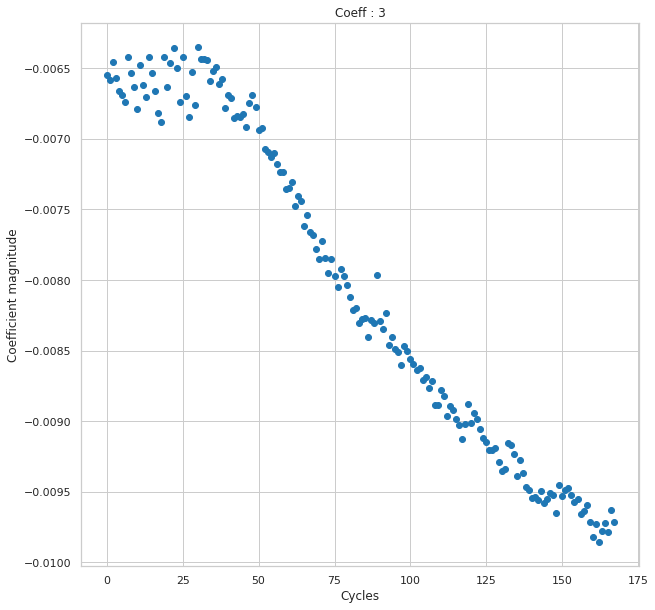

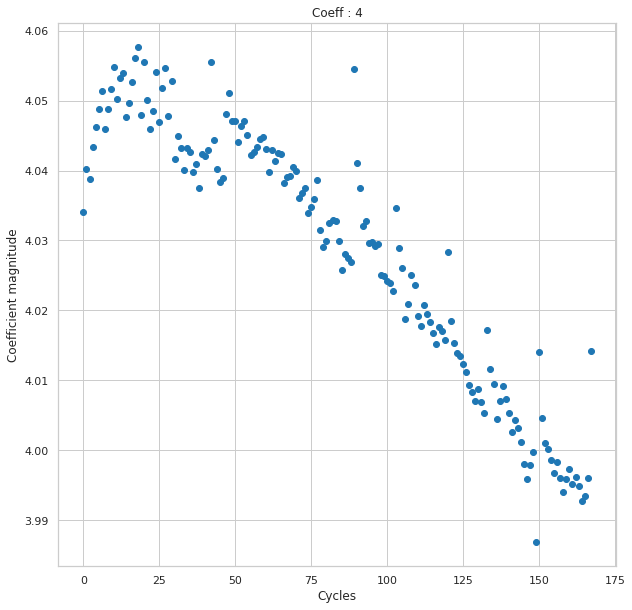

In [63]:
def get_volt_decay_params(data):
  '''
  This function obtains polynomial coefficients for voltage decay
  '''

  decay_params = []
  for i,d in enumerate(data):
    v = d['data']['Voltage_measured'][ : np.argmin(d['data']['Voltage_measured'])]
    X = list(range(len(v)))
    Y = v
    params = np.polyfit(X, Y, deg=3) # Out of all, 3 degree polynomials are well fitted
    decay_params.append(params)

  return np.array(decay_params)

decay_params_volt = get_volt_decay_params(discharge_interpolated)

for coeff in range(4):
  
  plt.figure(figsize=(10,10))
  plt.scatter(np.arange(len(decay_params_volt)),decay_params_volt[:,coeff])
  plt.title('Coeff : '+ str(coeff+1))
  plt.xlabel('Cycles')
  plt.ylabel('Coefficient magnitude')
  plt.show()

*   Coefficients of curves fitted to decaying voltage curves in discharge cycles are plotted above.
* There is a clear trend in the coefficients. however their relative magnitudes should be accounted if it is used as a feature
*   The issue is with the initial observations which is discussed above
*   Coefficients of fitted curve for voltage decay is reducing consistently on how there is a decrease in voltage duration as cycles increases. These coefficients captures the changes in curves observed in 3D plots 

#### Growth parameters of temperature in CC mode

* During discharge, as long as the current stayed constant, the temperature steadily rises
* The variation of rise of temperature can be observed by fitting a polynomial curve and plotting coefficients

First 3 growth rates : 
[[ 6.70371810e-07 -3.91751006e-04  9.46915276e-02  2.42973434e+01]
 [ 6.47462330e-07 -3.75239709e-04  9.11501617e-02  2.46797404e+01]
 [ 6.36885336e-07 -3.66881055e-04  8.92819139e-02  2.47401810e+01]
 [ 6.39043080e-07 -3.67070013e-04  8.90343760e-02  2.46420664e+01]
 [ 6.34400384e-07 -3.63892032e-04  8.84906622e-02  2.45198385e+01]]


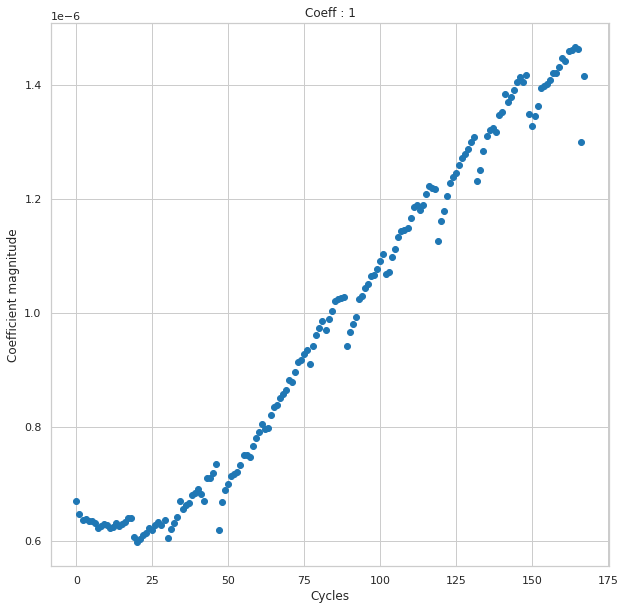

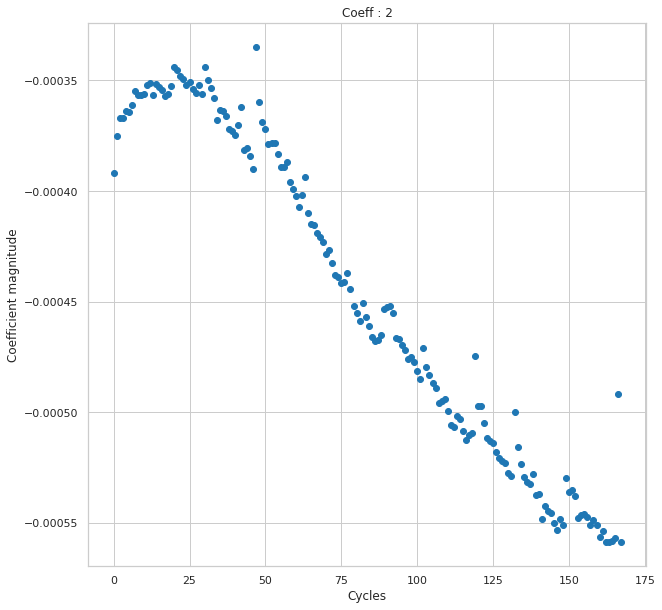

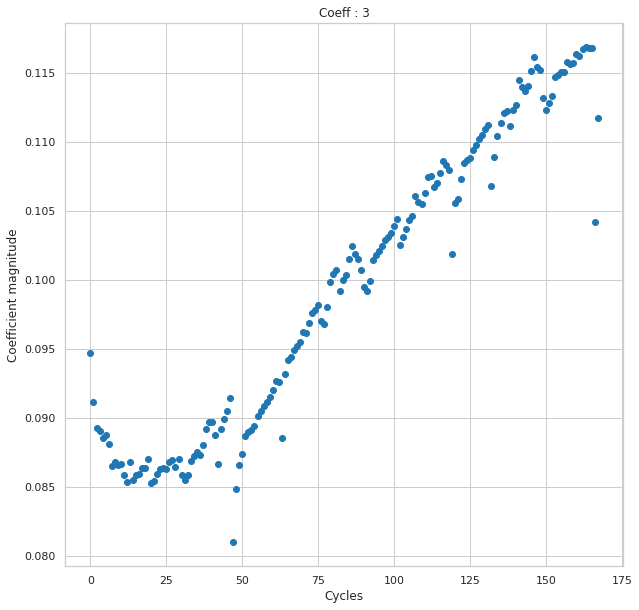

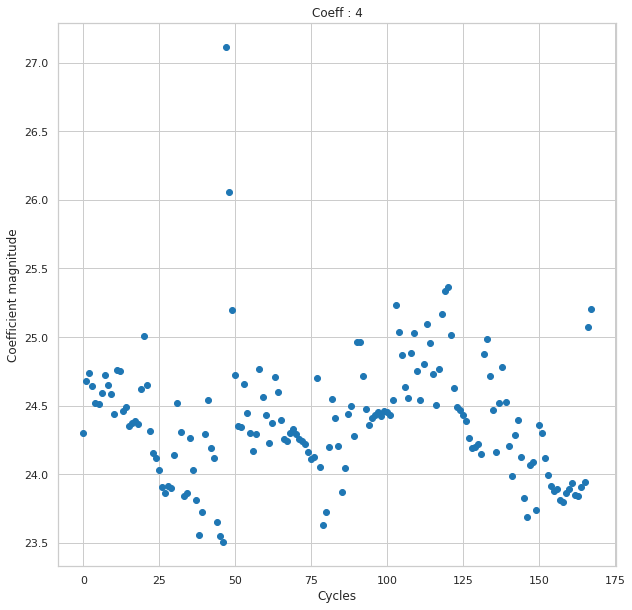

In [64]:
def get_temp_gro_params(data):
  '''
  This function obtains polynomial coefficients for voltage decay
  '''
  gro_params = []
  for i,d in enumerate(data):
    t = d['data']['Temperature_measured'][ : np.argmax(d['data']['Temperature_measured'])]
    X = list(range(len(t)))
    Y = t
    params = np.polyfit(X, Y, deg=3) # Out of all, 2th degree polynomials are well fitted
    gro_params.append(params)
  return np.array(gro_params)

gro_params_temp = get_temp_gro_params(discharge_interpolated)
print('First 3 growth rates : ')
print(gro_params_temp[:5])

for coeff in range(gro_params_temp.shape[1]):
  plt.figure(figsize=(10,10))
  plt.scatter(np.arange(len(gro_params_temp)),gro_params_temp[:,coeff])
  plt.title('Coeff : '+ str(coeff+1))
  plt.xlabel('Cycles')
  plt.ylabel('Coefficient magnitude')
  plt.show()

* These coefficients are very monotonical in comparision to other coefficient plots obtained. 
* Except for 4th coefficient, all are linearly increasing
* These coefficients can be directly used in the feature set 

#### Temperature reduction parameters after CC mode

* Similar to above mode, the temperature decay after CC mode ends is pbserved below

First 3 growth rates : 
[[-2.44017984e-06  1.84513032e-04 -3.93338262e-03 -1.32938791e-01
   3.90155999e+01]
 [-2.48284683e-06  1.92361823e-04 -4.28101825e-03 -1.24567702e-01
   3.90538066e+01]
 [-1.77818438e-06  1.47593554e-04 -3.37582934e-03 -1.29190363e-01
   3.88471570e+01]
 [-2.37275922e-06  1.79605054e-04 -3.94226677e-03 -1.25055281e-01
   3.87832906e+01]
 [-2.26690548e-06  1.72800648e-04 -3.80086748e-03 -1.24985552e-01
   3.86876716e+01]]


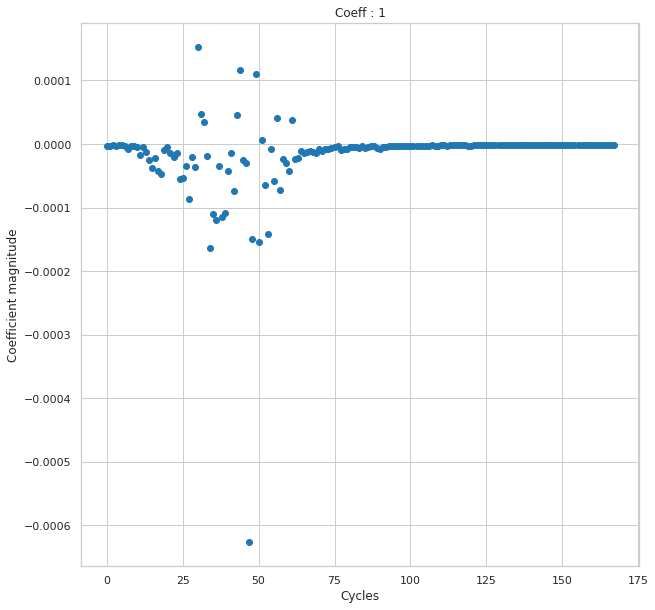

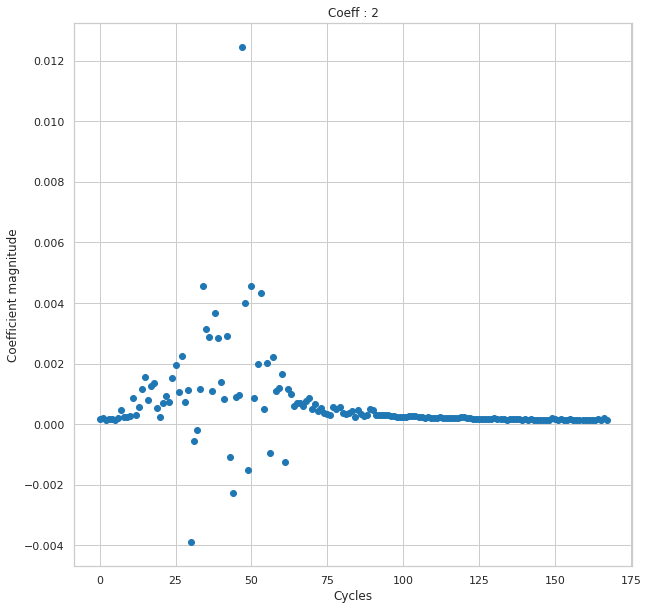

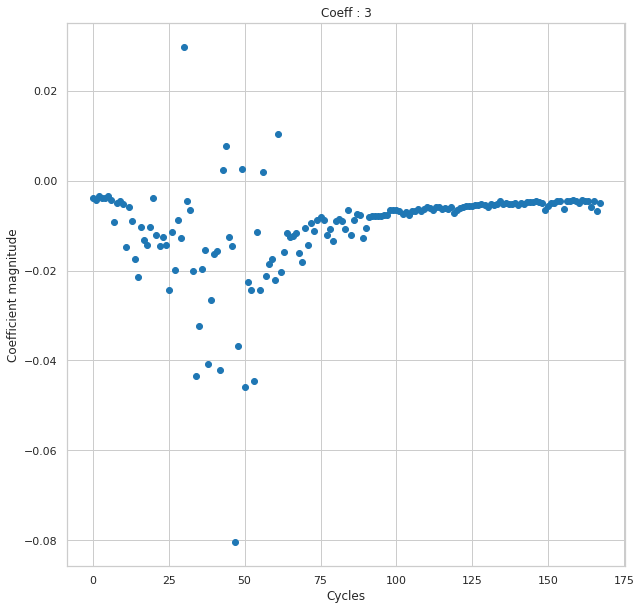

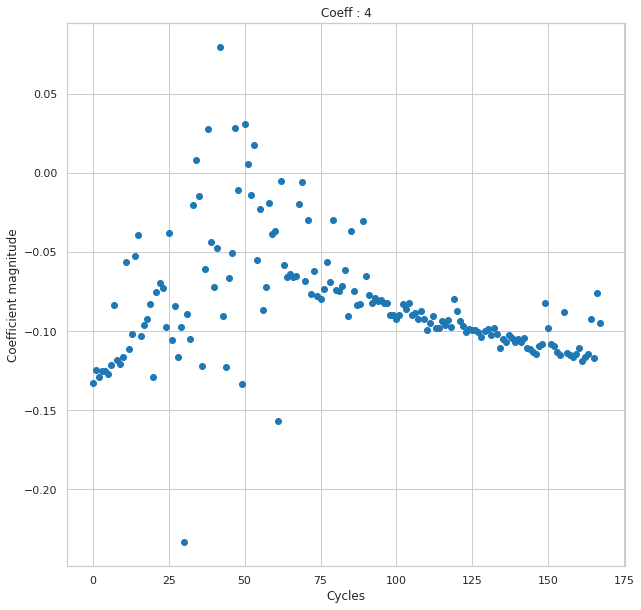

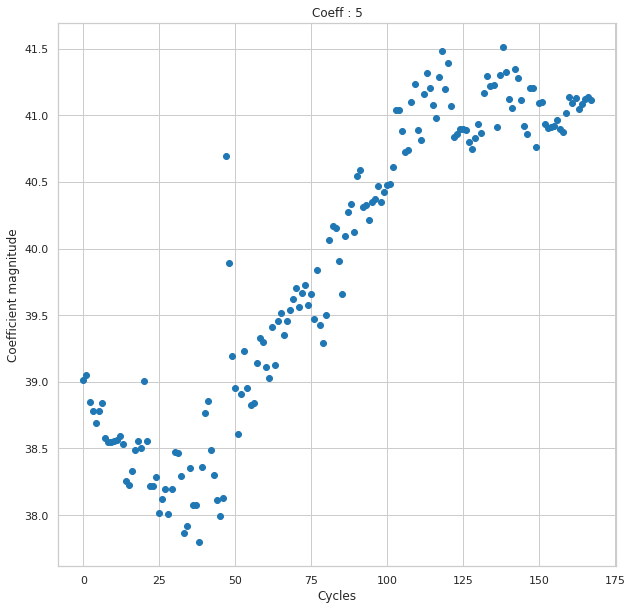

In [65]:
def get_temp_gro_params(data):
  '''
  This function obtains polynomial coefficients for voltage decay
  '''

  gro_params = []
  for i,d in enumerate(data):
    t = d['data']['Temperature_measured'][np.argmax(d['data']['Temperature_measured']) : ]
    X = list(range(len(t)))
    Y = t
    params = np.polyfit(X, Y, deg=4) # Out of all, 4th degree polynomials are well fitted
    gro_params.append(params)
  return np.array(gro_params)

gro_params_temp = get_temp_gro_params(discharge_interpolated)
print('First 3 growth rates : ')
print(gro_params_temp[:5])

for coeff in range(gro_params_temp.shape[1]):
  
  plt.figure(figsize=(10,10))
  plt.scatter(np.arange(len(gro_params_temp)),gro_params_temp[:,coeff])
  plt.title('Coeff : '+ str(coeff+1))
  plt.xlabel('Cycles')
  plt.ylabel('Coefficient magnitude')
  plt.show()

* These coefficients are slightly chaotic and doesnt represent any proper change in values as the number of cycles increases
* Coeffifient 5 slightly correlates with decreasing cell capacity, but coeff at start and end of  the cycle is not consistent
* Therefore none of these coefficients are suitable for feature set

<hr>

# Sequential Spectrum Analysis

* In previous methods, feature information is extracted by looking at only one cycle information. 
* As the battery capacity degrades, there are noticable differences in charge - discharge profiles. this difference between cycles are not noticable when looked at two consecutive cycles, but are observable when looked few cycles away from current cycle
* These cycles also contain lot of noise while logging which makes point to point comparasion difficult. 
* The consecutive method uses SSA to remove periodical noise, fluctations etc from the main cycle data which are then compared with previous cycles.
* For each current cycle, past 10 cycles data can be used to obtain relative change in profiles which captures/correlates to reduction in capacity over time

In [66]:
# Interpolating before working with SSA
B5_cd_i = copy.deepcopy(B5_cd)
for i, d in enumerate(B5_cd):
  if d['type'] == 'charge':
   if len(d['data']['Time']) < 3500:
     print('charge:')
     B5_cd_i[i]['data'] = step_interpolate(d['data'], step=3.5) 
  elif d['type'] == 'discharge':
    if len(d['data']['Time']) < 300:
      print('discharge:')
      B5_cd_i[i]['data'] = step_interpolate(d['data'], step=14) 


charge:
Length before interpolation: 789
Length after interpolation:  2863
discharge:
Length before interpolation: 197
Length after interpolation:  393
charge:
Length before interpolation: 940
Length after interpolation:  3854
discharge:
Length before interpolation: 196
Length after interpolation:  391
charge:
Length before interpolation: 937
Length after interpolation:  3829
discharge:
Length before interpolation: 195
Length after interpolation:  389
charge:
Length before interpolation: 933
Length after interpolation:  3802
discharge:
Length before interpolation: 194
Length after interpolation:  387
charge:
Length before interpolation: 937
Length after interpolation:  3831
discharge:
Length before interpolation: 194
Length after interpolation:  387
charge:
Length before interpolation: 952
Length after interpolation:  3934
discharge:
Length before interpolation: 195
Length after interpolation:  389
charge:
Length before interpolation: 952
Length after interpolation:  3940
discharge:
Le

In [67]:
# Chaining logs of voltage, current and temperature

v_seq = []
ps = np.arange(0,100,1) # 100 percentile values from the cycles 
for d in B5_cd_i:
  v_seq.extend(np.percentile(d['data']['Voltage_measured'], ps))
v_seq = np.array(v_seq)

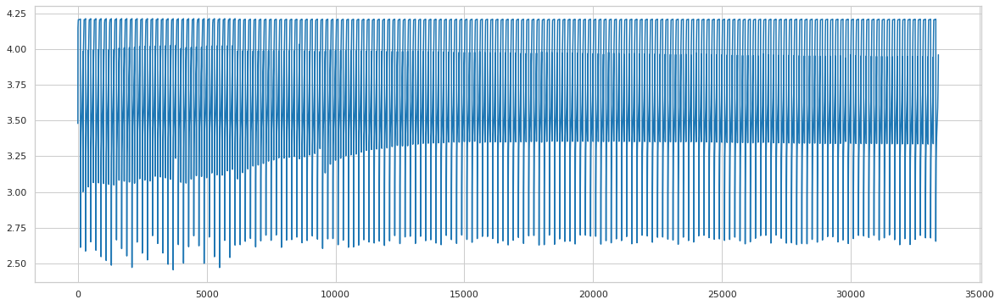

In [68]:
plt.figure(figsize = (20,6))
plt.plot(v_seq)

* A plot of sequential voltage cycle charge+discharge cycles till EOL
* This plot has some changes in the beginning cycles but not identifyiable at the end of cycles
* there will definitely be changes in time durations which are not visible in this plot

In [69]:
# SSA transformation
transformer = SingularSpectrumAnalysis(window_size=6) # splitting into 6 spectrums
v_ssa = transformer.transform(v_seq.reshape(1,-1))
v_ssa.shape

(6, 33400)

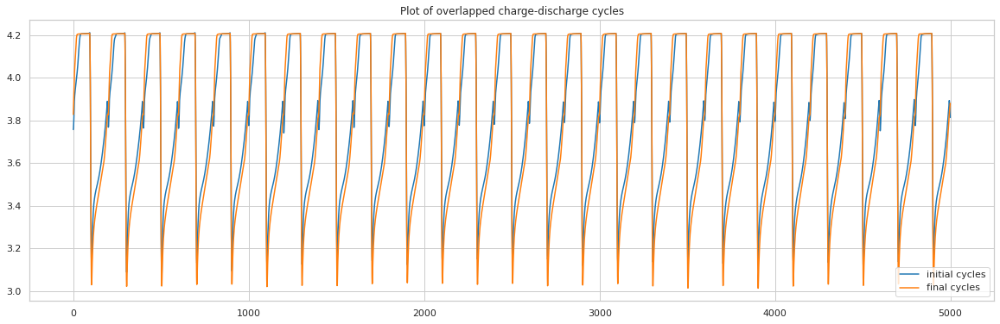

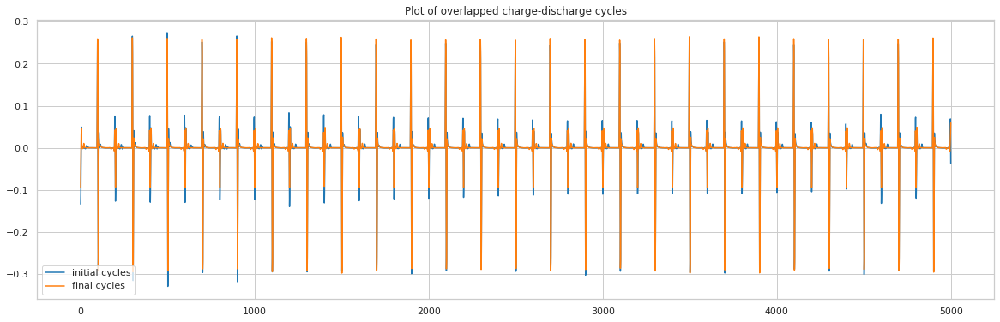

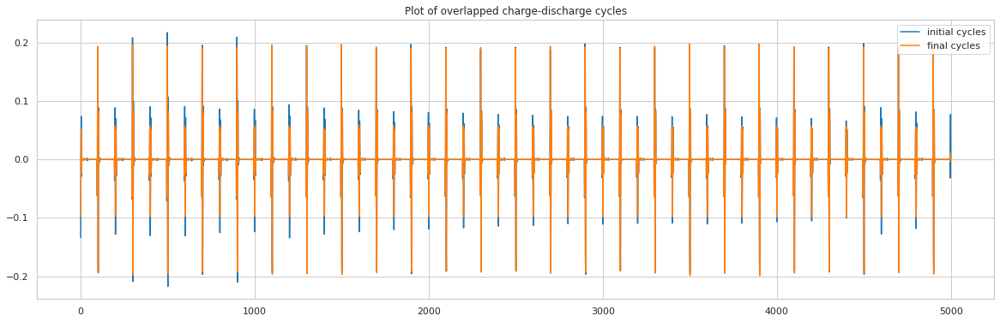

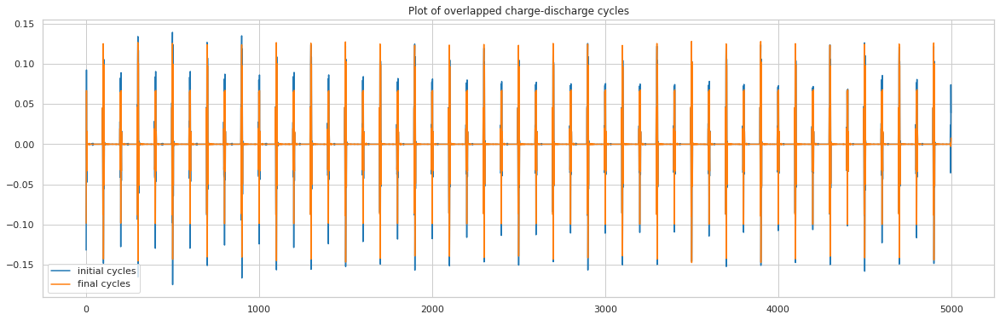

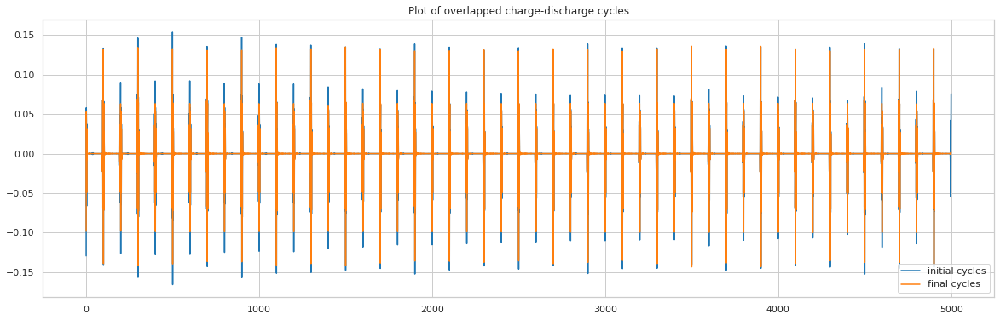

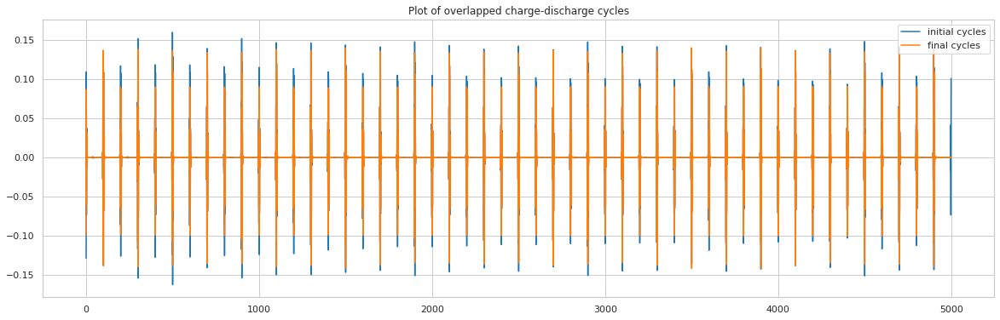

In [70]:
for i in v_ssa[:6]:
  plt.figure(figsize=(20,6))
  plt.plot(i[5000:10000], label='initial cycles')
  plt.plot(i[-5000:], label='final cycles')
  plt.title('Plot of overlapped charge-discharge cycles')
  plt.legend()
  plt.show()


* The above plot is plot of individual components of spectrum splitted voltage data
* It can be observed that as we go to higher order components, magnitude decreases
* Ignoring higher order components and adding initial components results in a better filtered curve, although in this analysis, only first component is used
* When overlapped with initial and final cycles, there is a clear difference in cycles 

### Similarity based analysis

* A window of 10 previous cycles is averaged and then compared with current cycle data to obtain an estimate of similarity

In [71]:
# v_ssa_er = np.sum(v_ssa[1:3,:], axis = 0)
v_ssa_er = v_ssa[0]
v_wind = []
window_size = 10

for i in range(len(v_ssa_er)):
  if 200*(i+1) < len(v_ssa_er):
    v_wind.append(v_ssa_er[i*200 : 200*(i+1)])

len(v_wind)

166

In [72]:
v_diff = []
for i in range(window_size,len(v_wind)):
  v_diff.append(np.mean(np.log(np.dot(v_wind[i],np.mean(v_wind[i-10 : i-1], axis=0)))))

len(v_diff)

156

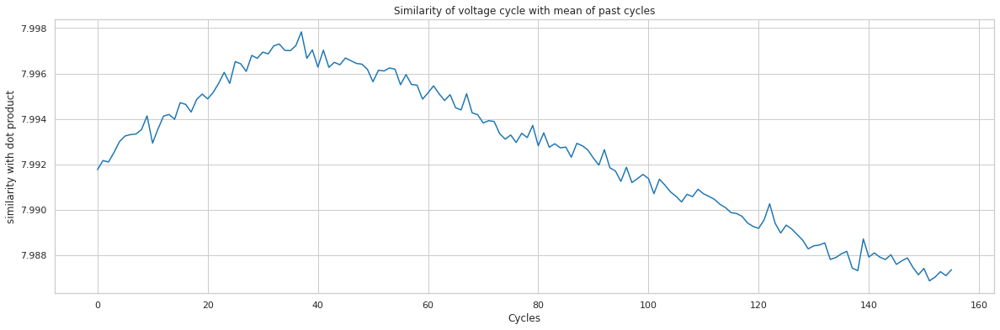

In [73]:
plt.figure(figsize=(20,6))
plt.plot(v_diff)
plt.title('Similarity of voltage cycle with mean of past cycles')
plt.xlabel('Cycles')
plt.ylabel('similarity with dot product')
plt.show()

* The above plot is log of dot product between current cycle and mean of past 10 cycles
* The similarity increased in the beginning and then steadily decreasing till the end, which is not ideal and not correct as well, as it should decrease over time continuously
* Even though relation is not linear, it can be included and checked with feature selection

### Analysis by splitting into charge and discharge cycles

* Similar to the above analysis but seperated as charge and discharge cycles

#### Charge voltage

In [74]:
# charge voltage

v_ch_seq = []
ps = np.arange(0,100,0.5)
for d in B5_cd_i:
  if d['type'] == 'charge':
    v_ch_seq.extend(np.percentile(d['data']['Voltage_measured'], ps))

v_seq = np.array(v_ch_seq)
transformer = SingularSpectrumAnalysis(window_size=10)
v_ssa = transformer.transform(v_seq.reshape(1,-1))
v_ssa.shape

(10, 33400)

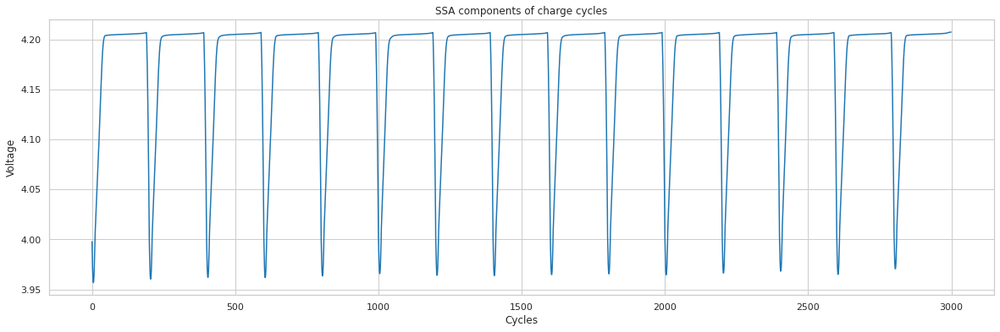

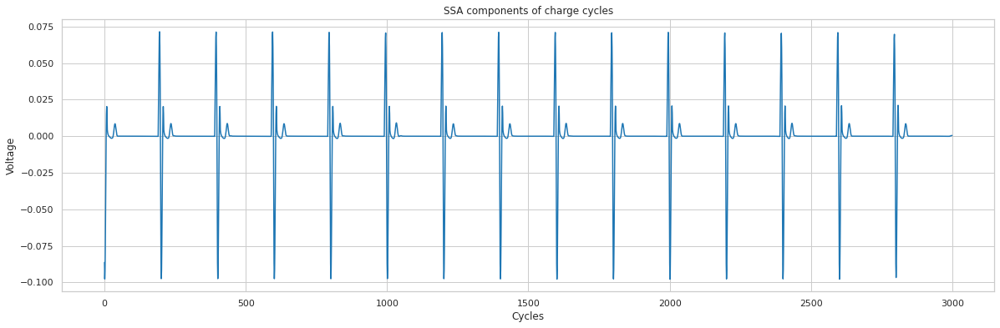

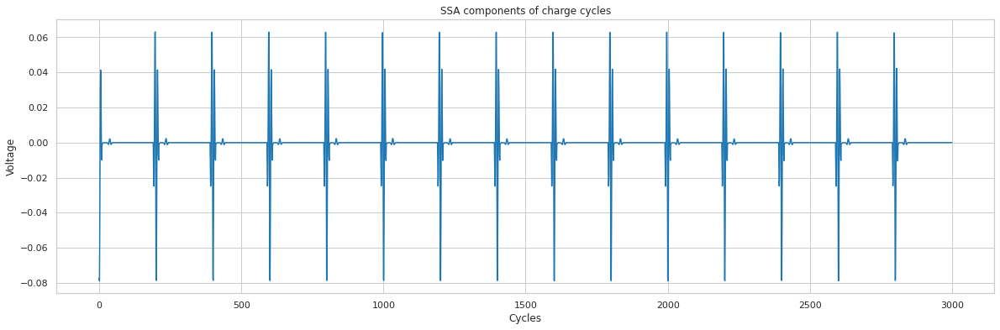

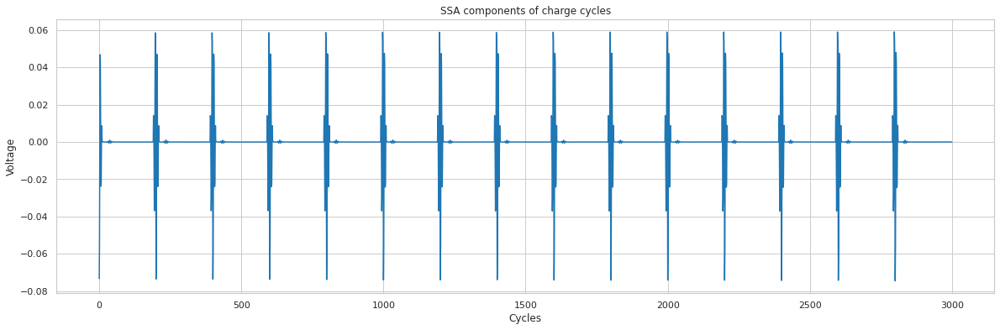

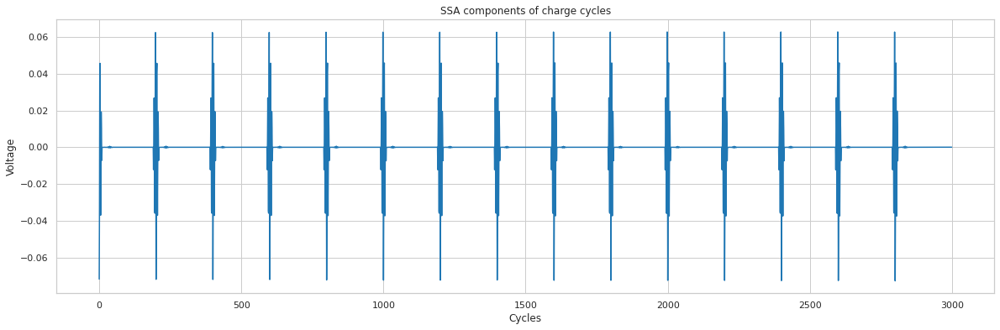

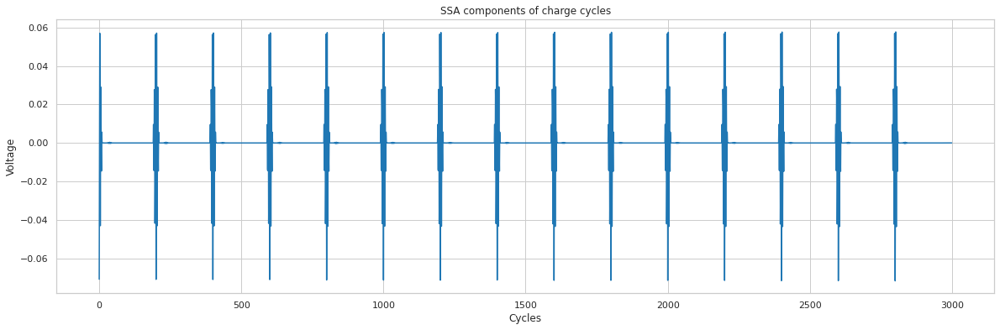

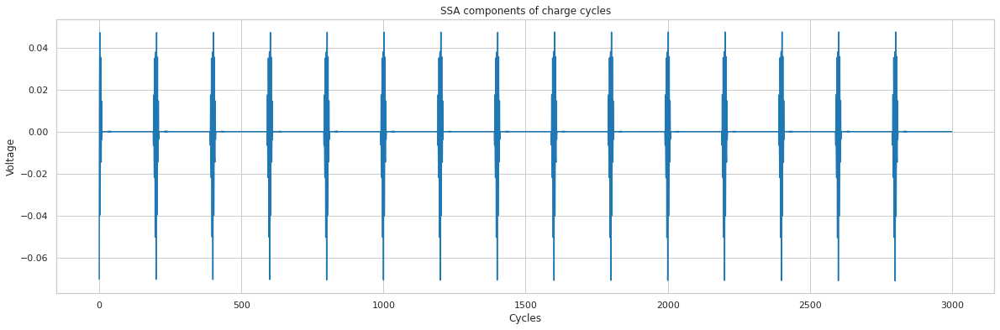

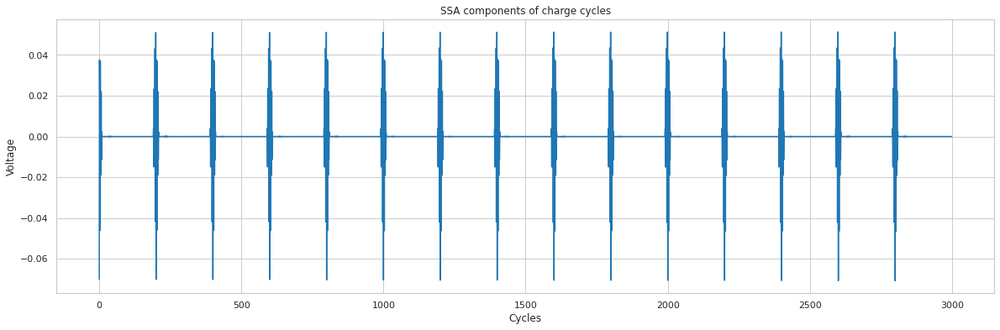

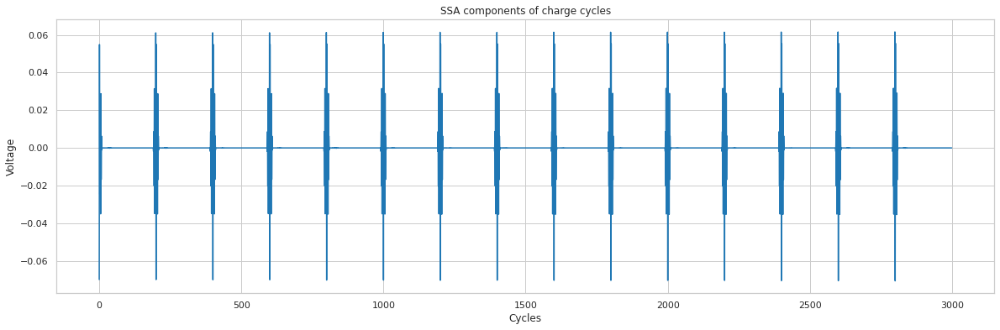

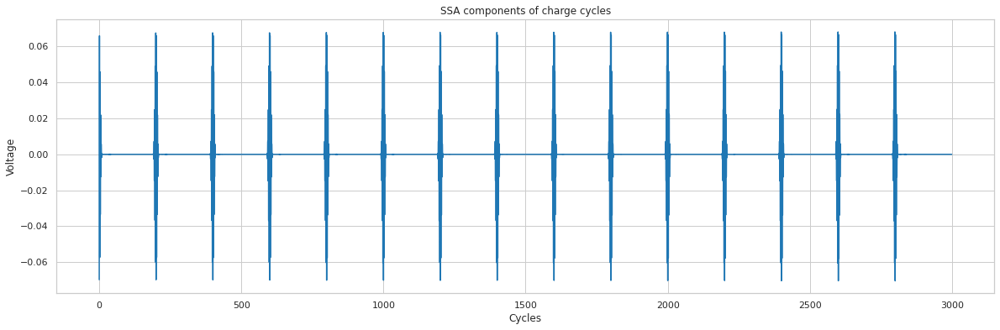

In [75]:
for i in v_ssa:
  plt.figure(figsize=(20,6))
  plt.plot(i[-3000:])
  plt.title('SSA components of charge cycles')
  plt.xlabel('Cycles')
  plt.ylabel('Voltage')
  plt.show()

*  The above plot is components of all splitted components of charge cycle
*  Initial 2 charge components seems to carry infomation(fluctuations)
*  Other components have very less magnitude and their occurence is also for very less duration

In [76]:
v_split = []
window_size = 10
d_len = len(ps)
v = np.sum(v_ssa[0:2,:], axis = 0) # Sum of first 2 components
# v = v_ssa[0,:]
for i in range(len(v)):
  if d_len*(i+1) < len(v):
    v_split.append(v[i*d_len : d_len*(i+1)])

v_diff = []
for i in range(window_size,len(v_split)):
  v_diff.append(np.mean(np.log(np.dot(v_split[i],np.mean(v_split[i-10 : i-1], axis=0)))))

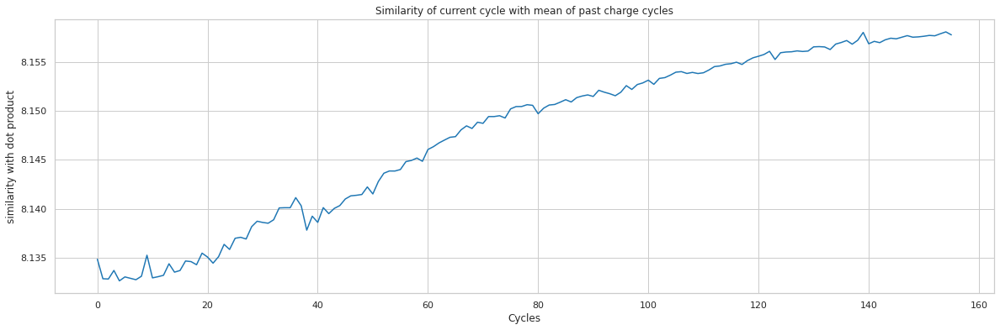

In [77]:
plt.figure(figsize=(20,6))
plt.plot(v_diff)
plt.title('Similarity of current cycle with mean of past charge cycles')
plt.xlabel('Cycles')
plt.ylabel('similarity with dot product')
plt.show()

* It can be seen that the dot product of current cycle with mean of past 10 cycles is increasing over cycles. this is a clear trend, almost monotonically increasing
* Compared to previous combined analysis, here, the dot product seems to increase over time continuously
* It can be used as a feature considering for every cycle, past 10 cycles are present

#### Discharge voltage

In [78]:
# discharge voltage

v_dch_seq = []
ps = np.arange(0,100,0.5)
d_len = len(ps)
for d in B5_cd_i:
  if d['type'] == 'discharge':
    v_dch_seq.extend(np.percentile(d['data']['Voltage_measured'], ps))

v_seq = np.array(v_dch_seq)
transformer = SingularSpectrumAnalysis(window_size=10)
v_ssa = transformer.transform(v_seq.reshape(1,-1))
v_ssa.shape

(10, 33400)

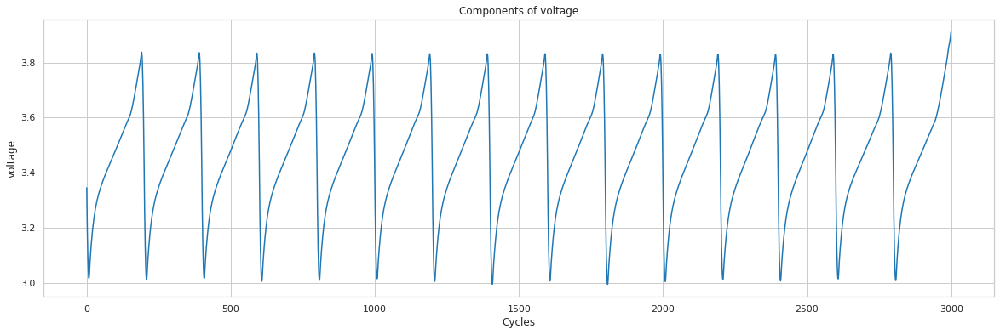

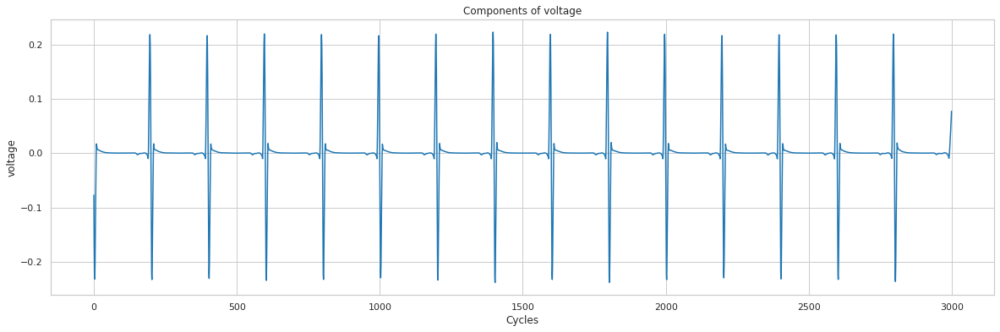

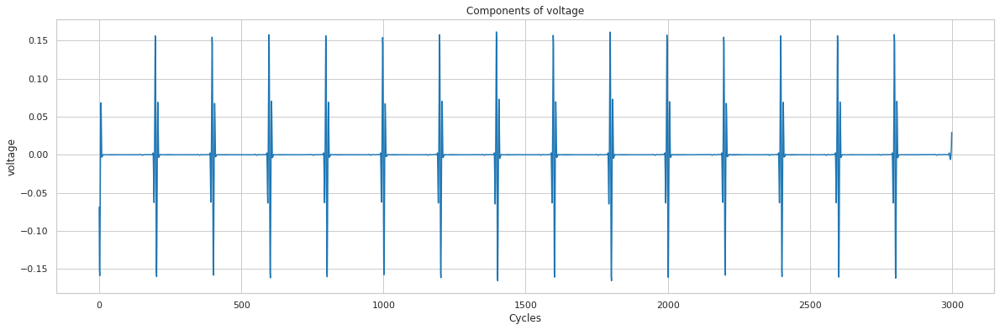

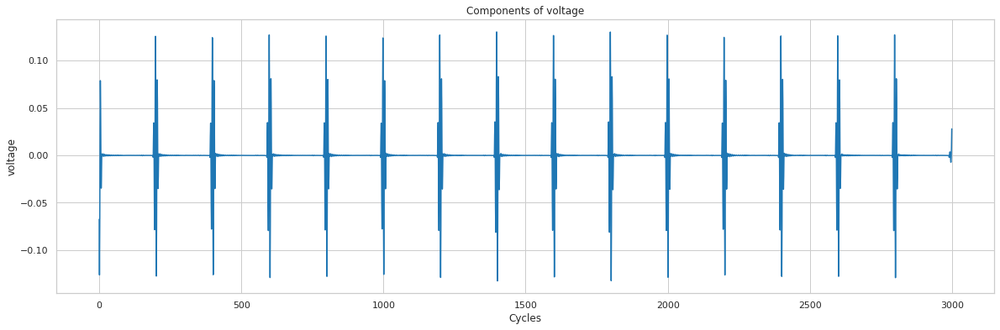

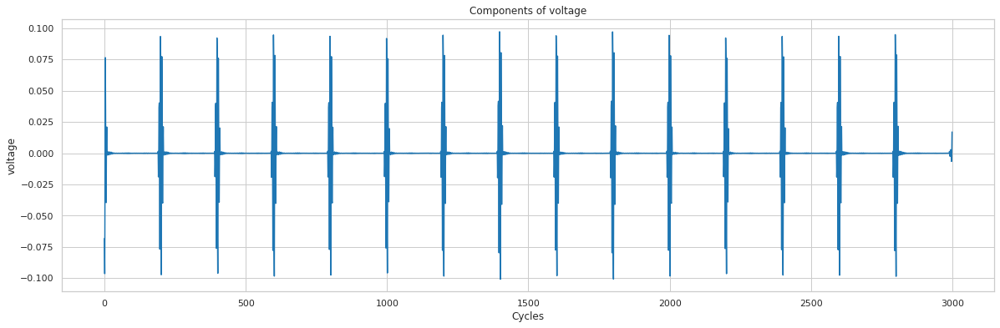

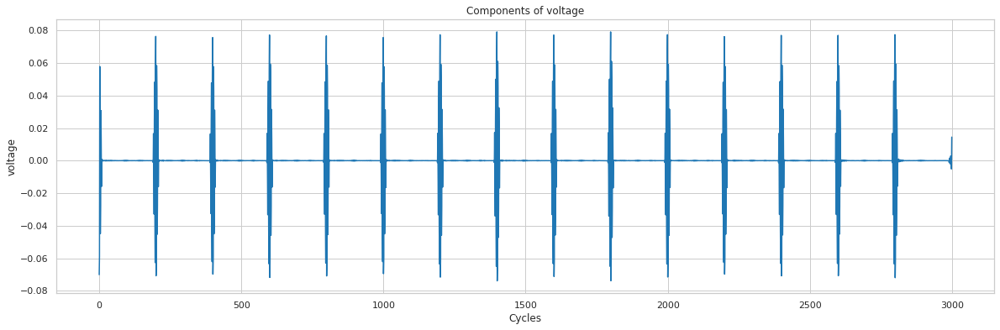

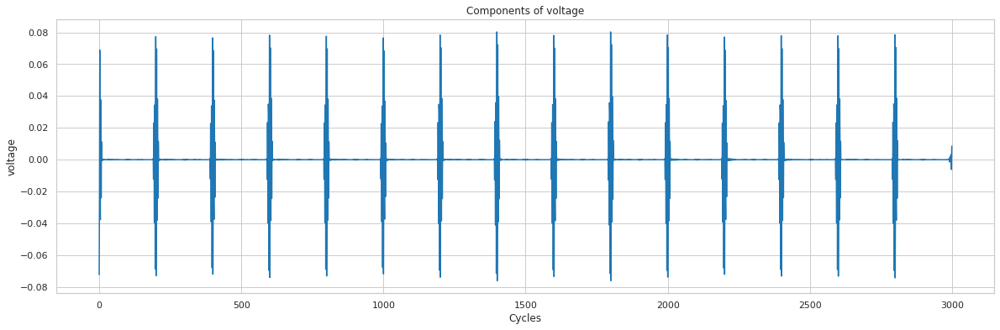

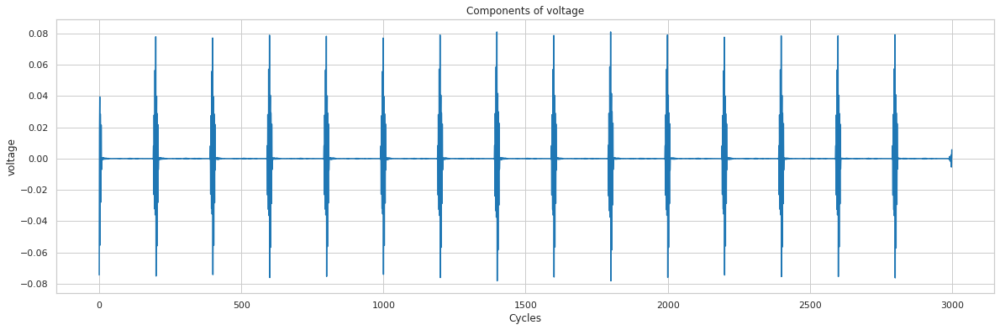

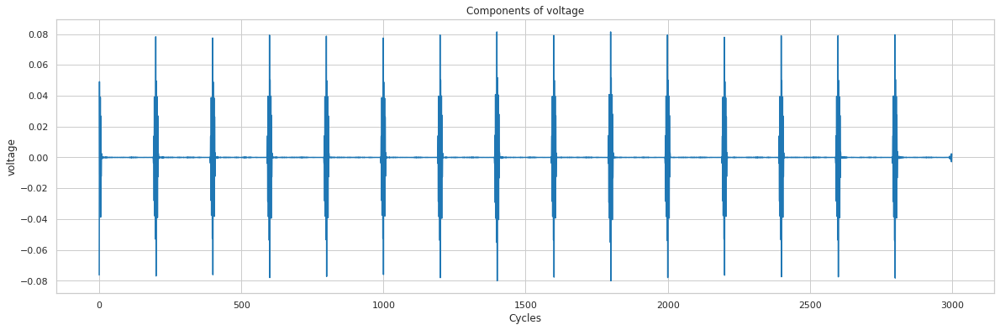

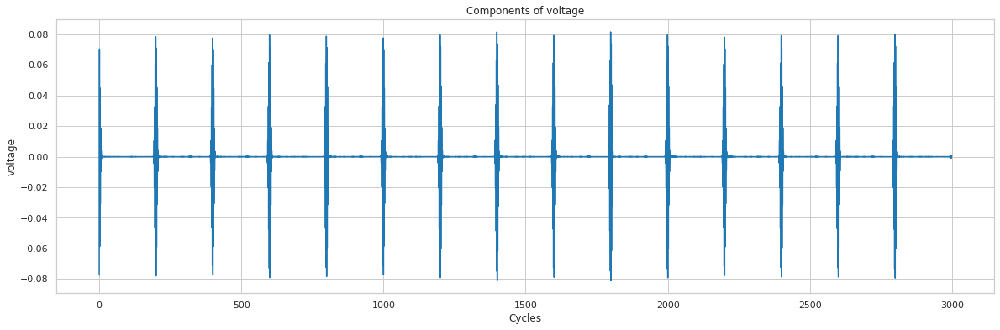

In [79]:
for i in v_ssa:
  plt.figure(figsize=(20,6))
  plt.plot(i[-3000:])
  plt.title('Components of voltage')
  plt.xlabel('Cycles')
  plt.ylabel('voltage')
  plt.show()

* The above are plots of components of discharge voltage after SSA is done

In [80]:
v_split = []
window_size = 10
v = np.sum(v_ssa[0:2,:], axis = 0)
# v = v_ssa[0,:]
for i in range(len(v)):
  if d_len*(i+1) < len(v):
    v_split.append(v[i*d_len : d_len*(i+1)])

v_diff = []
for i in range(window_size,len(v_split)):
  v_diff.append(np.mean(np.log(np.dot(v_split[i],np.mean(v_split[i-10 : i-1], axis=0)))))

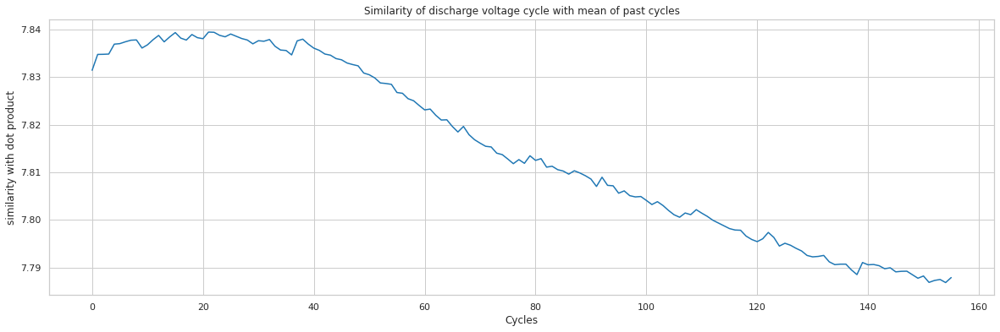

In [81]:
plt.figure(figsize=(20,6))
plt.plot(v_diff)
plt.title('Similarity of discharge voltage cycle with mean of past cycles')
plt.xlabel('Cycles')
plt.ylabel('similarity with dot product')
plt.show()

* in discharge cycles, contrary to charge graph, the similarity is decreasing over cycles and similar to charge cycles, there is a sudden change between cycles 35 and 40. 
* These changes could be cell specific or charge protocol specific, as the changes in cells usually occur gradually not instantaneously.

#### Charge current

* Similarity analysis with current data

In [82]:
# Charge current
i_ch_seq = []
ps = np.arange(0,100,0.5)
d_len = len(ps)
for d in B5_cd_i:
  if d['type'] == 'charge':
    i_ch_seq.extend(np.percentile(d['data']['Current_measured'], ps))

i_seq = np.array(i_ch_seq)
transformer = SingularSpectrumAnalysis(window_size=10)
i_ssa = transformer.transform(i_seq.reshape(1,-1))
i_ssa.shape

(10, 33400)

In [83]:
I_split = []
window_size = 10
I = np.sum(i_ssa[0:2,:], axis = 0)
# v = v_ssa[0,:]
for i in range(len(I)):
  if d_len*(i+1) < len(I):
    I_split.append(I[i*d_len : d_len*(i+1)])

I_diff = []
for i in range(window_size,len(I_split)):
  I_diff.append(np.mean(np.log(np.dot(I_split[i],np.mean(I_split[i-10 : i-1], axis=0)))))

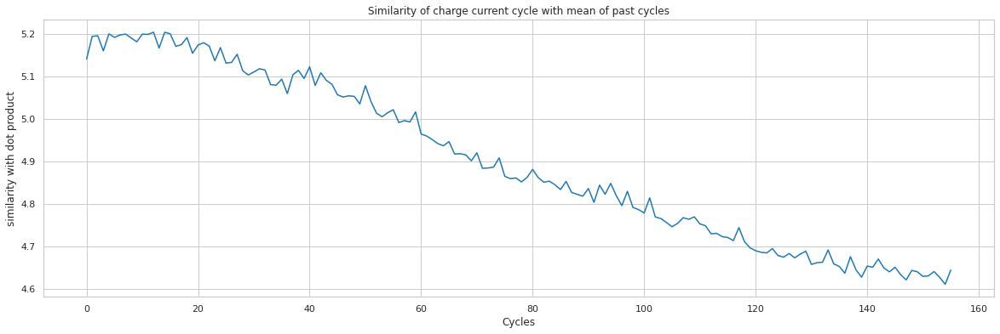

In [84]:
plt.figure(figsize=(20,6))
plt.plot(I_diff)
plt.title('Similarity of charge current cycle with mean of past cycles')
plt.xlabel('Cycles')
plt.ylabel('similarity with dot product')
plt.show()

* This is same dot product but with current charge cycles
* There are lot of high frequency noise in the plot. these values cannot be replaced with filtered values as these are directly dot product with SSA components. 
* The decreasing nature is in correlation in decreasing capacity of cell over cycles 

#### Discharge current

In [85]:
# discharge current
i_dch_seq = []
ps = np.arange(0,100,0.5)
d_len = len(ps)
for d in B5_cd_i:
  if d['type'] == 'discharge':
    i_dch_seq.extend(np.percentile(d['data']['Current_measured'], ps))

i_seq = np.array(i_dch_seq)
transformer = SingularSpectrumAnalysis(window_size=10)
i_ssa = transformer.transform(i_seq.reshape(1,-1))
i_ssa.shape

(10, 33400)

In [86]:
I_split = []
window_size = 10
I = np.sum(i_ssa[0:2,:], axis = 0)
# v = v_ssa[0,:]
for i in range(len(I)):
  if d_len*(i+1) < len(I):
    I_split.append(I[i*d_len : d_len*(i+1)])

I_diff = []
for i in range(window_size,len(I_split)):
  I_diff.append(np.mean(np.dot(I_split[i],np.mean(I_split[i-10 : i-1], axis=0))))

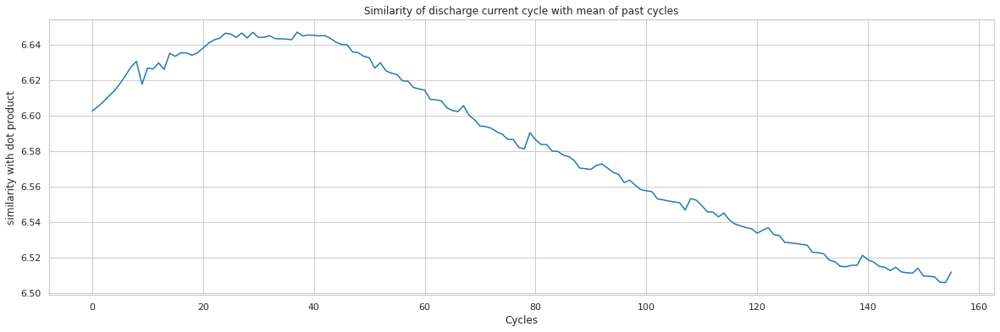

In [87]:
plt.figure(figsize=(20,6))
plt.plot(np.log(I_diff))
plt.title('Similarity of discharge current cycle with mean of past cycles')
plt.xlabel('Cycles')
plt.ylabel('similarity with dot product')
plt.show()

* In this plot, there is an initial rise and then drop which is a problem because for a same similarity values, there are two cycles present.
* This could also be due to interpolation as SSA is drawn over interpolated values.

#### Reference cycle vs current cycle

* first 10 cycles are considered as  reference cycle and rest of the cycle data is compared to reference cycles


In [88]:
?transformer = SingularSpectrumAnalysis(window_size=10)
v_ssa = transformer.transform(v_seq.reshape(1,-1))
v_ssa = v_ssa[0,:]
v_ssa_r = v_ssa.reshape(-1, 200)

In [89]:
# Considered first 10 cycles as reference cycle and for rest of cycles
# either dot product 
v_ref = np.mean(v_ssa_r[:10,:], axis = 0)
v_diff = []
for i in range(len(v_ssa_r)):
  v_diff.append(np.dot(v_ref, v_ssa_r[i]))

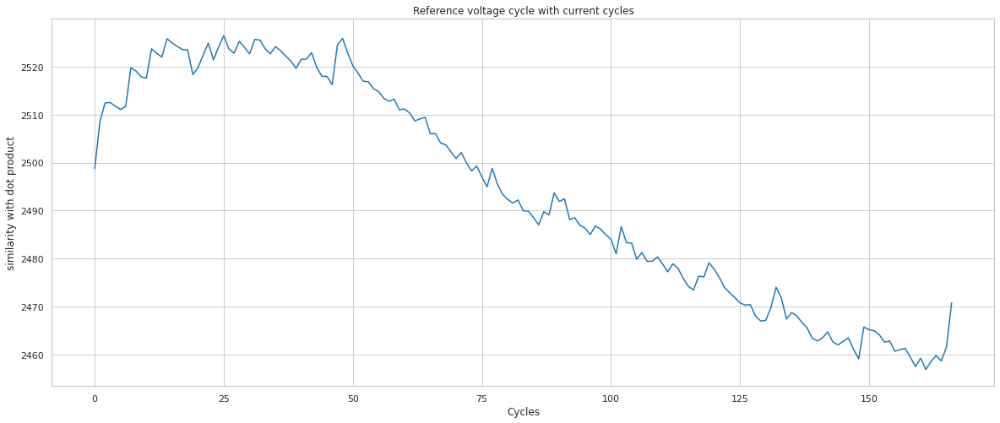

In [90]:
plt.figure(figsize=(20,8))
plt.plot(v_diff)
plt.title('Reference voltage cycle with current cycles')
plt.xlabel('Cycles')
plt.ylabel('similarity with dot product')
plt.show()

* There are significant high frequency changes which are consistent through out the cycle end.
* Expectation is that the dot product should reduce over time, which is happening at the second half of the plot but not in the first half.
* Also, if reference cycle is incorrect or not as it is supposed to be, then the whole feature will be inconsistent and irrelavent.
* Due to the following reasons, this could be problematic to include in the features.

### Fourier analysis

Note:
* Fourier analysis did what i expected out of wavelet transforms. 
* Hence, replaced wavelet transforms with fourier transform
* https://ataspinar.com/2018/04/04/machine-learning-with-signal-processing-techniques/

In [91]:
# voltage
v_ch_seq = []
ps = np.arange(0,100,0.5)
for d in B5_cd_i:
  if d['type'] == 'charge' or d['type'] == 'discharge' :
    v_ch_seq.extend(np.percentile(d['data']['Voltage_measured'], ps))

v_seq = np.array(v_ch_seq)
transformer = SingularSpectrumAnalysis(window_size=10)
v_ssa = transformer.transform(v_seq.reshape(1,-1))
v_ssa = np.sum(v_ssa[0:2,:],axis=0) # considering first 2 components
v_ssa.shape

(66800,)

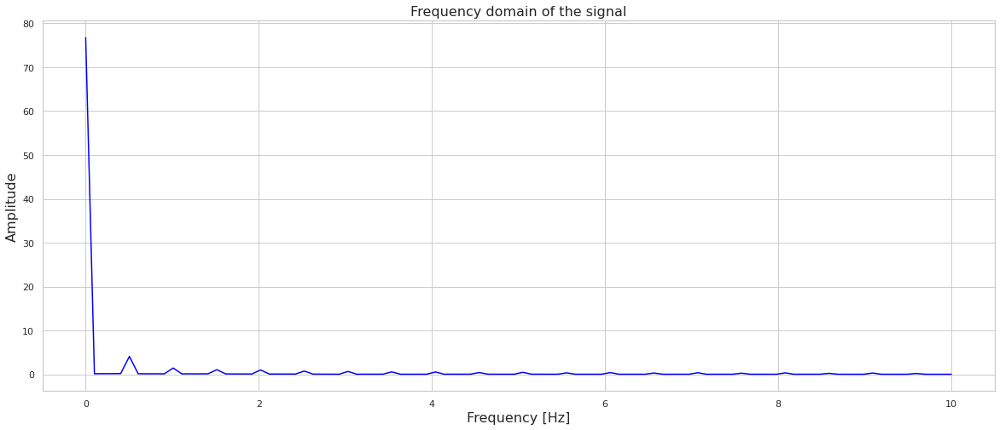

In [92]:
# https://ataspinar.com/2018/04/04/machine-learning-with-signal-processing-techniques/
from scipy.fftpack import fft

# Snippet from the above link
def get_fft_values(y_values, T, N, f_s):
  f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)
  fft_values_ = fft(y_values)
  fft_values = 2.0/N * np.abs(fft_values_[0:N//2])
  return f_values, fft_values

t_n = 10
N = 200
T = t_n / N
f_s = 1/T

f_values, fft_values1 = get_fft_values(v_ssa[:2000], T, N, f_s)

plt.figure(figsize=(20,8))
plt.plot(f_values, fft_values1, linestyle='-', color='blue')
plt.xlabel('Frequency [Hz]', fontsize=16)
plt.ylabel('Amplitude', fontsize=16)
plt.title("Frequency domain of the signal", fontsize=16)
plt.show()

* The peak at zero frequency implies DC component of the varying voltage. it seems to be the maximum amplitude, way higher than other frequencies.
* There are other frequency values as well which are far lower in magnitude, which implies contribution is less than DC component but still significant
* Only frequencies which are greater than a threshould can be used for analysis

In [93]:
# For a given cycle, append previous 10 cycles and finding 
# highest amplitudes (based on cutoff amp = 1), then plot to verify

window_size = 10
t_n = 10
N = 200
T = t_n / N
f_s = 1/T

v_ssa_r = v_ssa.reshape(-1, 200)  # shape : (167, 200), 167 cycles with 200 data points
v_fft = []
for i in range(window_size,len(v_ssa_r)):
  _,vfft = get_fft_values(v_ssa_r[i-9 : i+1,:].flatten(),T, N, f_s)
  vfft.sort()
  v_fft.append(vfft[:-5:-1]) # Get highest amplitudes and Flip

v_fft = np.array(v_fft)

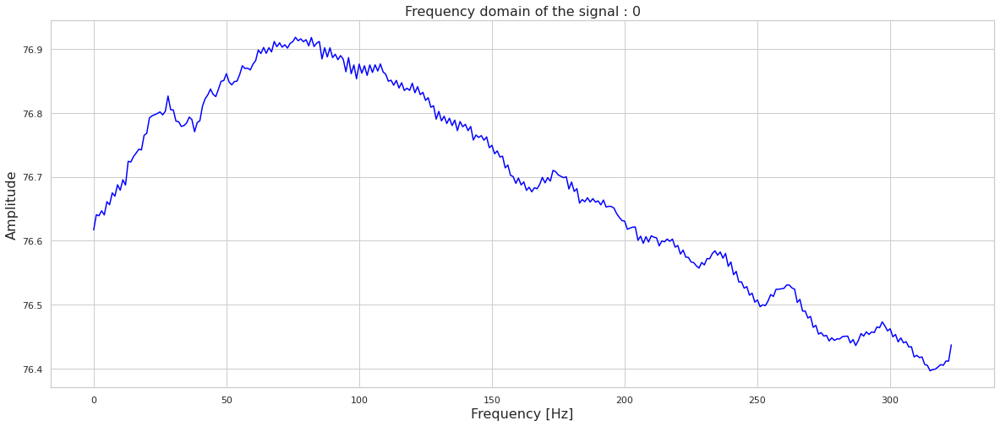

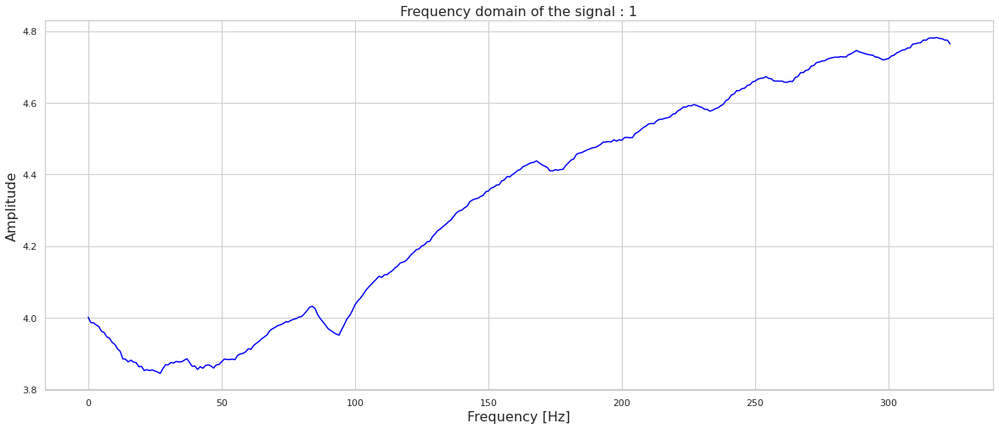

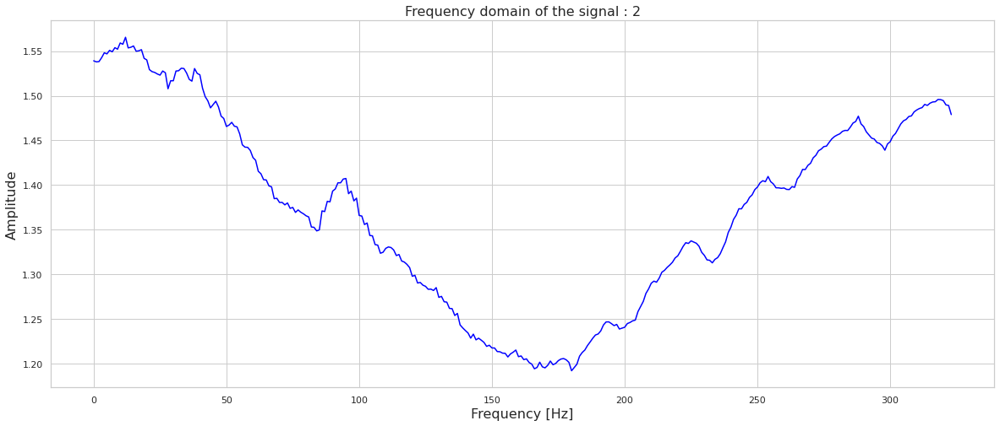

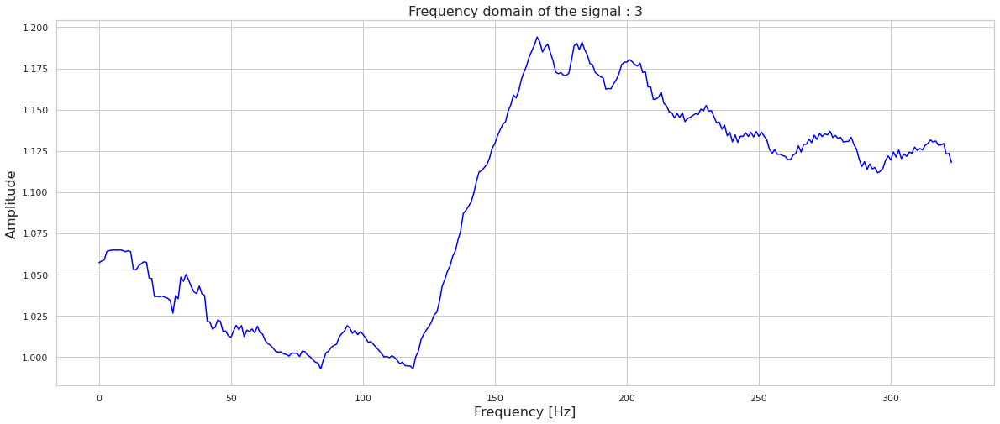

In [94]:
for i in range(v_fft.shape[1]):
  plt.figure(figsize=(20,8))
  plt.plot(v_fft[:,i], linestyle='-', color='blue')
  plt.xlabel('Frequency [Hz]', fontsize=16)
  plt.ylabel('Amplitude', fontsize=16)
  plt.title("Frequency domain of the signal : {0}".format(i), fontsize=16)
  plt.show()

* The highest amplitudes of frequency in a consecutive charge discharge cycle is shown above plots. Top signals are considered based on magnitude, amplitude 1 as cutoff.
* The amplitude in the first plot increased in the beginning(around cycle 70) and decreased consistently since then. this expected behaviour is actually decrease in value consistently, as DC component reduces over time in cycles.
* However, it can be considered as a feature as it has information of reduction of dc component.
* The amplitude in second plots are varying in correlation(-ve) over cycle data which can be used as a feature as well.
* Amplitudes in third and fourth plots are not at all consistent and varying in between cycles, which makes it hard to include in feature set

<hr>

# Target variable : Capacity 

In [95]:
sns.set_theme(style="whitegrid", palette="tab10")

In [96]:
discharge_data = [point for point in B5_cd_i if point['type']=='discharge']

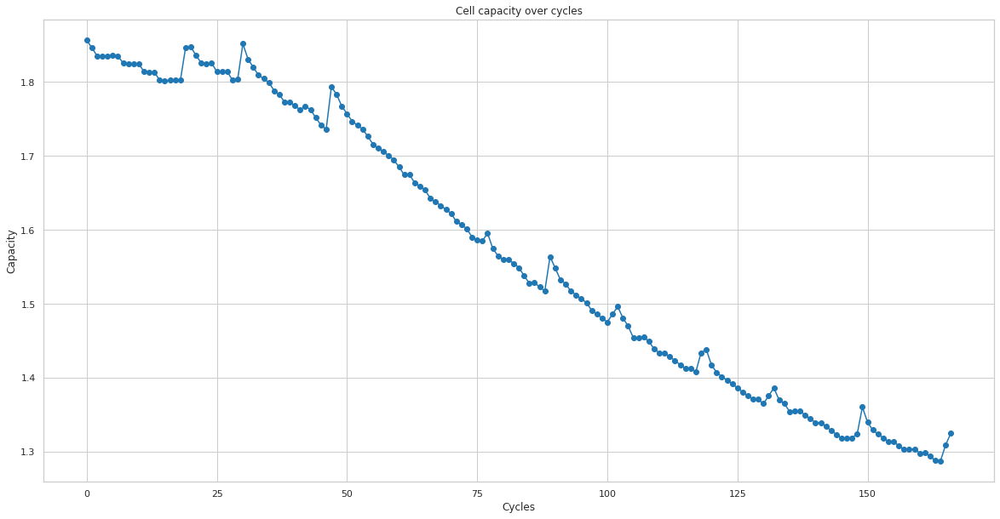

In [97]:
capacity = [d['data']['Capacity'] for d in discharge_data]
plt.figure(figsize=(20,10))
plt.plot(capacity)
plt.scatter(np.arange(len(capacity)),capacity)
plt.title('Cell capacity over cycles')
plt.xlabel('Cycles')
plt.ylabel('Capacity')
plt.show()

* The capacity data is decreasing as the number of cycles increases i.e. over time, cell is loosing it's capacity to hold charge which is naturally expected
* There are some spikes which could be due to delay of charging in testing stage. even though the spikes exist, capacity quickly returns to reduced values.
* Since charge capacity is decreasing in  nature, the feature plots are expected to be in correlation (+ve or -ve) with capacity

In [98]:
# Combining one charge and discharge cycle into one data point
B5_data = []
idx = 0
ids = 0
while idx < len(B5_cd_i):
  cyl = dict()
  cyl['charge'] = B5_cd_i[idx]
  cyl['discharge'] = B5_cd_i[idx+1]
  if B5_cd_i[idx+1]['data']['Capacity'] == B5_cd_i[idx]['data']['Capacity']:
    cyl['capacity'] = B5_cd_i[idx+1]['data']['Capacity']
  B5_data.append(cyl)
  idx+=2
  ids+=1

print('Total cycles (charge + discharge) : ',len(B5_data))

Total cycles (charge + discharge) :  167


## Δ Capacity over time

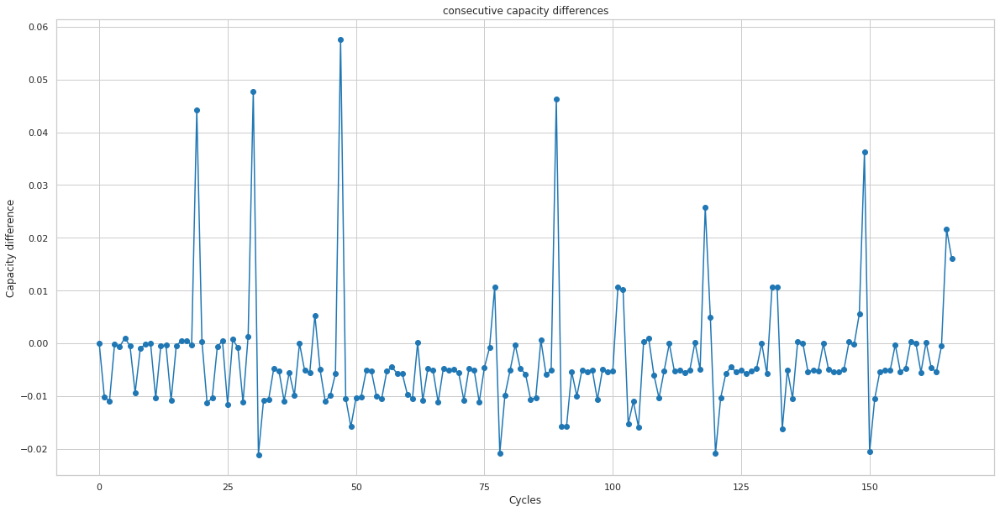

In [99]:
# Calculating differences between consecutive capacities

cap_diff = np.array([0]) # Default value for 0th index
capacity = [d['capacity'] for d in B5_data]

for idx in range(1,len(capacity)):
  # print(idx,' : ', capacity[idx], '-', capacity[idx-1],'=', capacity[idx] - capacity[idx-1])
  cap_diff = np.append(cap_diff, capacity[idx] - capacity[idx-1])

plt.figure(figsize=(20,10))
plt.plot(cap_diff)
plt.scatter(np.arange(len(cap_diff)), cap_diff)
plt.title('consecutive capacity differences')
plt.xlabel('Cycles')
plt.ylabel('Capacity difference')
plt.show()

In [100]:
# indices of the six positive peakes
spike_indices = np.argsort(cap_diff)[::-1][:7].tolist()
print('Indices at spikes in capacity:',spike_indices)

Indices at spikes in capacity: [47, 30, 89, 19, 149, 118, 165]


In [101]:
cap_diff[spike_indices]

array([0.05753266, 0.04772551, 0.04636315, 0.04424837, 0.03624925,
       0.02579368, 0.02156284])

In [102]:
for i in spike_indices:
  print('At id ',i,' : ', B5_data[i]['capacity'], '-', B5_data[i-1]['capacity'],'=', B5_data[i]['capacity'] - B5_data[i-1]['capacity'])

At id  47  :  1.7936240148573608 - 1.7360913511847138 = 0.05753266367264698
At id  30  :  1.8518025516704486 - 1.804077040117352 = 0.04772551155309657
At id  89  :  1.5638491446744425 - 1.5174859938489869 = 0.04636315082545561
At id  19  :  1.8470259949329193 - 1.8027776247196041 = 0.04424837021331518
At id  149  :  1.3601216766554785 - 1.323872422244268 = 0.03624925441121052
At id  118  :  1.4333920485221476 - 1.4075983731469897 = 0.025793675375157976
At id  165  :  1.3090153642307354 - 1.2874525221379407 = 0.021562842092794687


## Log error or influence of external factors?

==================== Charge data ====================


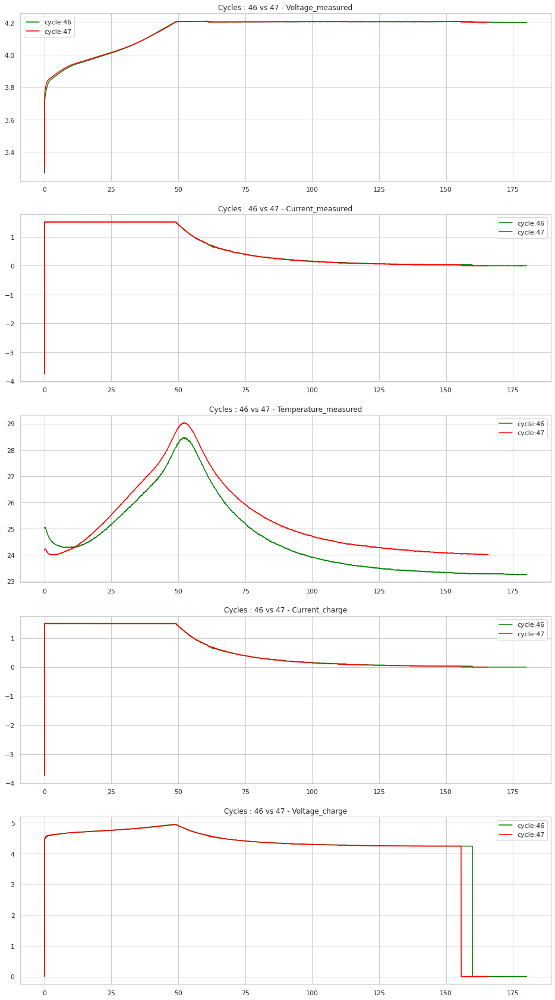

==================== Discharge data ====================


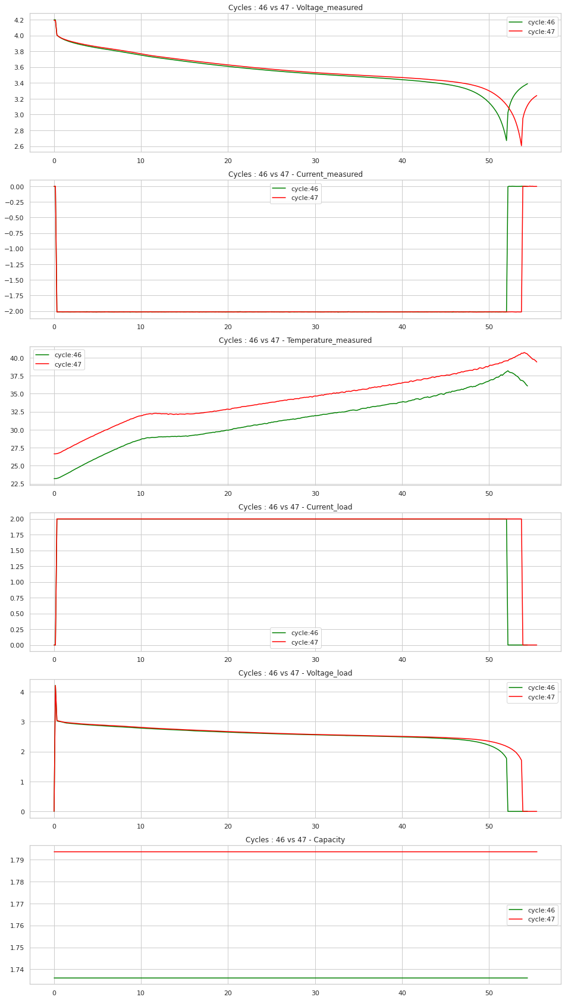

In [103]:
# Below plots are to understand if the capacity is influenced by external parameters 
# or error in reading. In order to observe it, plots of pre and post cycles of anomoly
# Indices are analysed

# charge cycles for 47 vs 46
id0 = 46
idn = 47
profiles = cprofiles
xax = len(profiles)
fig,ax = plt.subplots(xax,2, figsize=(16,30))
print('='*20, 'Charge data','='*20)
for i,_ in enumerate(profiles):
  plt.subplot(xax, 1, i+1)
  sns.lineplot(x=B5_data[id0]['charge']['data']['Time']/60, 
                y=B5_data[id0]['charge']['data'][profiles[i]], 
                label='cycle:'+str(id0),
                color='g')
  sns.lineplot(x=B5_data[idn]['charge']['data']['Time']/60, 
                y=B5_data[idn]['charge']['data'][profiles[i]],
                label='cycle:'+str(idn),
                color='r')
  plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])

plt.show()


# Discharge cycles for 47 vs 46
profiles = dprofiles
xax = len(profiles)
fig,ax = plt.subplots(xax,2, figsize=(16,30))
print('='*20, 'Discharge data','='*20)
for i,_ in enumerate(profiles):
  plt.subplot(xax, 1, i+1)
  sns.lineplot(x=B5_data[id0]['discharge']['data']['Time']/60, 
                y=B5_data[id0]['discharge']['data'][profiles[i]], 
                label='cycle:'+str(id0),
                color='g')
  sns.lineplot(x=B5_data[idn]['discharge']['data']['Time']/60, 
                y=B5_data[idn]['discharge']['data'][profiles[i]],
                label='cycle:'+str(idn),
                color='r')
  plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])

plt.show()

* Majority of the difference is in Temperature.So plotting only temperature for pre and post cycles of 47th cycle

==================== Charge data ====================


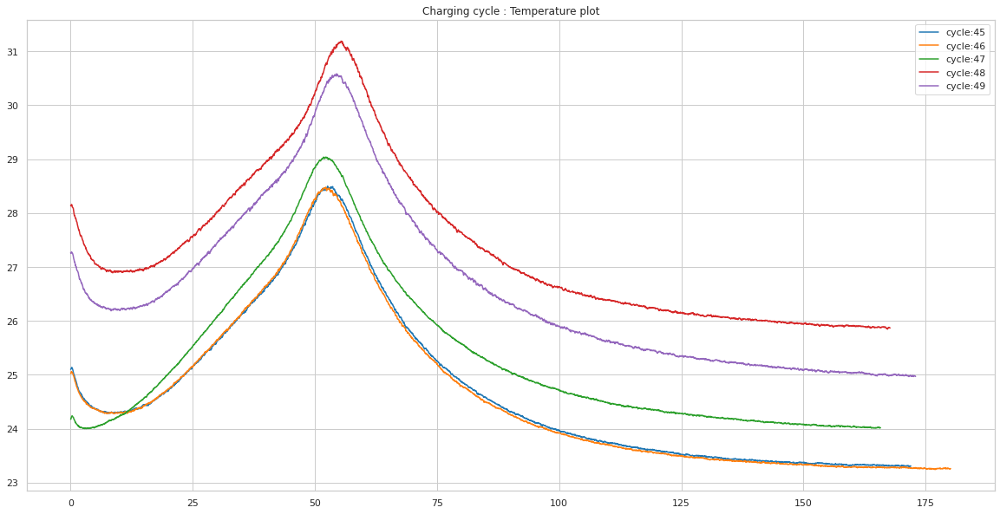

==================== Discharge data ====================


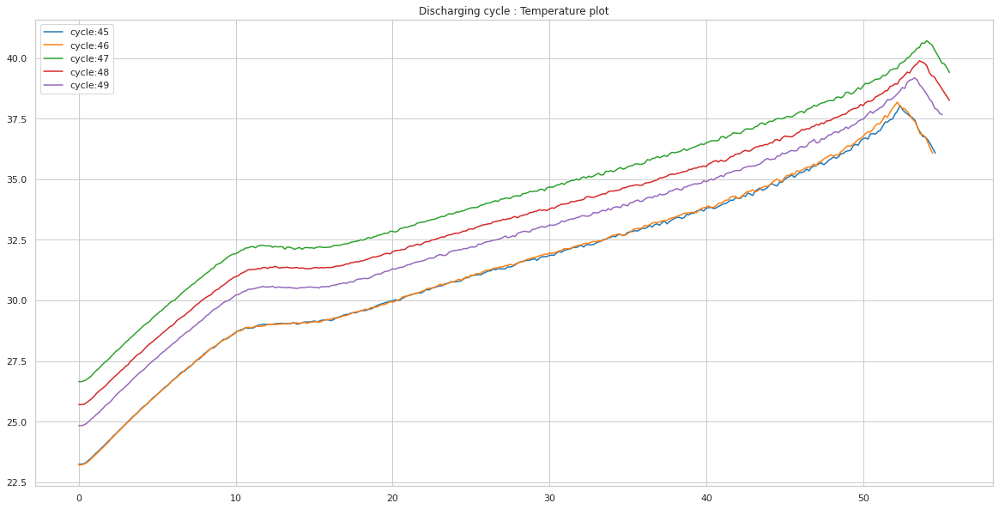

In [104]:
sns.set_theme(style="whitegrid", palette="tab10")
# charge cycles for 47 vs 48
ids = [45,46,47,48, 49]
profiles = ['Temperature_measured']
xax = 2
plt.figure(figsize=(20,10))
print('='*20, 'Charge data','='*20)
for i,id in enumerate(ids):
  sns.lineplot(x=B5_data[id]['charge']['data']['Time']/60, 
                y=B5_data[id]['charge']['data'][profiles[0]], 
                label='cycle:'+str(id))
  plt.title('Charging cycle : Temperature plot')
plt.show()

print('='*20, 'Discharge data','='*20)
plt.figure(figsize=(20,10))
for i,id in enumerate(ids):
  sns.lineplot(x=B5_data[id]['discharge']['data']['Time']/60, 
                y=B5_data[id]['discharge']['data'][profiles[0]], 
                label='cycle:'+str(id))
  plt.title('Discharging cycle : Temperature plot')
plt.show()

* The anomaly is in cycle 47. From the above plots in charge and discharge cycles, there is an abnormal increase in temperature for cycles from 47 in charge cycle, but in discharge, the temperature increased in instance of 47 but decreasing for 48 and 49 cycles.
* The cycles 45 and 46 are absolutely similar and nothing out of ordinary. From cycle 47, there is a sudden change in behaviour of temperature in both charge and discharge cycles. 
* The attempt here is to see if there is a gradual change or sudden change as cycles went from 45 to 48. In this case, there is sudden change from 46 to 47 and gradual change from 47 to 59

==================== Charge data ====================


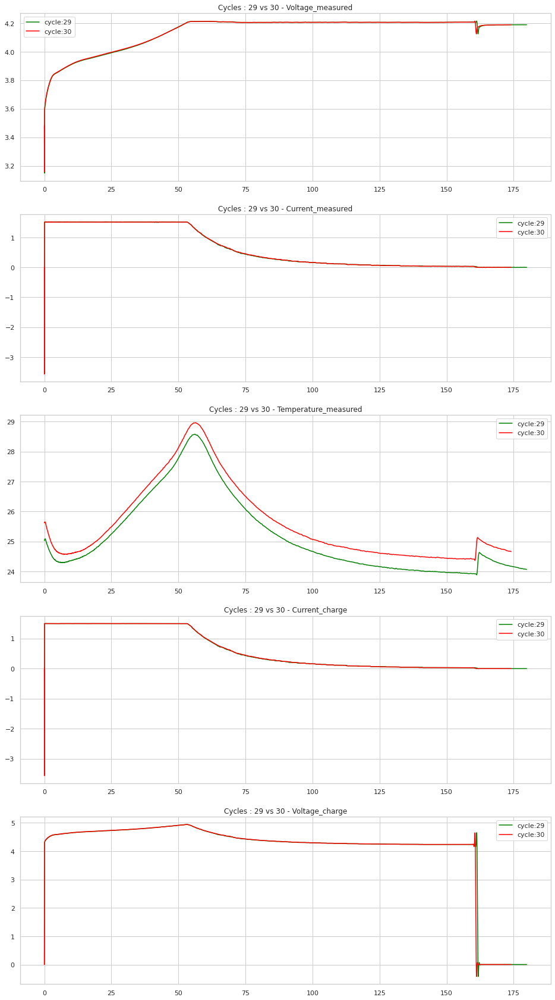

==================== Discharge data ====================


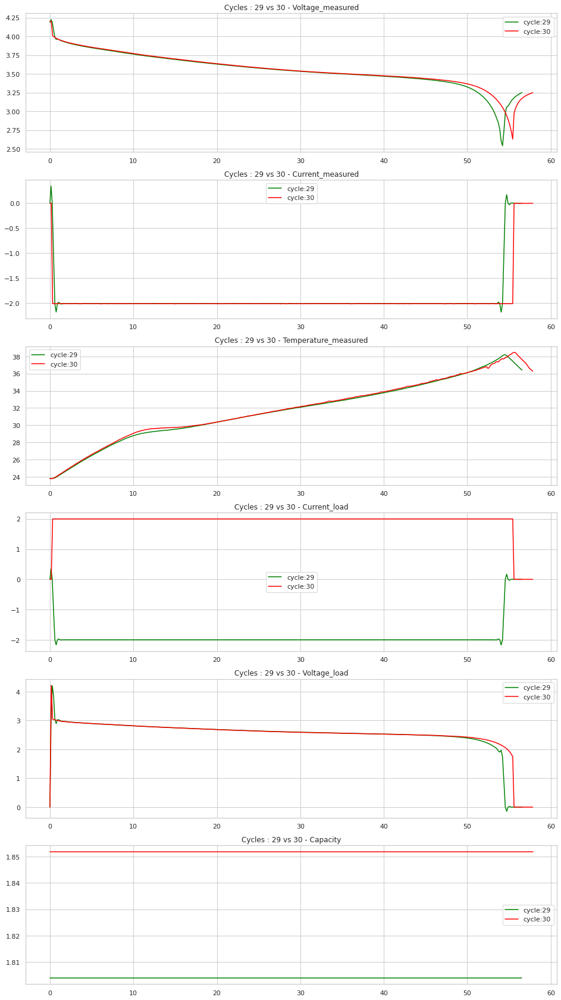

In [105]:
# charge cycles for 47 vs 46
id0 = 29
idn = 30
profiles = cprofiles
xax = len(profiles)
fig,ax = plt.subplots(xax,2, figsize=(16,30))
print('='*20, 'Charge data','='*20)
for i,_ in enumerate(profiles):
  plt.subplot(xax, 1, i+1)
  sns.lineplot(x=B5_data[id0]['charge']['data']['Time']/60, 
                y=B5_data[id0]['charge']['data'][profiles[i]], 
                label='cycle:'+str(id0),
                color='g')
  sns.lineplot(x=B5_data[idn]['charge']['data']['Time']/60, 
                y=B5_data[idn]['charge']['data'][profiles[i]],
                label='cycle:'+str(idn),
                color='r')
  plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])

plt.show()


# Discharge cycles for 47 vs 46
profiles = dprofiles
xax = len(profiles)
fig,ax = plt.subplots(xax,2, figsize=(16,30))
print('='*20, 'Discharge data','='*20)
for i,_ in enumerate(profiles):
  plt.subplot(xax, 1, i+1)
  sns.lineplot(x=B5_data[id0]['discharge']['data']['Time']/60, 
                y=B5_data[id0]['discharge']['data'][profiles[i]], 
                label='cycle:'+str(id0),
                color='g')
  sns.lineplot(x=B5_data[idn]['discharge']['data']['Time']/60, 
                y=B5_data[idn]['discharge']['data'][profiles[i]],
                label='cycle:'+str(idn),
                color='r')
  plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])

plt.show()

==================== Charge data ====================


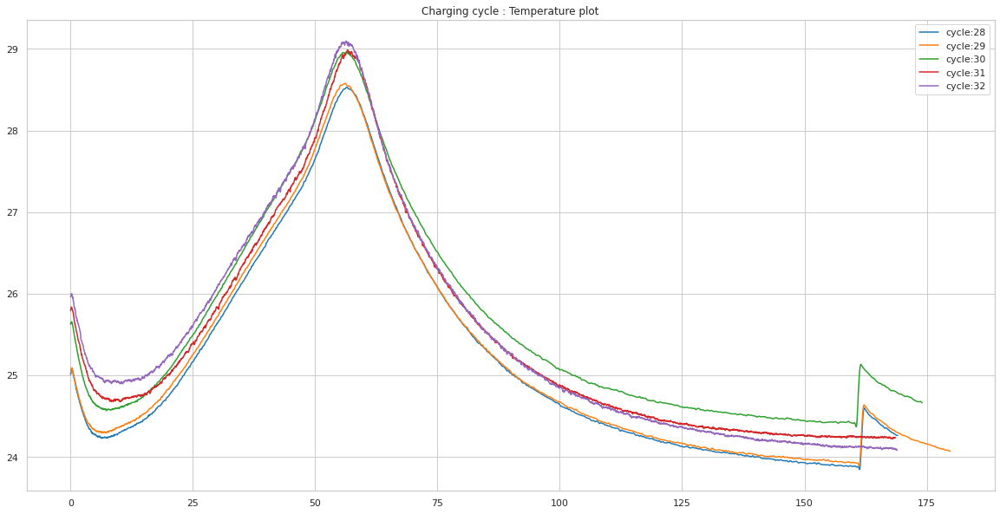

==================== Discharge data ====================


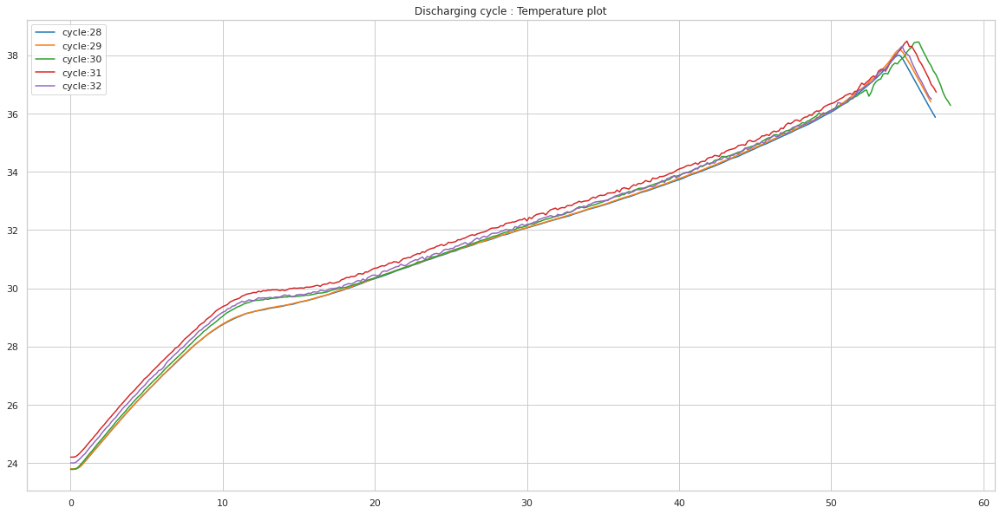

In [106]:
sns.set_theme(style="whitegrid", palette="tab10")
# charge cycles for 47 vs 48
ids = [28,29,30,31, 32]
profiles = ['Temperature_measured']
xax = 2
plt.figure(figsize=(20,10))
print('='*20, 'Charge data','='*20)
for i,id in enumerate(ids):
  sns.lineplot(x=B5_data[id]['charge']['data']['Time']/60, 
                y=B5_data[id]['charge']['data'][profiles[0]], 
                label='cycle:'+str(id))
  plt.title('Charging cycle : Temperature plot')
plt.show()

print('='*20, 'Discharge data','='*20)
plt.figure(figsize=(20,10))
for i,id in enumerate(ids):
  sns.lineplot(x=B5_data[id]['discharge']['data']['Time']/60, 
                y=B5_data[id]['discharge']['data'][profiles[0]], 
                label='cycle:'+str(id))
  plt.title('Discharging cycle : Temperature plot')
plt.show()

* The scenario for anomoly at 30 is sligltly different from 47th cycle. In this case, the differences in temperatures is significantly lesser than 47 but considerably noticable. 
* For now, it can be assumed that there is no problem (i.e. error in measurement or noise) in cell capacity readings. whenever there is an abrupt change in cell ratings, the other parameters are changed similarly (when observed from cell capacity plot)
* If similar pattern is present in next anomoly index as well, then the anomolies are not noise, so no preprocess is not necessary for capacity data

==================== Charge data ====================


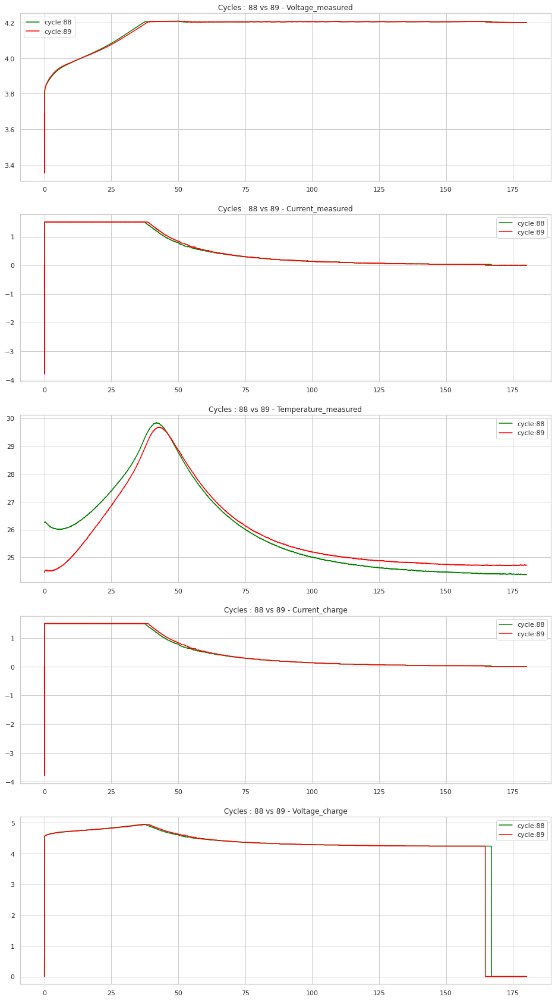

==================== Discharge data ====================


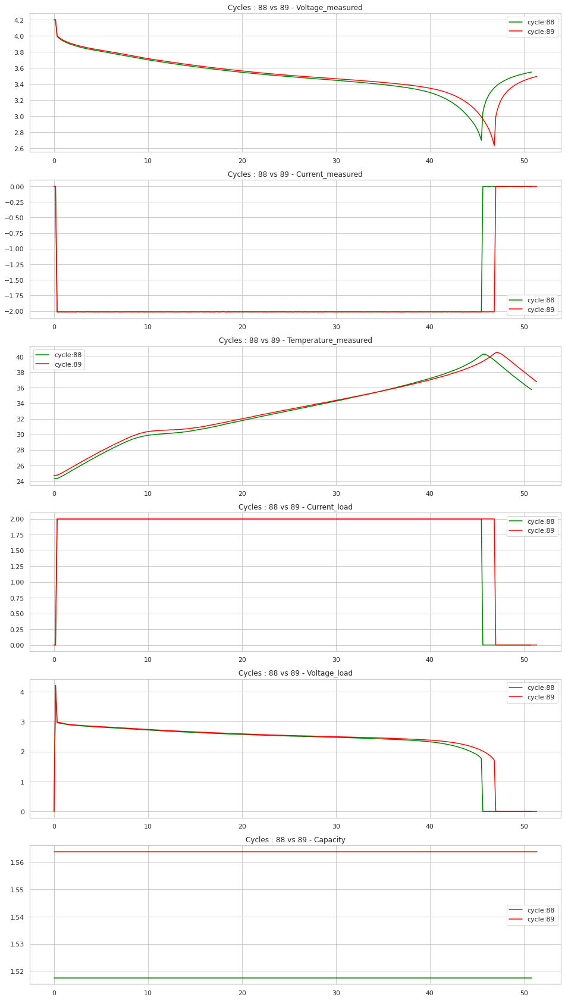

In [107]:
# charge cycles for 88 vs 89
id0 = 88
idn = 89
profiles = cprofiles
xax = len(profiles)
fig,ax = plt.subplots(xax,2, figsize=(16,30))
print('='*20, 'Charge data','='*20)
for i,_ in enumerate(profiles):
  plt.subplot(xax, 1, i+1)
  sns.lineplot(x=B5_data[id0]['charge']['data']['Time']/60, 
                y=B5_data[id0]['charge']['data'][profiles[i]], 
                label='cycle:'+str(id0),
                color='g')
  sns.lineplot(x=B5_data[idn]['charge']['data']['Time']/60, 
                y=B5_data[idn]['charge']['data'][profiles[i]],
                label='cycle:'+str(idn),
                color='r')
  plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])

plt.show()


# Discharge cycles for 88 vs 89
profiles = dprofiles
xax = len(profiles)
fig,ax = plt.subplots(xax,2, figsize=(16,30))
print('='*20, 'Discharge data','='*20)
for i,_ in enumerate(profiles):
  plt.subplot(xax, 1, i+1)
  sns.lineplot(x=B5_data[id0]['discharge']['data']['Time']/60, 
                y=B5_data[id0]['discharge']['data'][profiles[i]], 
                label='cycle:'+str(id0),
                color='g')
  sns.lineplot(x=B5_data[idn]['discharge']['data']['Time']/60, 
                y=B5_data[idn]['discharge']['data'][profiles[i]],
                label='cycle:'+str(idn),
                color='r')
  plt.title('Cycles : '+str(id0)+' vs '+str(idn)+' - '+profiles[i])

plt.show()

* The differences in charge cycle is very low, the only related difference is in duration of charge.
* In charge cycle, 89th cycle is lower initial and peak temperature than 88th cycle which is not in correlation with how capacity changed.
* In discharge cycle, there are little differences in duration of discharge, but rest of parameters are almost same.

==================== Charge data ====================


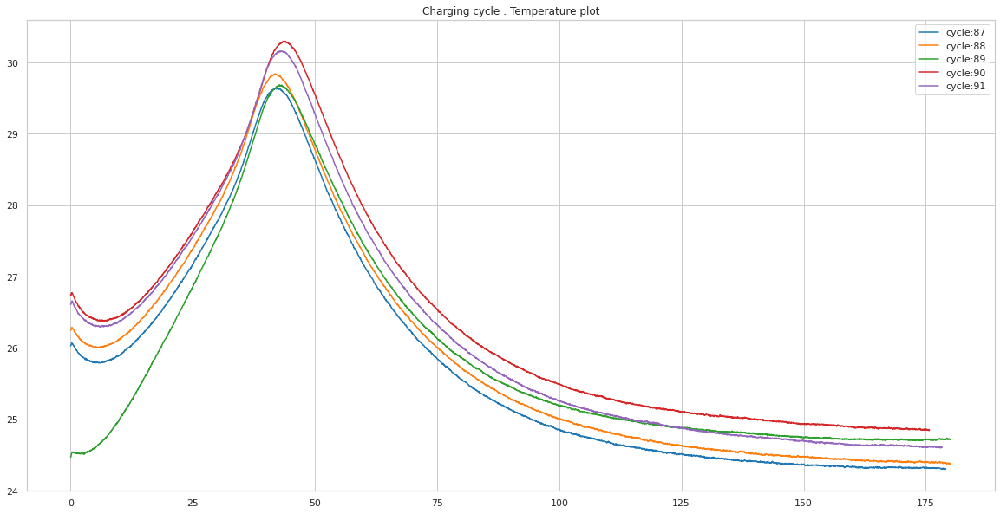

==================== Discharge data ====================


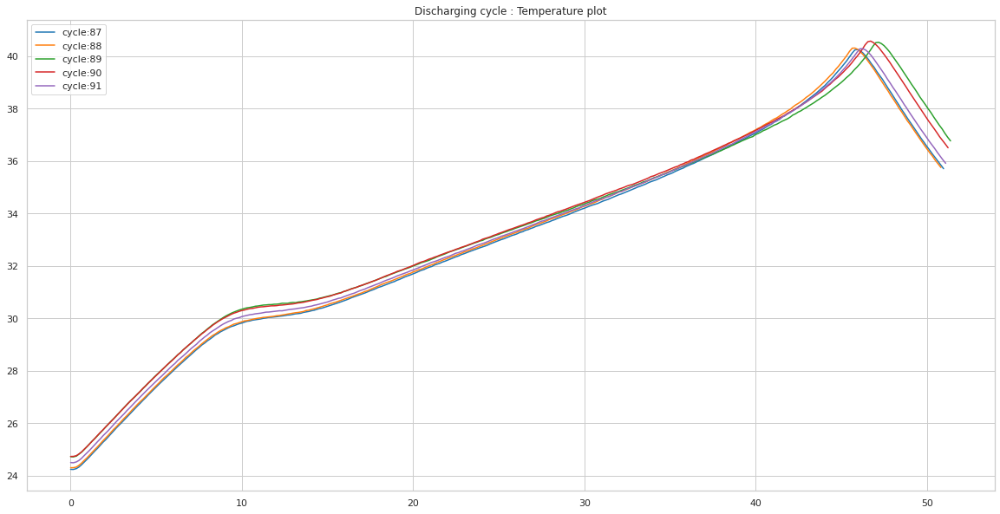

In [108]:
sns.set_theme(style="whitegrid", palette="tab10")
# charge cycles for 47 vs 48
ids = [87,88,89,90, 91]
profiles = ['Temperature_measured']
xax = 2
plt.figure(figsize=(20,10))
print('='*20, 'Charge data','='*20)
for i,id in enumerate(ids):
  sns.lineplot(x=B5_data[id]['charge']['data']['Time']/60, 
                y=B5_data[id]['charge']['data'][profiles[0]], 
                label='cycle:'+str(id))
  plt.title('Charging cycle : Temperature plot')
plt.show()

print('='*20, 'Discharge data','='*20)
plt.figure(figsize=(20,10))
for i,id in enumerate(ids):
  sns.lineplot(x=B5_data[id]['discharge']['data']['Time']/60, 
                y=B5_data[id]['discharge']['data'][profiles[0]], 
                label='cycle:'+str(id))
  plt.title('Discharging cycle : Temperature plot')
plt.show()

* In the above plot, there is no noticeable differences in discharge temperature
* In charge temperature plots, only 89th cycle has low initial temperature. this could be a reason for sudden spike in the value of capacity. So this can be assumed that the problem is not with noise in recorded data, but from external entities. Hence no preprocess is required for capacity data

## Average drop in capacity

* The capacity difference plot above can also be interpreted as rate of change plot over cycles. 

In [109]:
print('Average drop of capacity :', np.mean(cap_diff))
drop_mean = np.mean(cap_diff)

Average drop of capacity : -0.0031820843842827653


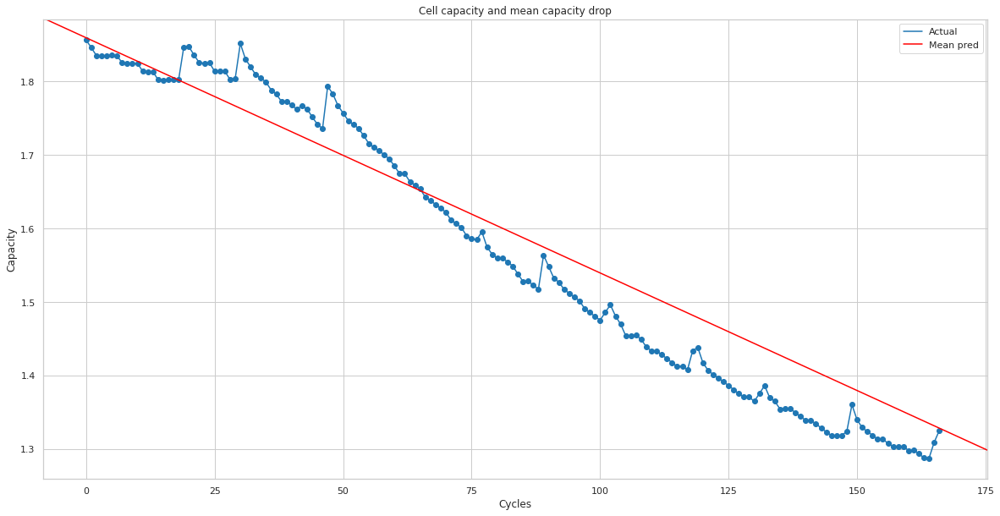

In [110]:
cap_1 = B5_data[0]['capacity']
cap_n = cap_1 + (len(B5_data)) * drop_mean

plt.figure(figsize=(20,10))
plt.plot(capacity, label='Actual')
plt.scatter(np.arange(len(capacity)),capacity)
plt.axline([1,cap_1], [len(B5_data), cap_n],color='r',label='Mean pred')
plt.title('Cell capacity and mean capacity drop')
plt.xlabel('Cycles')
plt.ylabel('Capacity')
plt.legend()
plt.show()

* The above plot is actual cell capacity and a rough prediction with mean rate of change of cell capacity
* Till around cycle 65, the actual capacity is over the predicted capacity and from cycle 65, the drop of capacity is faster as cycles increased. 
* This predicted capacity can be used as a base for comparing error in estimation

<hr>

# Metric

* Since this problem involves prediction of cell capacity, this is a regression problem.
* For regression problem, the metrics are MSE, RMSE, R squared.  
* Among these, RMSE and R Squared are suitable for usage as metrics. 
* The output of RMSE is a value with units same as predictor variable. So the RMSE value can be interpreted as mean error in capacity the model is predicting when compared with true data 
* R squared is useful to understand how well the regression model is able to accurately predict when compared to a dumb mean model. This value lies within 0 and 1 and hence will be easier to interpret as well.
* Due to presence of various abrupt changes in the capacity variable, the trend is decreasing but the dependent variable(capacity) deviates significantly which might appear as if the error is high. So it is also important to observe the region of predictions where the error is high and understand how metic is behaving in that scenario.